# **1. EDA & Feature Engineering**


In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv("stock_features_dataset.csv")
df

,Date,Open,High,Low,Close_t,Volume_t,EMA_5,EMA_20,RSI_10,MACD,...,Momentum_5,Volume_SMA_5,Volume_SMA_20,Volume_Ratio,High_Low_Range,Rolling_MaxDrawdown_30,Rolling_MaxDrawdown_60,High_Volatility_Flag,Ticker,Target_Close_t+1
0,2005-04-01,21.382381,21.813163,21.186572,21.599730,3359660,21.132580,21.894886,46.146567,-0.370275,...,1.257097,5360560.0,5522063.00,0.626737,0.012297,-0.127053,-0.127053,1,HDFCBANK.NS,21.625187
1,2005-04-04,21.617354,21.691761,21.157203,21.625187,2532680,21.288296,21.866776,46.576927,-0.339422,...,0.753870,4350264.0,5458861.00,0.582190,0.001179,-0.116318,-0.116318,1,HDFCBANK.NS,21.145452
2,2005-04-05,21.813163,22.008972,21.031884,21.145452,3840540,21.400593,21.843767,39.900540,-0.349652,...,0.117487,4439252.0,5257388.00,0.865132,-0.022184,-0.115277,-0.115277,1,HDFCBANK.NS,21.670221
3,2005-04-06,21.000554,21.813163,21.000554,21.670221,4253720,21.315546,21.777261,48.817500,-0.311820,...,0.787153,4553828.0,5044125.00,0.934098,0.024817,-0.134903,-0.134903,1,HDFCBANK.NS,22.054005
4,2005-04-07,21.930645,22.202820,21.871902,22.054005,5089240,21.433771,21.767067,54.324387,-0.248011,...,0.716660,3689176.0,4708913.00,1.379506,0.017710,-0.113434,-0.113434,1,HDFCBANK.NS,21.407841
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54137,2018-12-21,1549.345966,1561.930146,1510.296487,1513.610718,1119348,1551.117735,1530.802763,45.436965,11.444309,...,-27.089600,1002783.0,1492085.45,1.116241,-0.023065,-0.028726,-0.052268,0,INDUSINDBK.NS,1500.834351
54138,2018-12-24,1515.868174,1528.836628,1494.686319,1500.834351,757749,1538.615396,1529.165426,42.429184,7.716645,...,-68.204346,1088242.8,1496108.05,0.696305,-0.008441,-0.051128,-0.074127,0,INDUSINDBK.NS,1495.166626
54139,2018-12-26,1498.288661,1503.331949,1460.440082,1495.166626,1712424,1526.021714,1526.467228,41.088531,4.256045,...,-79.828125,1081512.2,1465714.50,1.583361,-0.003776,-0.059137,-0.081943,0,INDUSINDBK.NS,1502.419434
54140,2018-12-27,1514.907575,1530.709829,1498.288694,1502.419434,1880388,1515.736685,1523.486218,43.621446,2.074819,...,-46.734497,1227369.2,1465965.65,1.532048,0.004851,-0.062690,-0.079051,0,INDUSINDBK.NS,1520.911499


In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
df['year'] = df['Date'].dt.year
df['month'] = df['Date'].dt.month
df['day'] = df['Date'].dt.day
df

,Date,Open,High,Low,Close_t,Volume_t,EMA_5,EMA_20,RSI_10,MACD,...,Volume_Ratio,High_Low_Range,Rolling_MaxDrawdown_30,Rolling_MaxDrawdown_60,High_Volatility_Flag,Ticker,Target_Close_t+1,year,month,day
0,2005-04-01,21.382381,21.813163,21.186572,21.599730,3359660,21.132580,21.894886,46.146567,-0.370275,...,0.626737,0.012297,-0.127053,-0.127053,1,HDFCBANK.NS,21.625187,2005,4,1
1,2005-04-04,21.617354,21.691761,21.157203,21.625187,2532680,21.288296,21.866776,46.576927,-0.339422,...,0.582190,0.001179,-0.116318,-0.116318,1,HDFCBANK.NS,21.145452,2005,4,4
2,2005-04-05,21.813163,22.008972,21.031884,21.145452,3840540,21.400593,21.843767,39.900540,-0.349652,...,0.865132,-0.022184,-0.115277,-0.115277,1,HDFCBANK.NS,21.670221,2005,4,5
3,2005-04-06,21.000554,21.813163,21.000554,21.670221,4253720,21.315546,21.777261,48.817500,-0.311820,...,0.934098,0.024817,-0.134903,-0.134903,1,HDFCBANK.NS,22.054005,2005,4,6
4,2005-04-07,21.930645,22.202820,21.871902,22.054005,5089240,21.433771,21.767067,54.324387,-0.248011,...,1.379506,0.017710,-0.113434,-0.113434,1,HDFCBANK.NS,21.407841,2005,4,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54137,2018-12-21,1549.345966,1561.930146,1510.296487,1513.610718,1119348,1551.117735,1530.802763,45.436965,11.444309,...,1.116241,-0.023065,-0.028726,-0.052268,0,INDUSINDBK.NS,1500.834351,2018,12,21
54138,2018-12-24,1515.868174,1528.836628,1494.686319,1500.834351,757749,1538.615396,1529.165426,42.429184,7.716645,...,0.696305,-0.008441,-0.051128,-0.074127,0,INDUSINDBK.NS,1495.166626,2018,12,24
54139,2018-12-26,1498.288661,1503.331949,1460.440082,1495.166626,1712424,1526.021714,1526.467228,41.088531,4.256045,...,1.583361,-0.003776,-0.059137,-0.081943,0,INDUSINDBK.NS,1502.419434,2018,12,26
54140,2018-12-27,1514.907575,1530.709829,1498.288694,1502.419434,1880388,1515.736685,1523.486218,43.621446,2.074819,...,1.532048,0.004851,-0.062690,-0.079051,0,INDUSINDBK.NS,1520.911499,2018,12,27


In [ ]:
df.shape

(54142, 29)

In [ ]:
df.isnull().sum()

,0
Date,0
Open,0
High,0
Low,0
Close_t,0
Volume_t,0
EMA_5,0
EMA_20,0
RSI_10,0
MACD,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54142 entries, 0 to 54141
Data columns (total 29 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   Date                    54142 non-null  datetime64[ns]
 1   Open                    54142 non-null  float64       
 2   High                    54142 non-null  float64       
 3   Low                     54142 non-null  float64       
 4   Close_t                 54142 non-null  float64       
 5   Volume_t                54142 non-null  int64         
 6   EMA_5                   54142 non-null  float64       
 7   EMA_20                  54142 non-null  float64       
 8   RSI_10                  54142 non-null  float64       
 9   MACD                    54142 non-null  float64       
 10  Bollinger_bandwidth     54142 non-null  float64       
 11  OBV                     54142 non-null  int64         
 12  Volatility_5            54142 non-null  float6

In [ ]:
df.drop(["Date"],axis =1).describe().T

,count,mean,std,min,25%,50%,75%,max
Open,54142.0,2.481320e+02,2.910129e+02,3.620318e+00,7.629396e+01,1.518280e+02,2.639335e+02,2.026975e+03
High,54142.0,2.515272e+02,2.938964e+02,3.691742e+00,7.766177e+01,1.543686e+02,2.674109e+02,2.050079e+03
Low,54142.0,2.444627e+02,2.878910e+02,3.615854e+00,7.471677e+01,1.490916e+02,2.598141e+02,1.972974e+03
Close_t,54142.0,2.479495e+02,2.908981e+02,3.649334e+00,7.616512e+01,1.516719e+02,2.634849e+02,2.031703e+03
Volume_t,54142.0,7.938802e+06,1.089580e+07,3.828000e+03,1.690080e+06,4.338892e+06,1.033421e+07,4.022600e+08
EMA_5,54142.0,2.475129e+02,2.902640e+02,3.693447e+00,7.615124e+01,1.515705e+02,2.631762e+02,1.978034e+03
EMA_20,54142.0,2.464128e+02,2.886121e+02,3.746950e+00,7.604679e+01,1.507316e+02,2.615826e+02,1.914312e+03
RSI_10,54142.0,5.229048e+01,1.427698e+01,6.864154e+00,4.219764e+01,5.249346e+01,6.261592e+01,9.634261e+01
MACD,54142.0,1.020154e+00,7.157026e+00,-8.685118e+01,-1.511219e+00,5.172230e-01,3.039049e+00,6.903892e+01
Bollinger_bandwidth,54142.0,1.543340e-01,1.097309e-01,1.702728e-02,8.807327e-02,1.292124e-01,1.909531e-01,3.107259e+00


In [ ]:
df.drop(["Date"],axis =1).groupby("Ticker").describe().T

Ticker      AXISBANK.NS  BANKBARODA.NS  BANKINDIA.NS     CANBK.NS  \
Open count  3384.000000    3384.000000   3384.000000  3384.000000   
     mean    275.811559      98.706318    186.925229    49.348957   
     std     175.791606      46.002486     85.358420    18.460694   
     min      38.323308      22.946257     54.098536    20.217797   
     25%     132.862080      44.066430    105.990341    33.634029   
...                 ...            ...           ...          ...   
day  min       1.000000       1.000000      1.000000     1.000000   
     25%       8.000000       8.000000      8.000000     8.000000   
     50%      16.000000      16.000000     16.000000    16.000000   
     75%      23.000000      23.000000     23.000000    23.000000   
     max      31.000000      31.000000     31.000000    31.000000   

Ticker           CUB.NS  HDFCBANK.NS  ICICIBANK.NS  INDUSINDBK.NS  \
Open count  3382.000000  3384.000000   3384.000000    3384.000000   
     mean     49.654472   154.569028    172.910530     503.306875   
     std      48.558301   128.013879     72.713786     533.318772   
     min       3.620318    17.544515     39.386019      23.411922   
     25%      11.664023    53.081171    124.513146      66.810986   
...                 ...          ...           ...            ...   
day  min       1.000000     1.000000      1.000000       1.000000   
     25%       8.000000     8.000000      8.000000       8.000000   
     50%      16.000000    16.000000     16.000000      16.000000   
     75%      23.000000    23.000000     23.000000      23.000000   
     max      31.000000    31.000000     31.000000      31.000000   

Ticker          INFY.NS       ITC.NS  KOTAKBANK.NS        LT.NS       PNB.NS  \
Open count  3384.000000  3384.000000   3384.000000  3384.000000  3384.000000   
     mean    277.294814   109.667320    407.721477   634.290956   116.255705   
     std     129.213825    66.221661    340.065371   302.034370    43.066544   
     min      79.559821    17.819132     29.015837    82.549729    45.265328   
     25%     166.032992    40.955258    162.680604   456.111272    76.358700   
...                 ...          ...           ...          ...          ...   
day  min       1.000000     1.000000      1.000000     1.000000     1.000000   
     25%       8.000000     8.000000      8.000000     8.000000     8.000000   
     50%      16.000000    16.000000     16.000000    16.000000    16.000000   
     75%      23.000000    23.000000     23.000000    23.000000    23.000000   
     max      31.000000    31.000000     31.000000    31.000000    31.000000   

Ticker          SBIN.NS       TCS.NS  UNIONBANK.NS  
Open count  3384.000000  3384.000000   3384.000000  
     mean    175.343431   626.312913    131.875350  
     std      66.889478   458.302257     51.591047  
     min      42.012915    86.833908     53.891879  
     25%     129.088111   202.168905     87.488001  
...                 ...          ...           ...  
day  min       1.000000     1.000000      1.000000  
     25%       8.000000     8.000000      8.000000  
     50%      16.000000    16.000000     16.000000  
     75%      23.000000    23.000000     23.000000  
     max      31.000000    31.000000     31.000000  

[216 rows x 16 columns]

In [ ]:
df = df.sort_values(by=['Date'])
df = df.set_index(["Date"])
df

,Open,High,Low,Close_t,Volume_t,EMA_5,EMA_20,RSI_10,MACD,Bollinger_bandwidth,...,Volume_Ratio,High_Low_Range,Rolling_MaxDrawdown_30,Rolling_MaxDrawdown_60,High_Volatility_Flag,Ticker,Target_Close_t+1,year,month,day
Date,,,,,,,,,,,,,,,,,,,,,
2005-04-01,21.382381,21.813163,21.186572,21.599730,3359660,21.132580,21.894886,46.146567,-0.370275,0.227503,...,0.626737,0.012297,-0.127053,-0.127053,1,HDFCBANK.NS,21.625187,2005,4,1
2005-04-01,43.612424,45.797328,43.312533,45.026184,519228,43.754034,45.640653,47.626510,-1.251515,0.187990,...,0.653784,0.047856,-0.150720,-0.194377,1,INDUSINDBK.NS,45.883018,2005,4,1
2005-04-01,28.898003,29.745394,28.891330,29.605272,3241815,28.594172,29.227988,52.590490,-0.161878,0.232658,...,0.663323,0.018829,-0.121622,-0.121622,1,BANKBARODA.NS,29.078154,2005,4,1
2005-04-01,24.852672,25.461686,24.508178,25.344803,5327434,24.417748,25.594740,48.091573,-0.540920,0.273974,...,0.659493,0.030000,-0.144568,-0.144568,1,CANBK.NS,25.338648,2005,4,1
2005-04-01,57.062670,57.069823,55.925561,56.769451,7544530,57.146926,61.149932,31.771932,-1.793237,0.371084,...,0.455432,0.009025,-0.231213,-0.231213,1,PNB.NS,56.798061,2005,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-12-28,1238.405935,1245.024725,1229.249194,1235.519531,1740134,1233.438603,1218.721774,54.811851,15.170427,0.069102,...,0.785133,0.000887,-0.030790,-0.030790,1,KOTAKBANK.NS,1250.598389,2018,12,28
2018-12-28,566.787363,566.915549,558.200334,561.319031,4736598,560.012974,568.567074,45.437538,-2.578631,0.097159,...,0.435352,0.000228,-0.069754,-0.110758,1,INFY.NS,563.027893,2018,12,28
2018-12-28,103.943978,105.539709,103.810999,104.919144,8751088,102.698615,99.666910,70.022264,1.988910,0.153249,...,0.667347,0.016753,-0.011045,-0.011045,0,BANKBARODA.NS,105.318069,2018,12,28


### *Heatmaps*

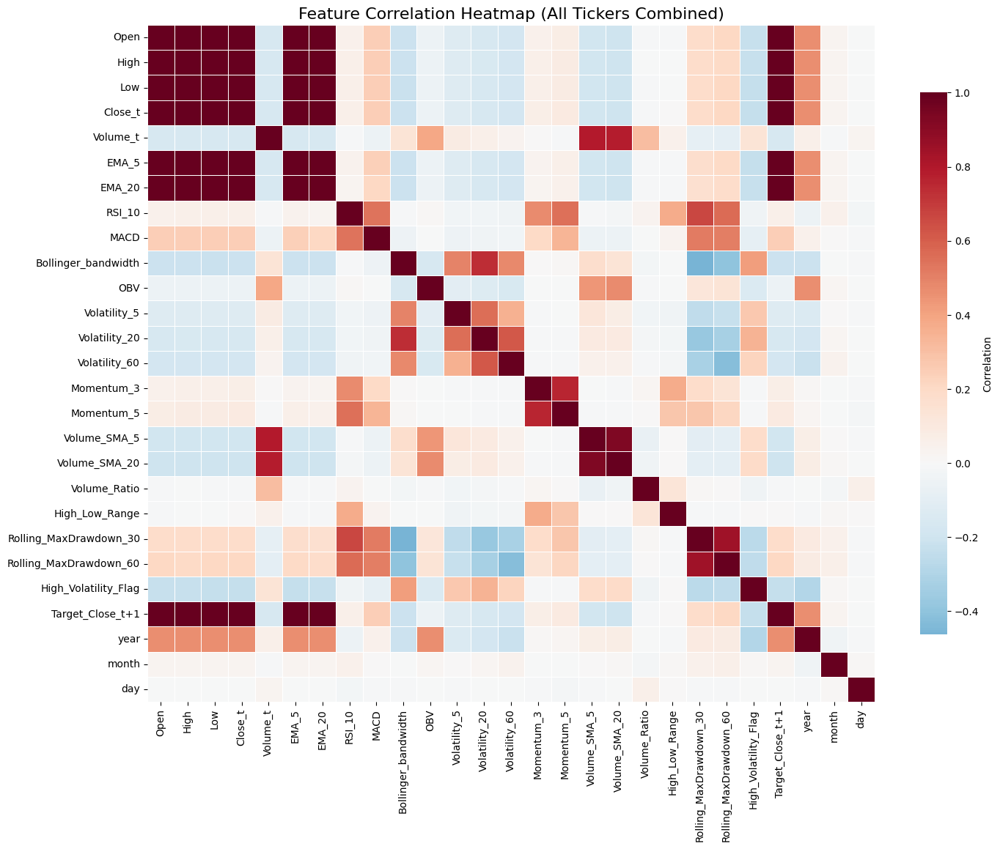

In [ ]:
df_reset = df.reset_index(drop=True)

numeric_df = df_reset.drop(columns=["Ticker"], errors="ignore")

corr = numeric_df.corr()
plt.figure(figsize=(16,12))
sns.heatmap(
    corr,
    cmap="RdBu_r",
    center=0,
    annot=False,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={"shrink": 0.8, "label": "Correlation"}
)
plt.title("Feature Correlation Heatmap (All Tickers Combined)", fontsize=16)
plt.show()


#### *Adding Rolling features*

In [ ]:
rolling_windows = [60,120,150]

for window in rolling_windows:
    df[f'SMA_{window}'] = (
        df.groupby("Ticker")["Close_t"]
          .transform(lambda x: x.shift(1).rolling(window).mean())
    )

df["RollingStd_15"] = (
    df.groupby("Ticker")["Close_t"]
      .transform(lambda x: x.rolling(15).std())
)

df["RollingStd_40"] = (
    df.groupby("Ticker")["Close_t"]
      .transform(lambda x: x.rolling(40).std())
)

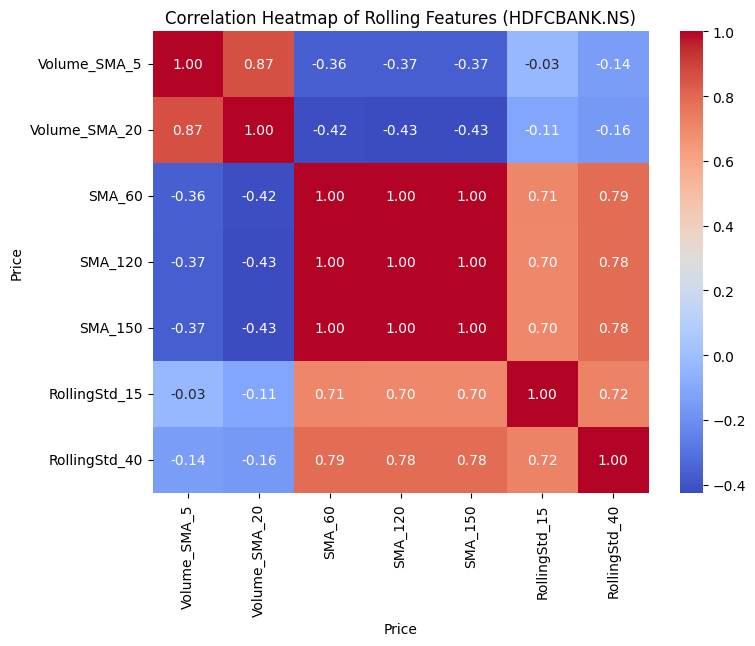

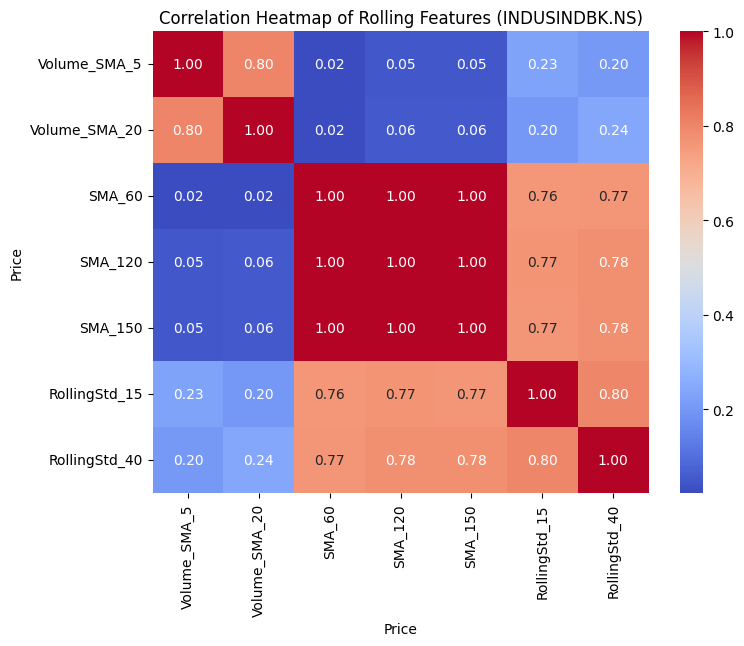

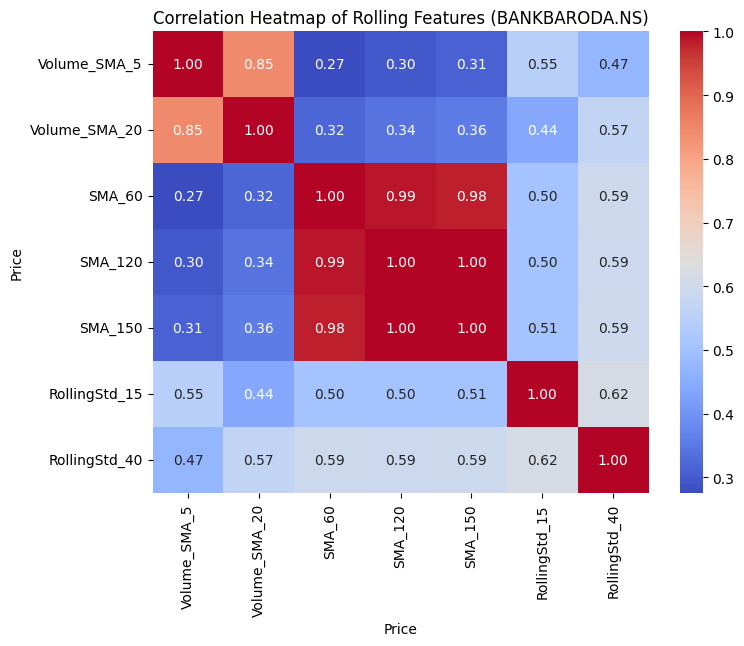

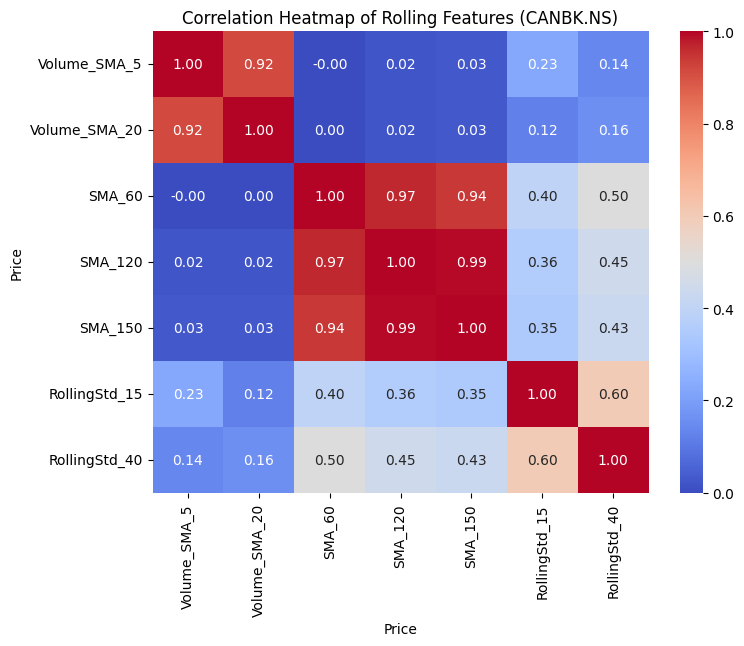

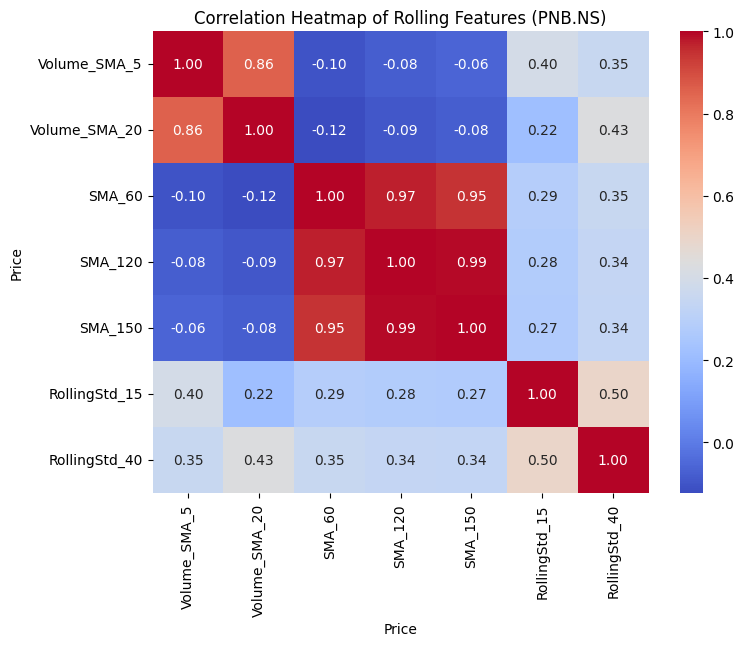

...

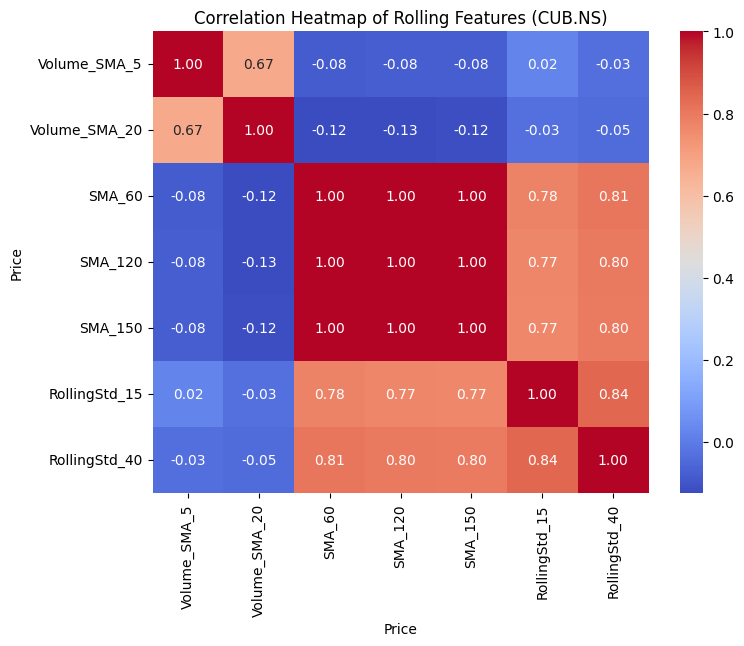

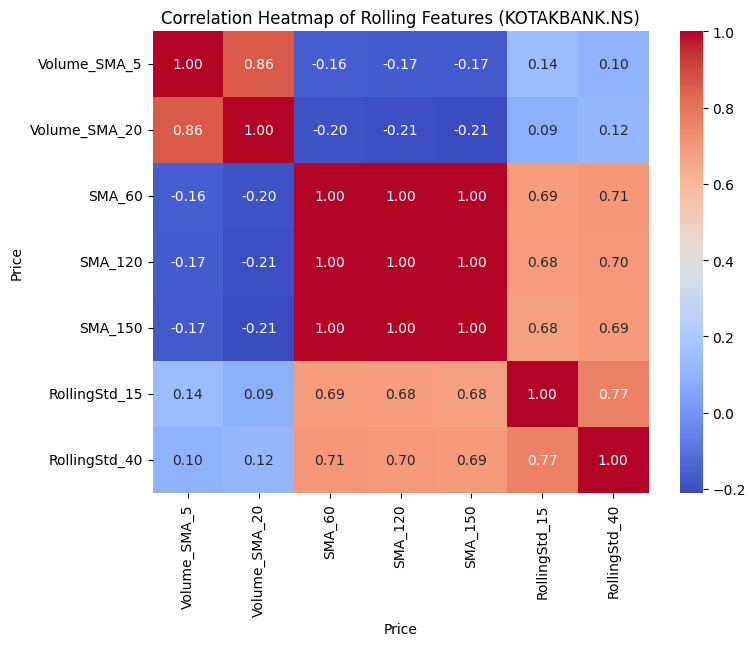

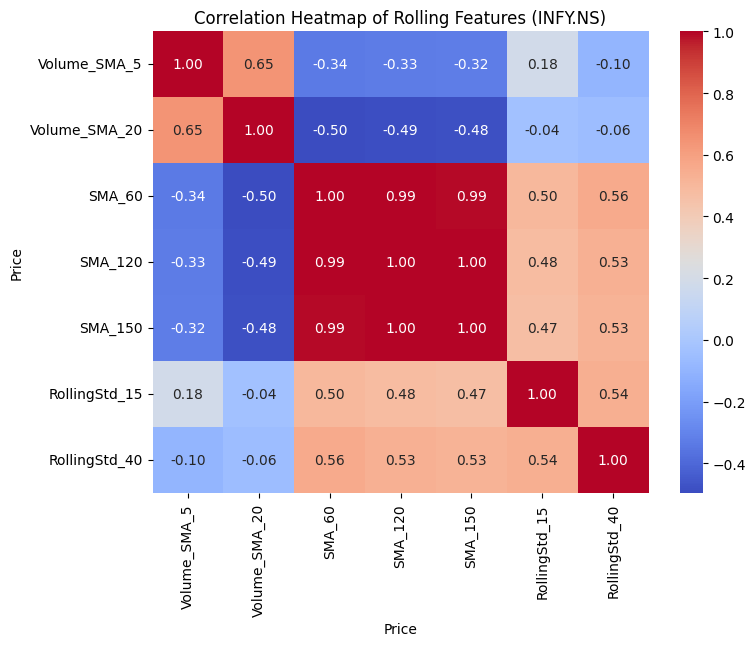

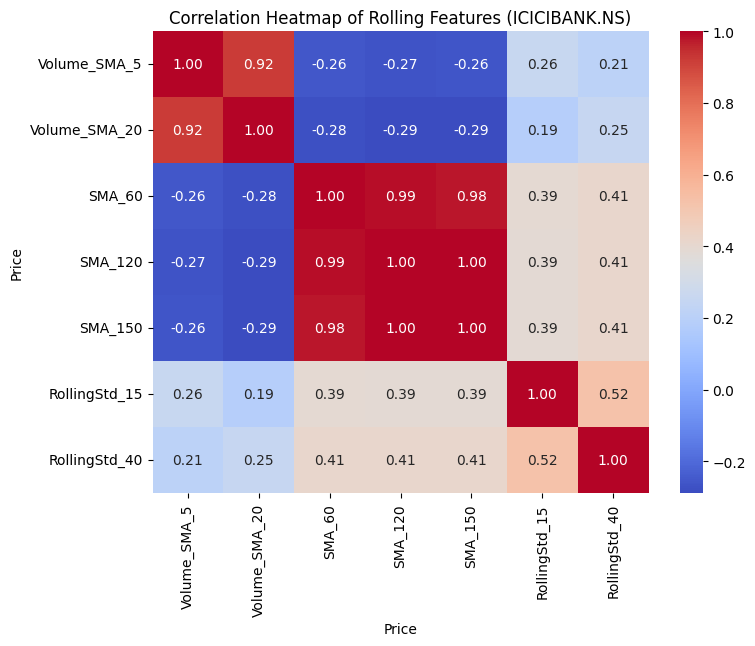

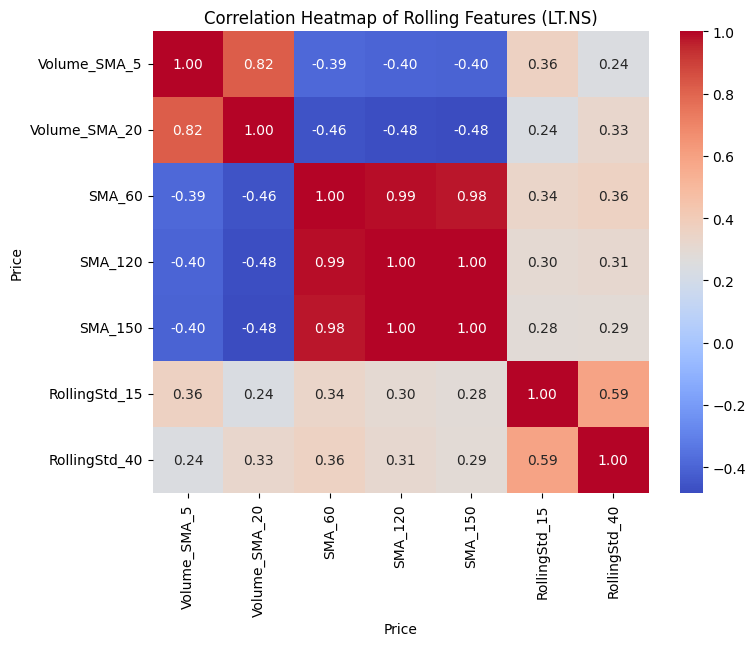

In [ ]:
rolling_features = [col for col in df.columns if 'SMA' in col or 'RollingStd' in col]

tickers = df["Ticker"].unique()

for ticker in tickers:
    df_ticker = df[df["Ticker"] == ticker]

    corr_matrix = df_ticker[rolling_features].corr()

    plt.figure(figsize=(8, 6))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", cbar=True, fmt=".2f")
    plt.title(f"Correlation Heatmap of Rolling Features ({ticker})")


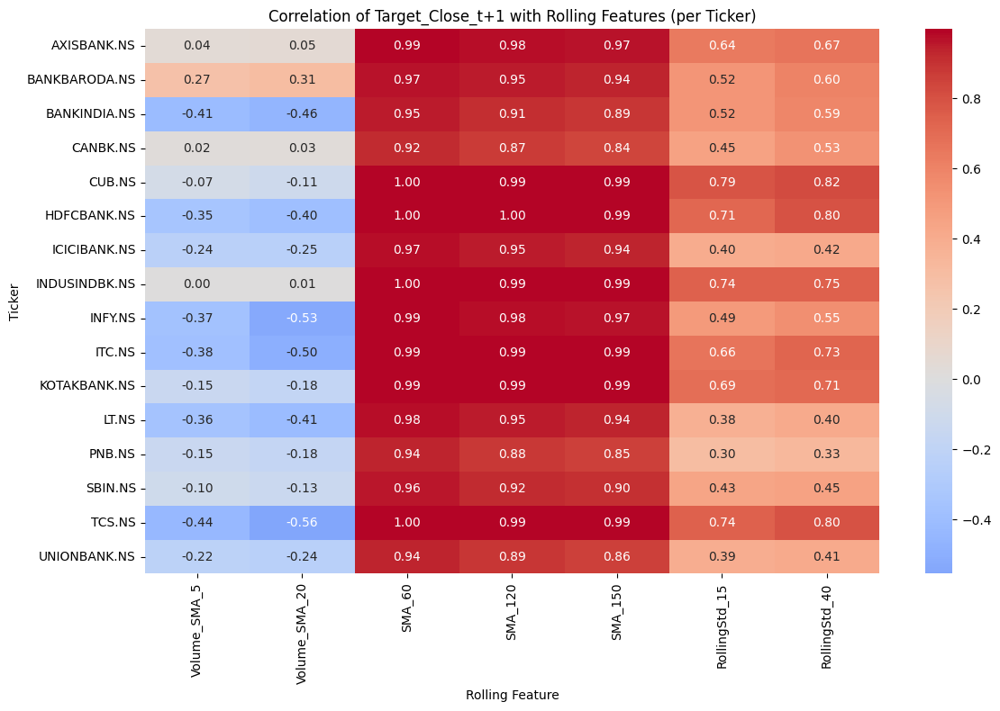

In [ ]:
rolling_cols = [col for col in df.columns if 'SMA' in col or 'RollingStd' in col]

ticker_corrs = {}

for ticker, group in df.groupby("Ticker"):
    corrs = []
    for col in rolling_cols:
        corrs.append(group["Target_Close_t+1"].corr(group[col]))
    ticker_corrs[ticker] = corrs

rolling_corr_df = pd.DataFrame(ticker_corrs, index=rolling_cols).T

plt.figure(figsize=(12, 8))
sns.heatmap(rolling_corr_df, annot=True, cmap="coolwarm", center=0, cbar=True, fmt=".2f")
plt.title("Correlation of Target_Close_t+1 with Rolling Features (per Ticker)")
plt.xlabel("Rolling Feature")
plt.ylabel("Ticker")
plt.tight_layout()
plt.show()

#### *Adding Lag features*

In [ ]:
lags = [1, 5, 20, 40, 60]
for lag in lags:
    df[f'Close_t_-{lag}'] = df.groupby("Ticker")["Close_t"].shift(lag)

tickers = df["Ticker"].unique()

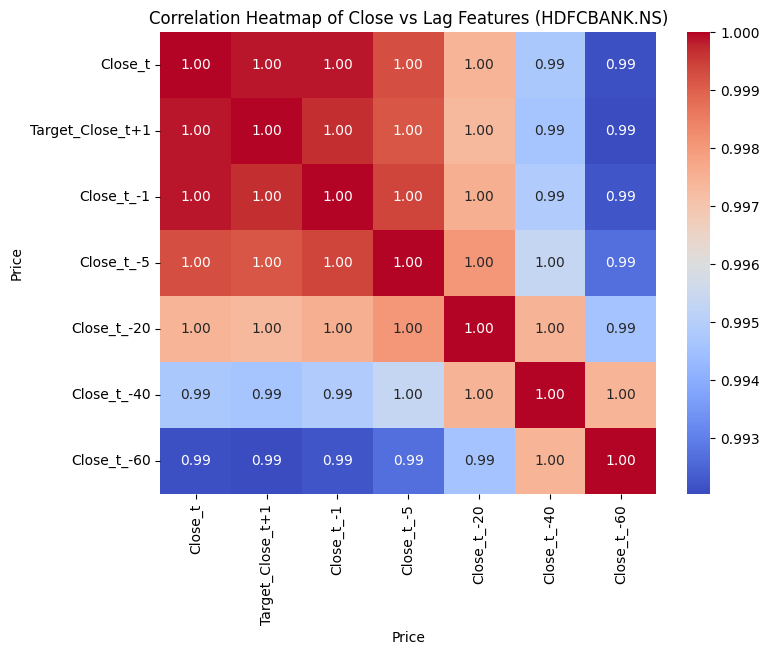

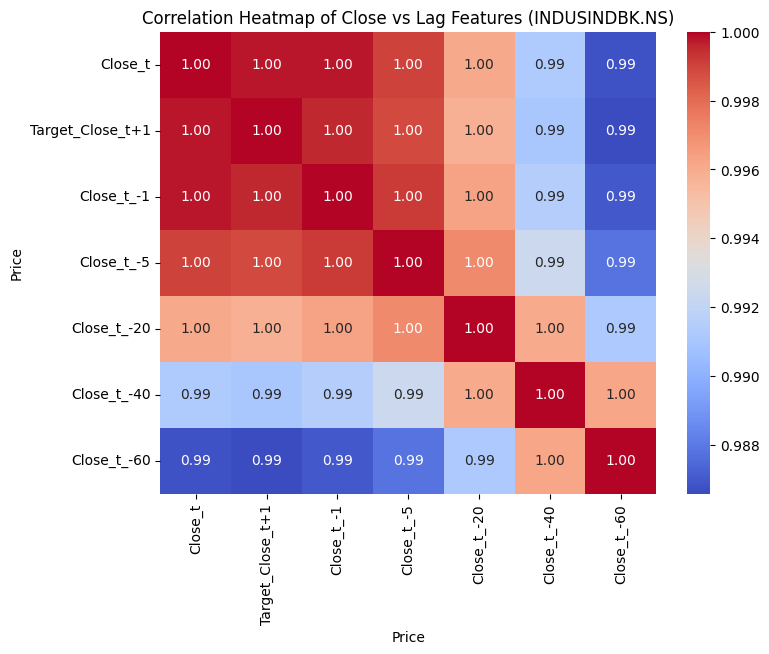

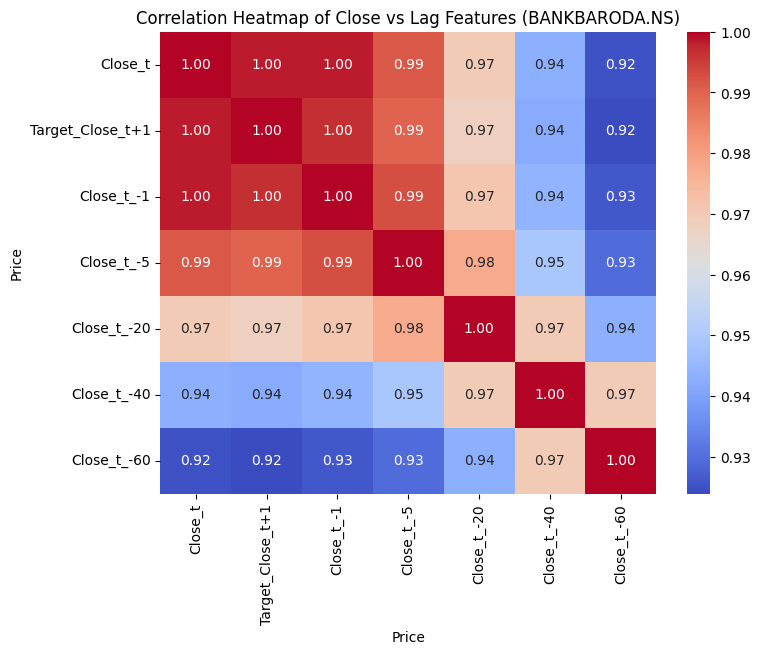

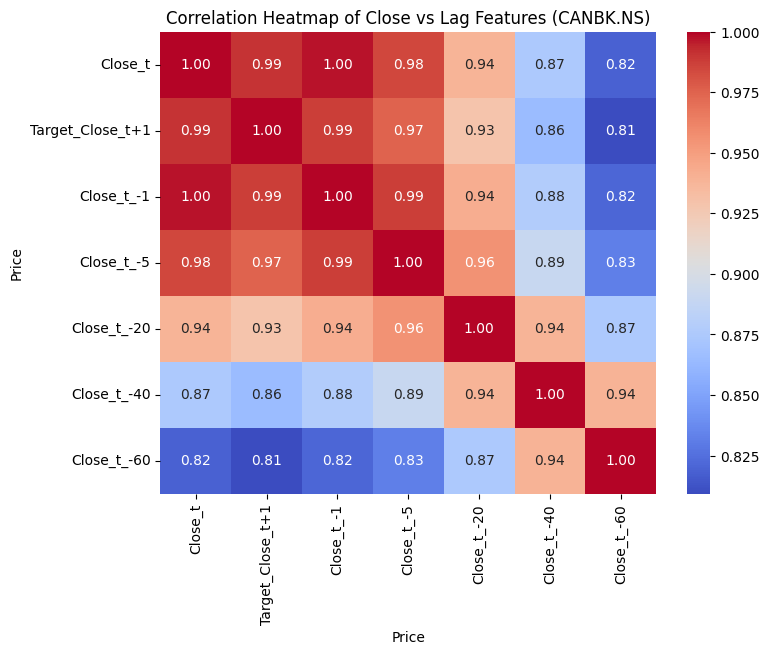

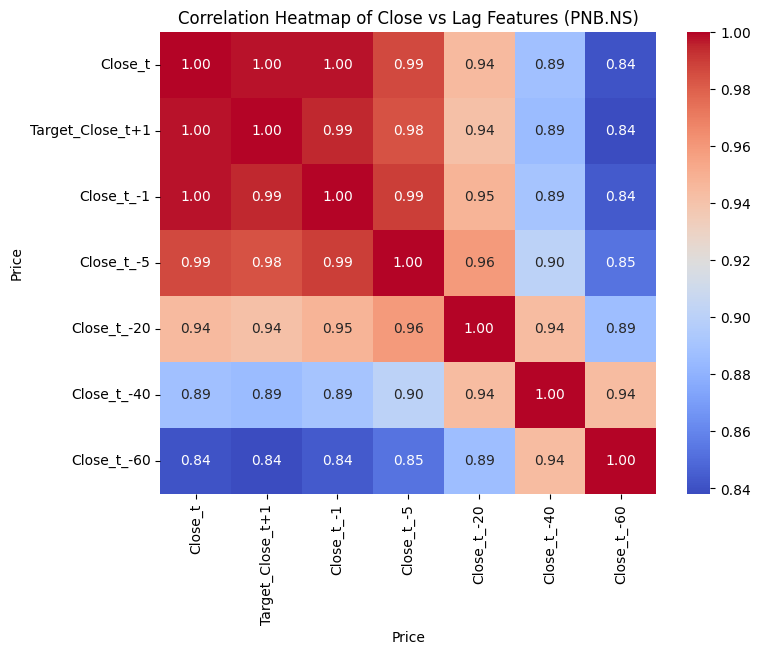

...

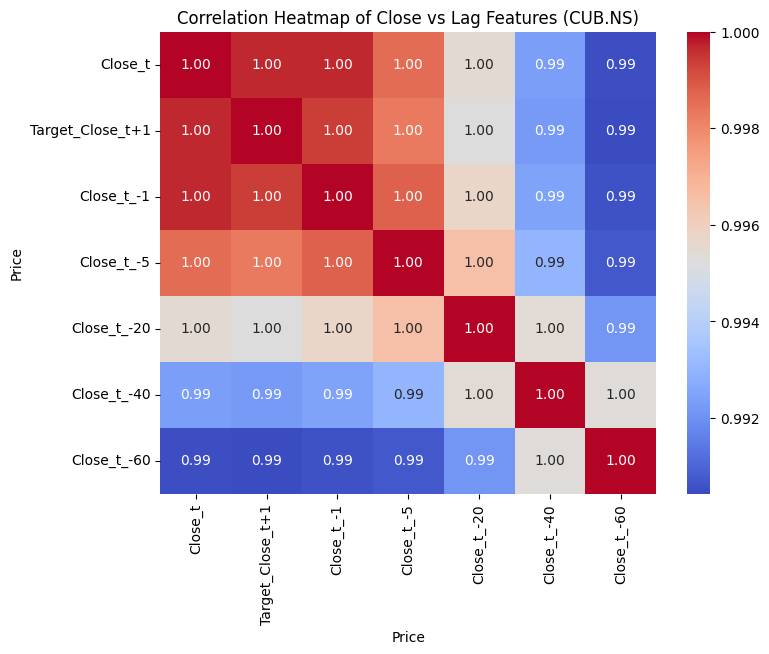

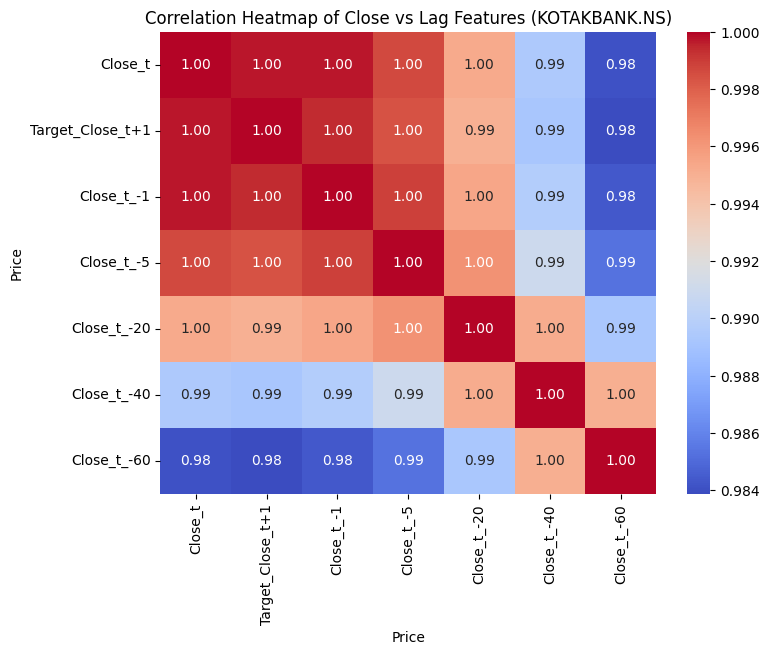

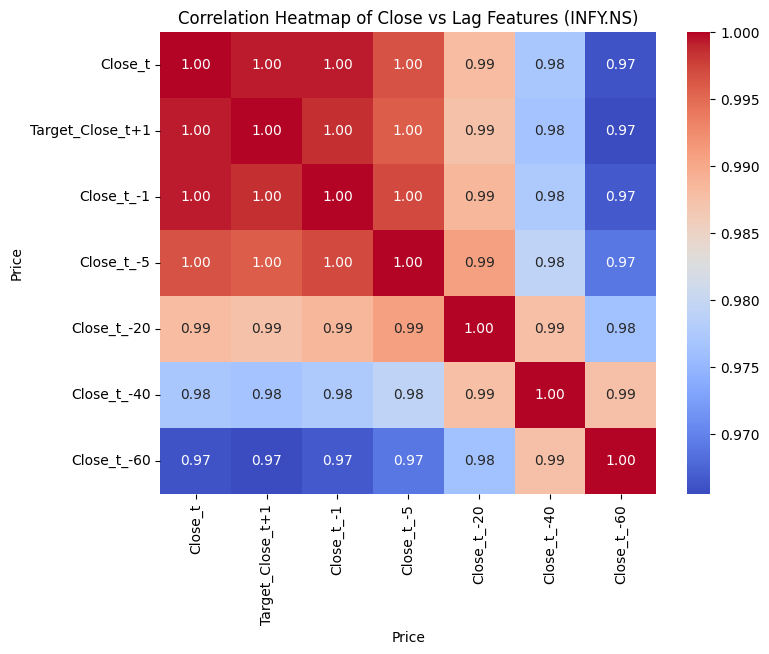

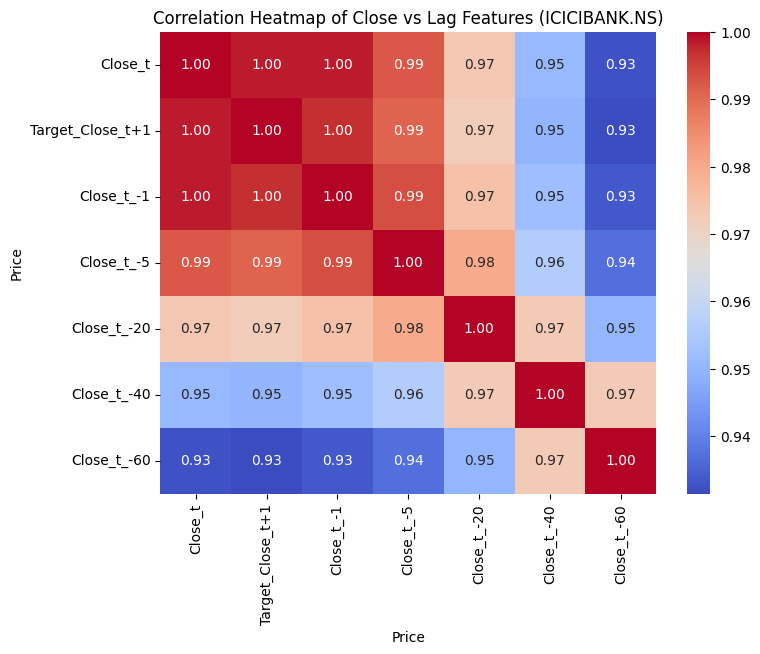

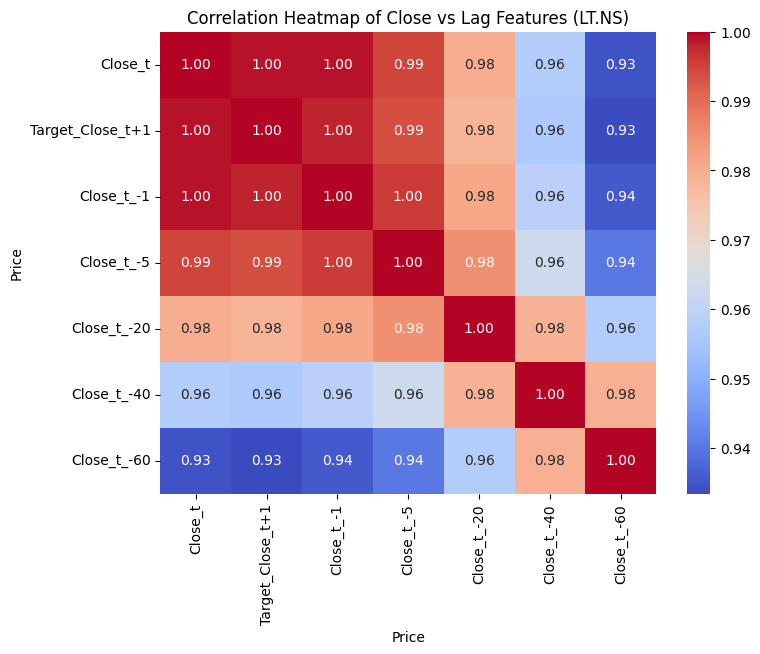

In [ ]:
for ticker in tickers:
    df_ticker = df[df["Ticker"] == ticker]

    lag_cols = [col for col in df_ticker.columns if "Close_t" in col]

    corr_matrix = df_ticker[lag_cols].corr()

    plt.figure(figsize=(8, 6))
    sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", cbar=True, fmt=".2f")
    plt.title(f"Correlation Heatmap of Close vs Lag Features ({ticker})")

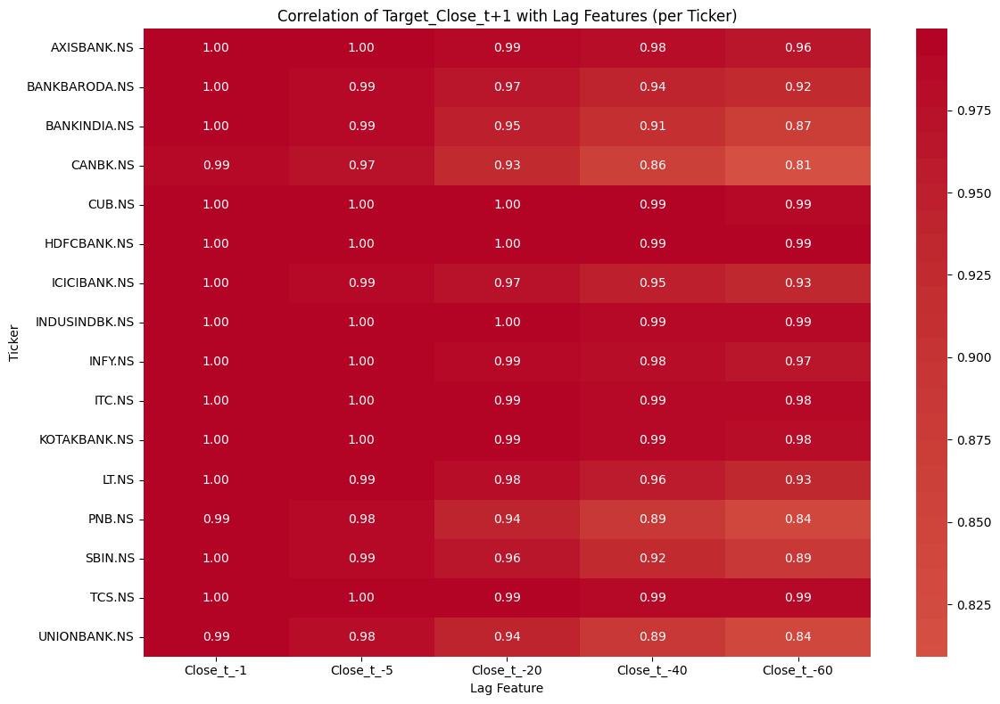

In [ ]:
lag_cols = [col for col in df.columns if  col.startswith("Close_t_-")]

ticker_corrs = {}

for ticker, group in df.groupby("Ticker"):
    corrs = []
    for col in lag_cols:
        corrs.append(group["Target_Close_t+1"].corr(group[col]))
    ticker_corrs[ticker] = corrs

lag_corr_df = pd.DataFrame(ticker_corrs, index=lag_cols).T

plt.figure(figsize=(12, 8))
sns.heatmap(lag_corr_df, annot=True, cmap="coolwarm", center=0, cbar=True, fmt=".2f")
plt.title("Correlation of Target_Close_t+1 with Lag Features (per Ticker)")
plt.xlabel("Lag Feature")
plt.ylabel("Ticker")
plt.tight_layout()
plt.show()

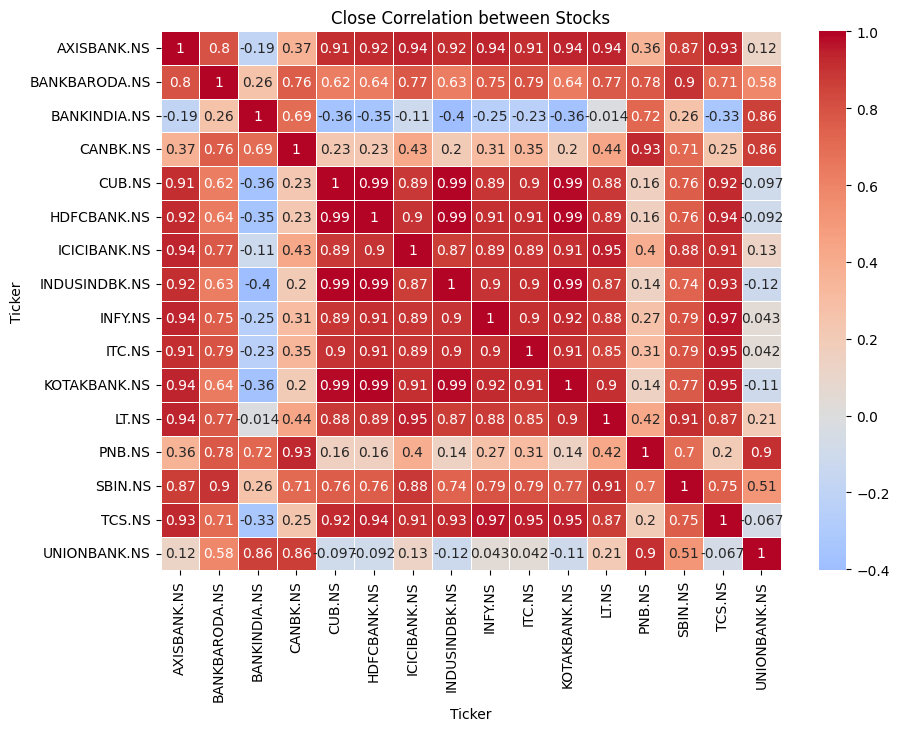

In [ ]:
pivot_df = df.pivot_table(index=df.index, columns="Ticker", values="Close_t")

plt.figure(figsize=(10, 7))
sns.heatmap(pivot_df.corr(), annot=True, cmap="coolwarm", center=0, linewidths=0.5)
plt.title("Close Correlation between Stocks")
plt.show()

### *Graphs For Visulization*



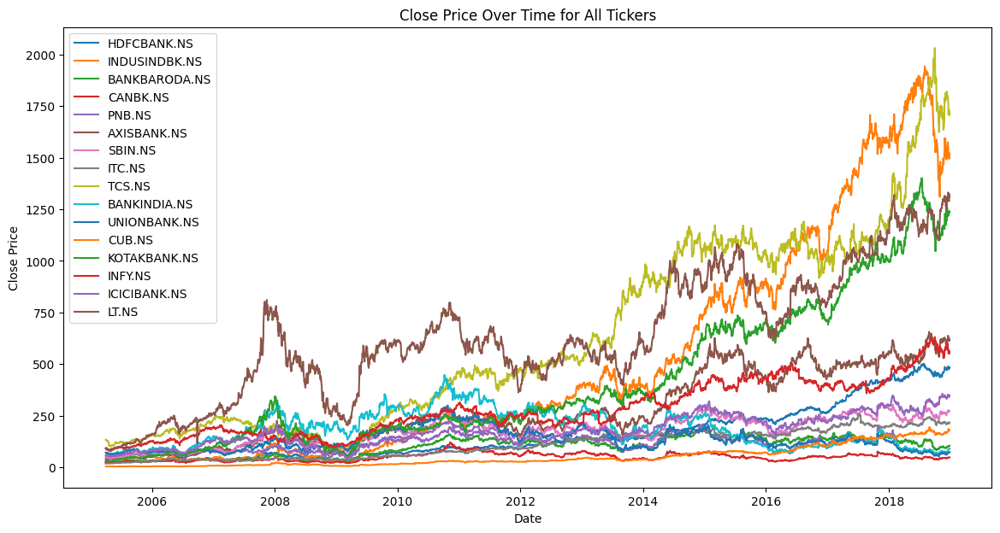

In [ ]:
plt.figure(figsize=(14, 7))

for ticker in df["Ticker"].unique():
    ticker_df = df[df["Ticker"] == ticker]
    plt.plot(ticker_df.index, ticker_df["Close_t"], label=ticker)

plt.xlabel("Date")
plt.ylabel("Close Price")
plt.title("Close Price Over Time for All Tickers")
plt.legend()
plt.show()


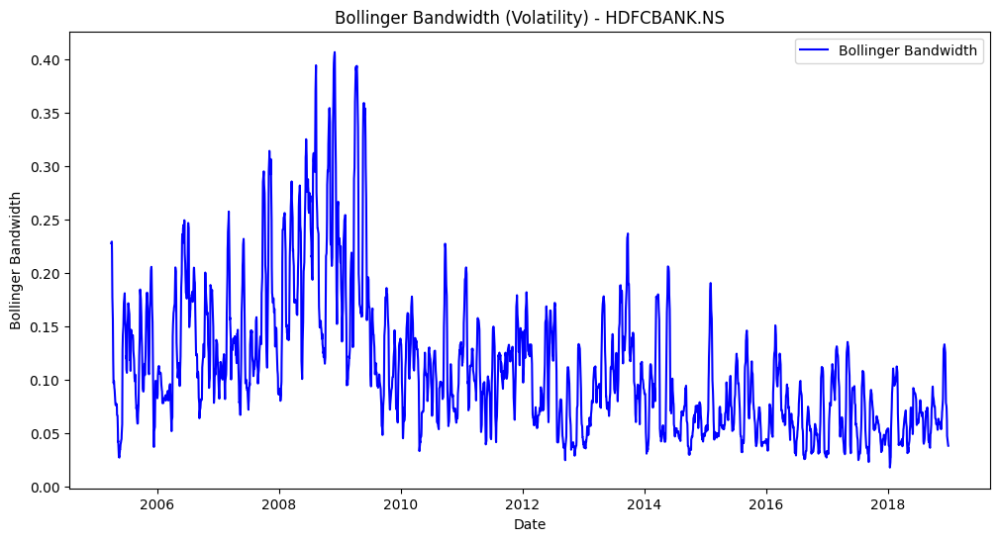

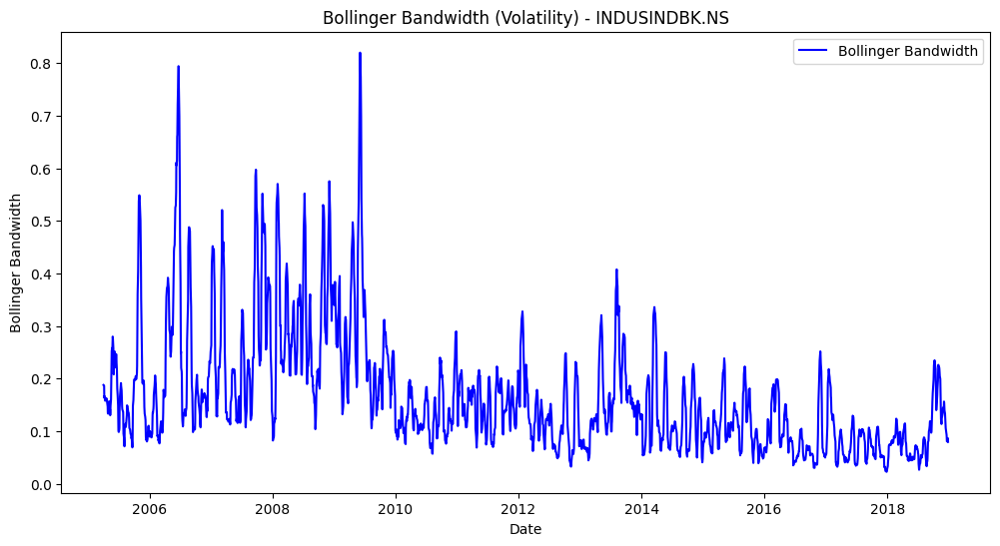

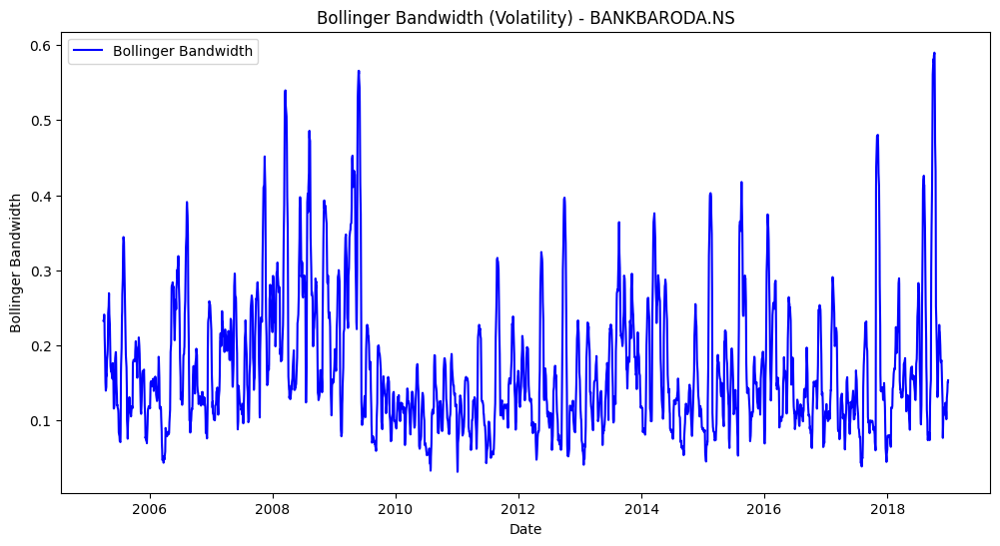

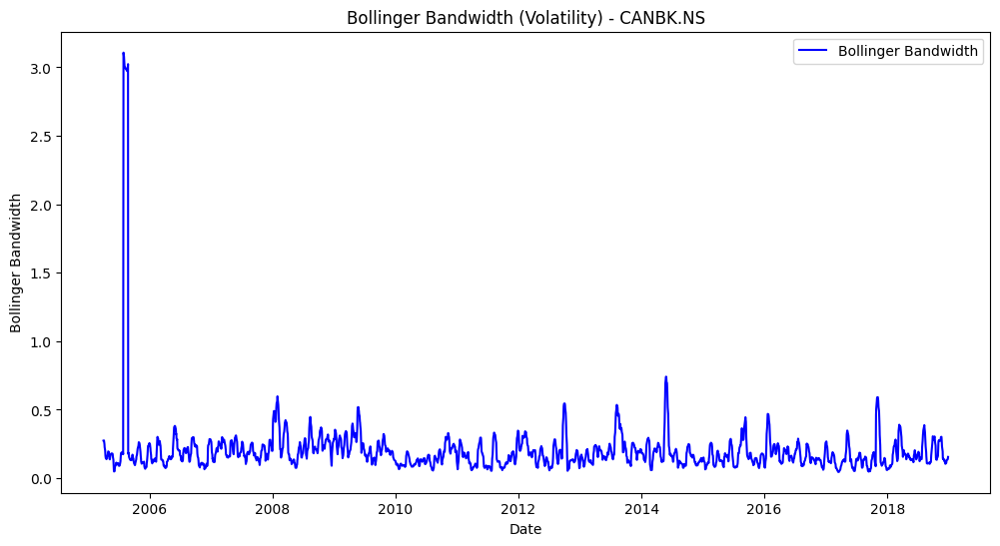

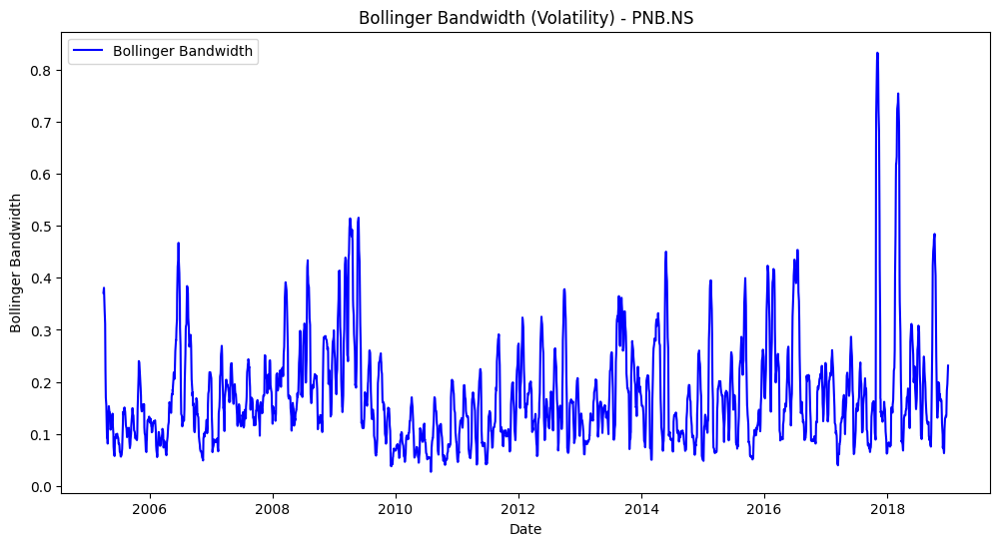

...

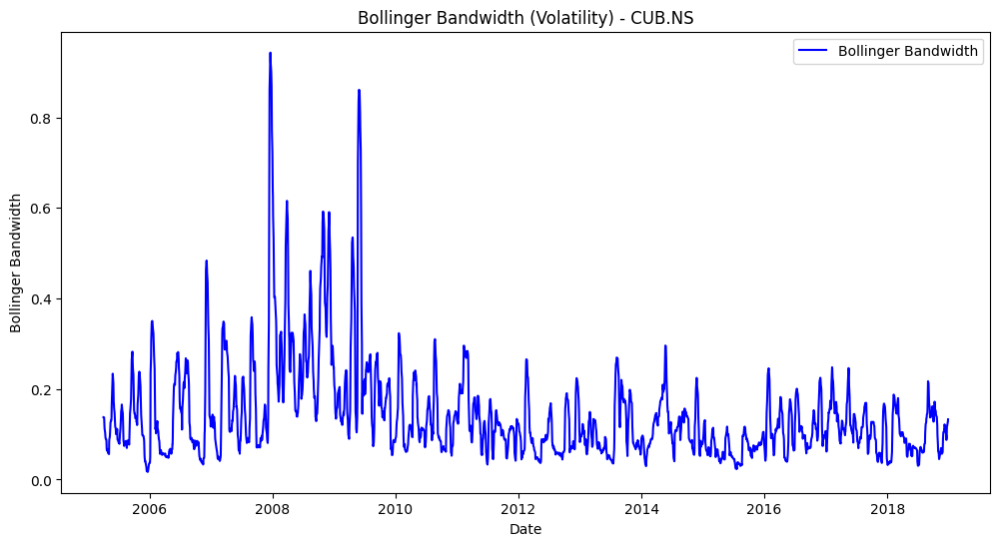

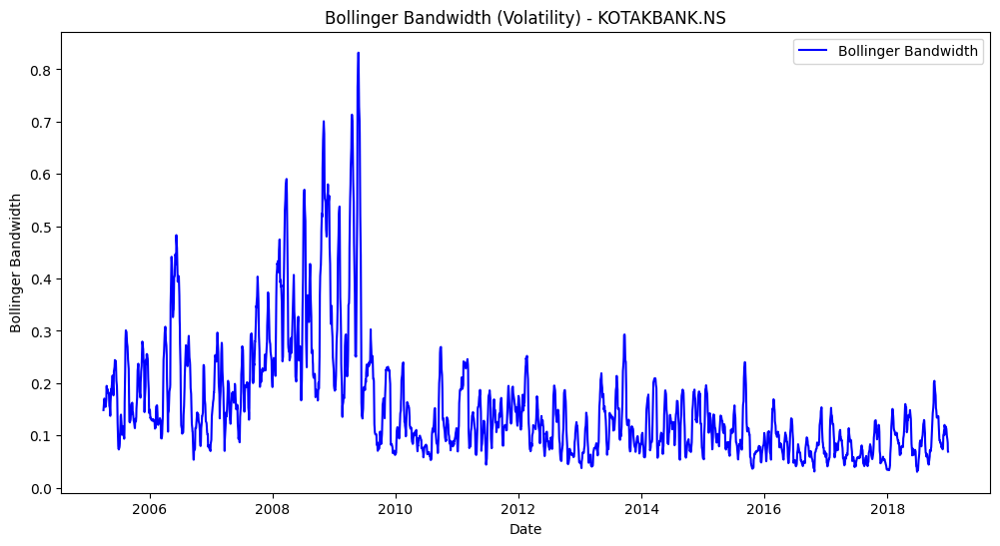

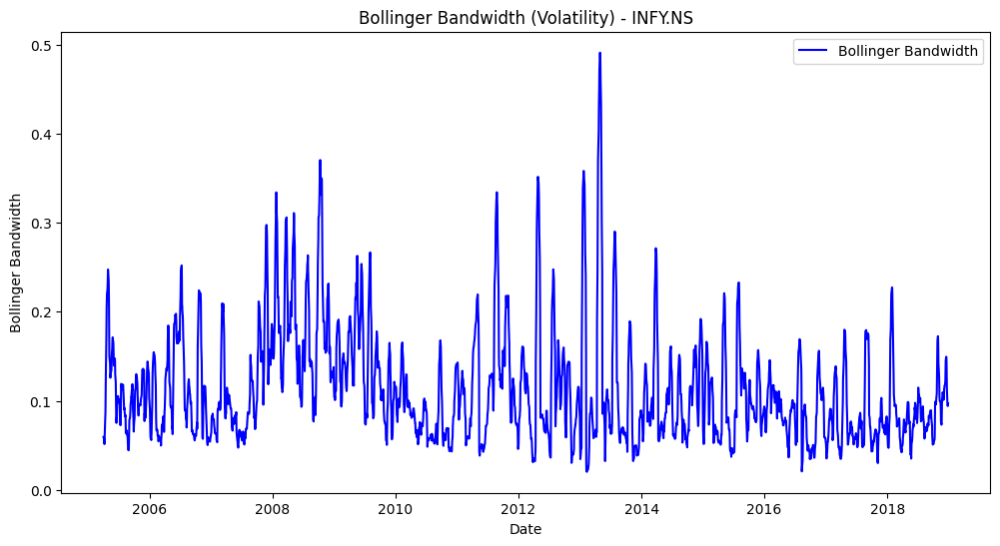

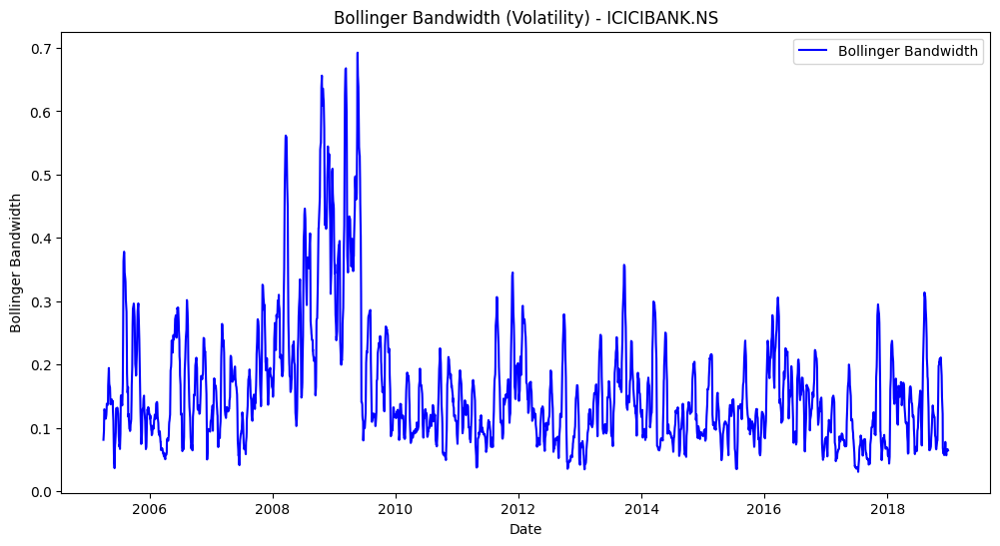

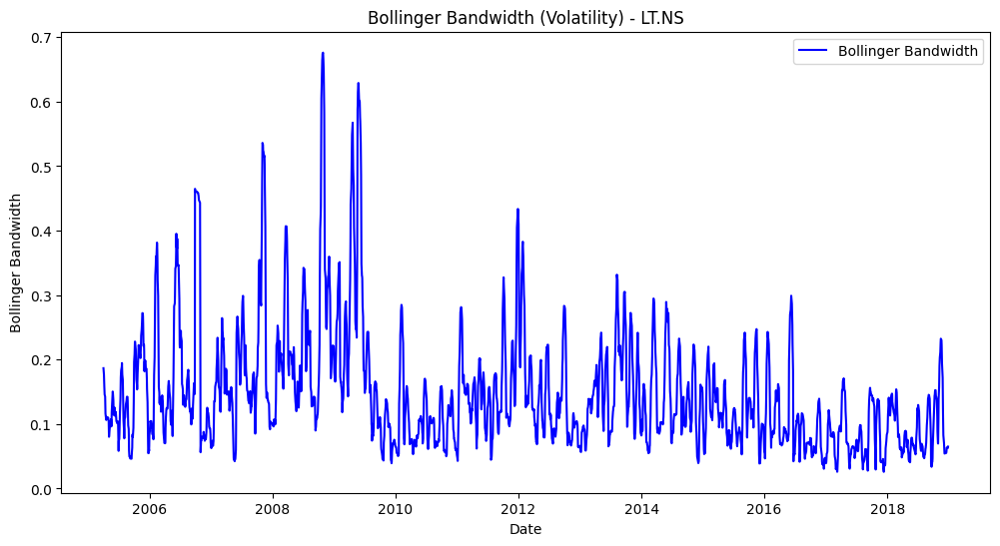

In [ ]:
for ticker in df["Ticker"].unique():
    df_t = df[df["Ticker"] == ticker].sort_index()
    plt.figure(figsize=(12,6))
    plt.plot(df_t.index, df_t['Bollinger_bandwidth'], label="Bollinger Bandwidth", color="blue")
    plt.title(f"Bollinger Bandwidth (Volatility) - {ticker}")
    plt.ylabel("Bollinger Bandwidth")
    plt.xlabel("Date")
    plt.legend()
    plt.show()


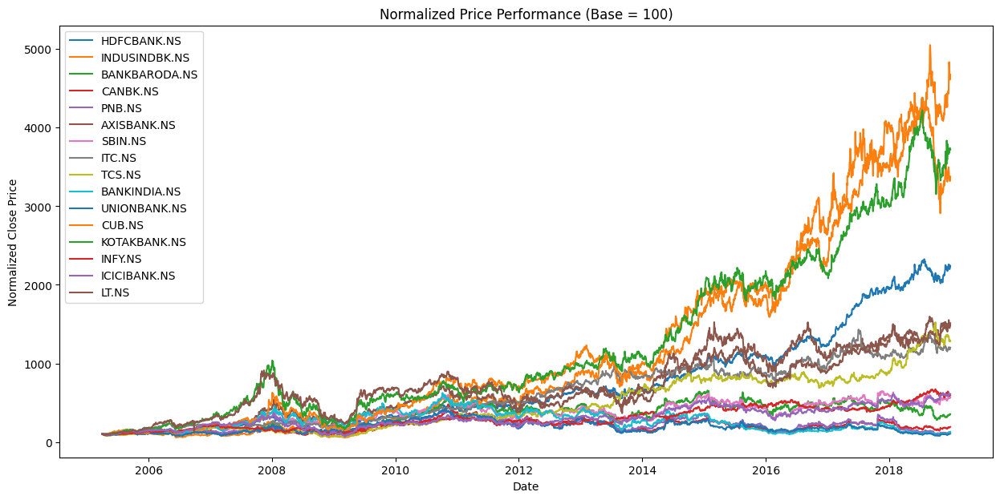

In [ ]:
plt.figure(figsize=(15, 7))

for ticker in df["Ticker"].unique():
    stock = df[df["Ticker"] == ticker]
    normalized = stock["Close_t"] / stock["Close_t"].iloc[0] * 100
    plt.plot(stock.index, normalized, label=ticker)

plt.title("Normalized Price Performance (Base = 100)")
plt.xlabel("Date")
plt.ylabel("Normalized Close Price")
plt.legend()
plt.show()


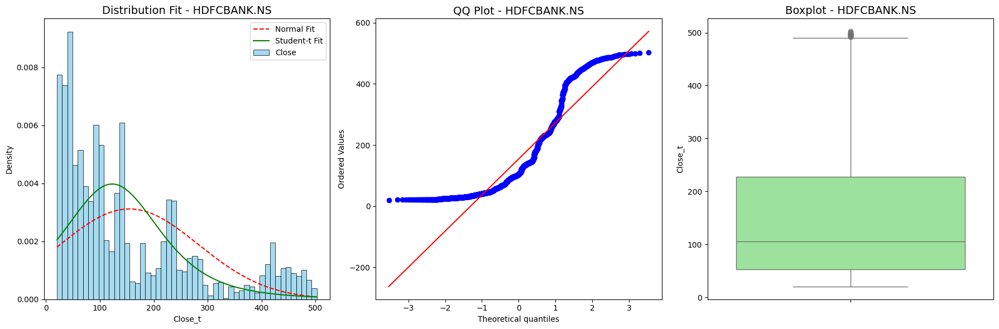

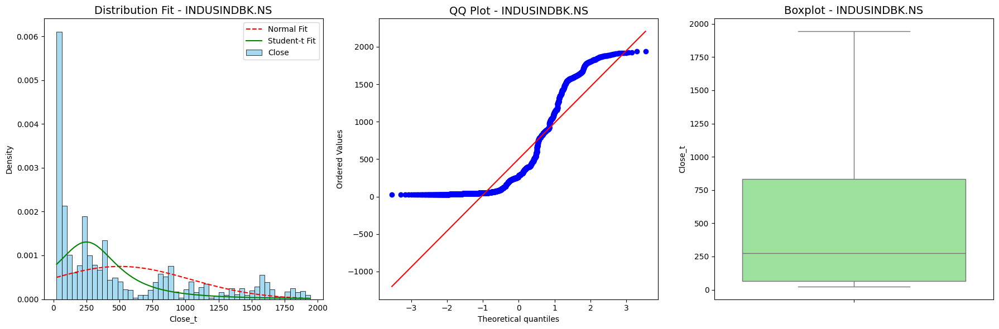

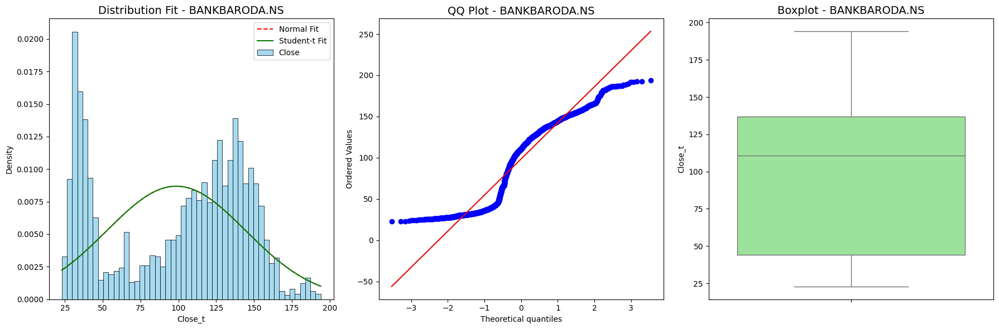

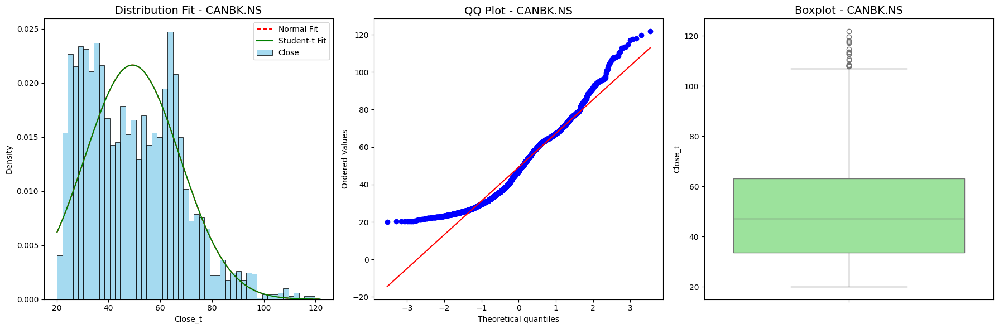

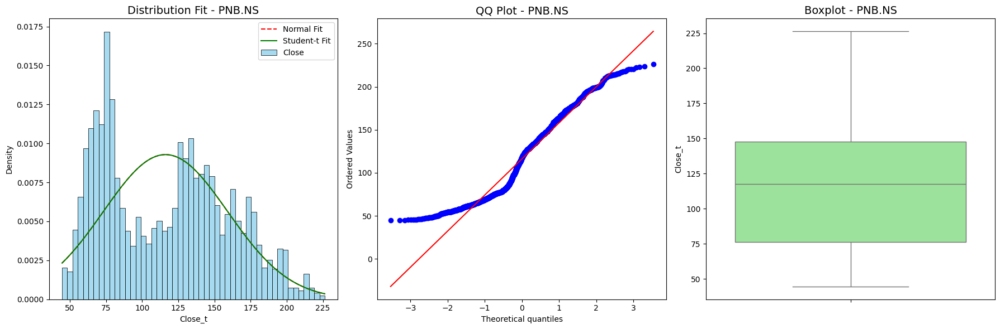

...

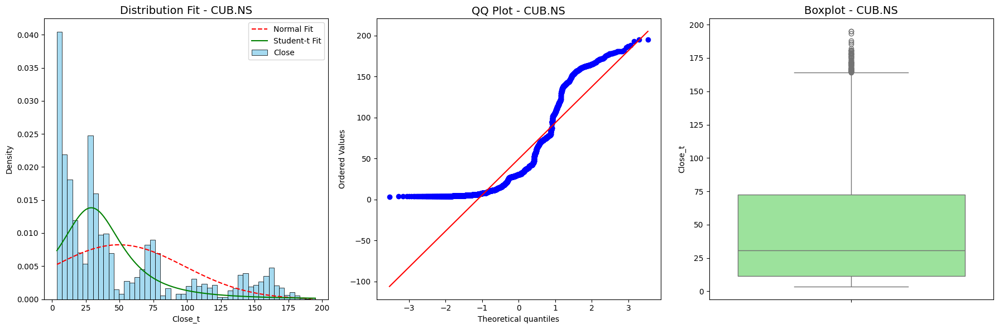

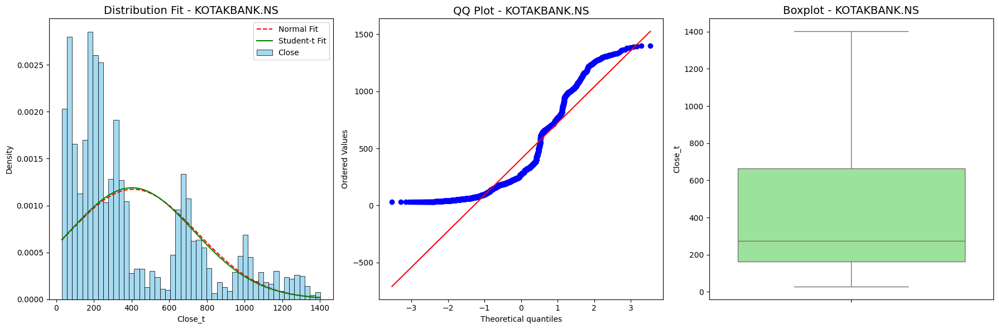

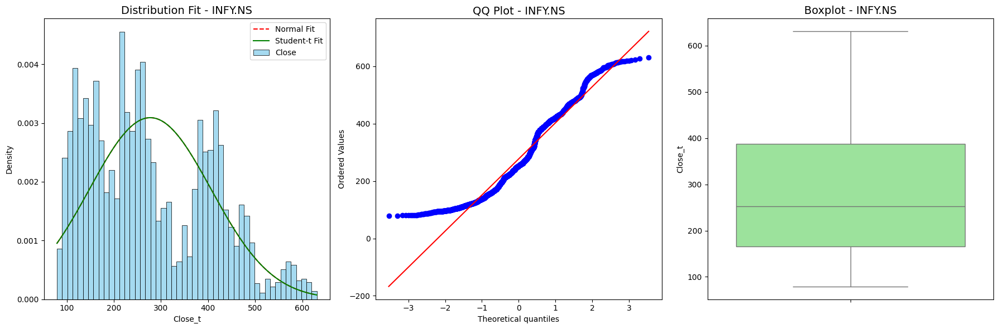

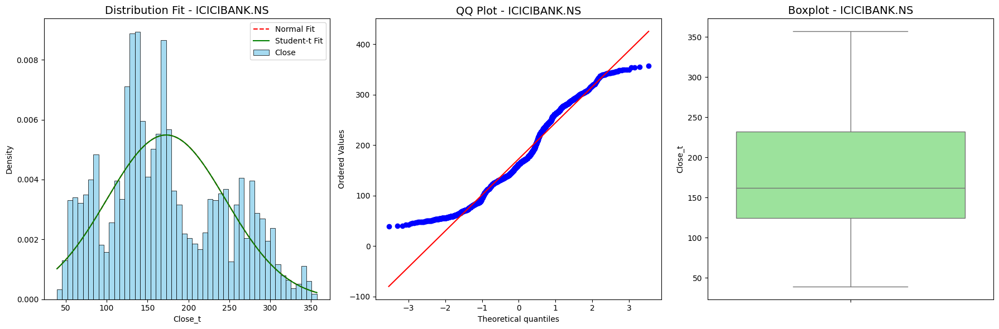

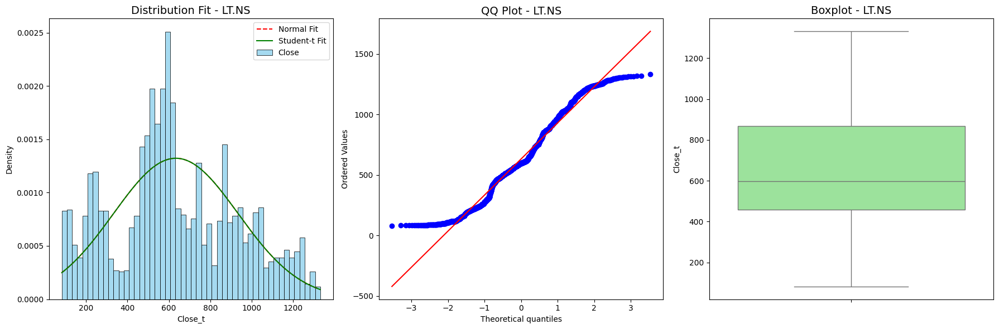

In [ ]:
import scipy.stats as stats

tickers = df['Ticker'].unique()

for ticker in tickers:
    data = df[df['Ticker'] == ticker]['Close_t'].dropna()

    fig, axes = plt.subplots(1, 3, figsize=(18, 6))


    sns.histplot(data, bins=50, stat='density', kde=False,
                 color="skyblue", label="Close", ax=axes[0])

    mu, std = stats.norm.fit(data)
    x = np.linspace(data.min(), data.max(), 200)
    axes[0].plot(x, stats.norm.pdf(x, mu, std), "r--", label="Normal Fit")

    df_t, loc_t, scale_t = stats.t.fit(data)
    axes[0].plot(x, stats.t.pdf(x, df_t, loc_t, scale_t), "g-", label="Student-t Fit")

    axes[0].set_title(f"Distribution Fit - {ticker}", fontsize=14)
    axes[0].legend()

    stats.probplot(data, dist="norm", plot=axes[1])
    axes[1].set_title(f"QQ Plot - {ticker}", fontsize=14)

    sns.boxplot(y=data, ax=axes[2], color="lightgreen")
    axes[2].set_title(f"Boxplot - {ticker}", fontsize=14)
    axes[2].set_ylabel("Close_t")

    plt.tight_layout()
    plt.show()


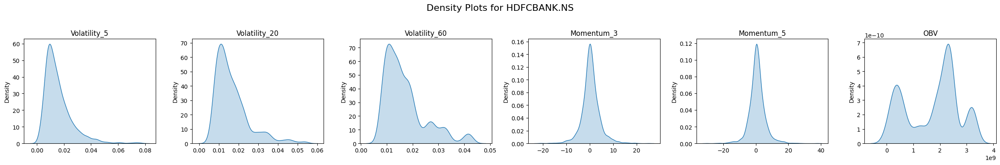

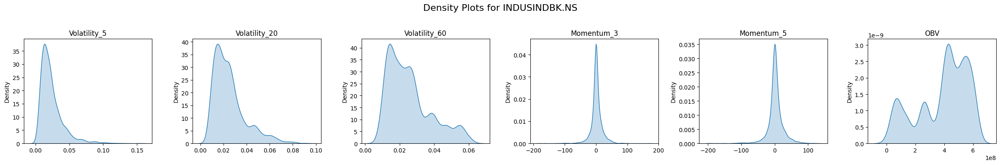

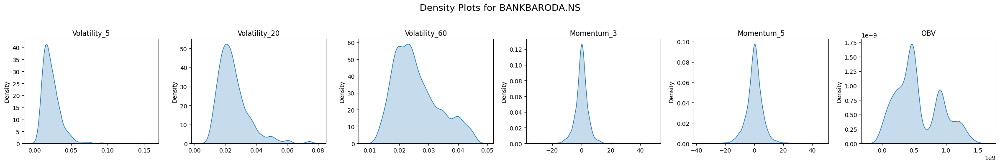

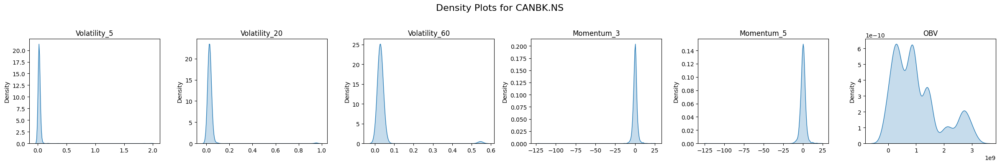

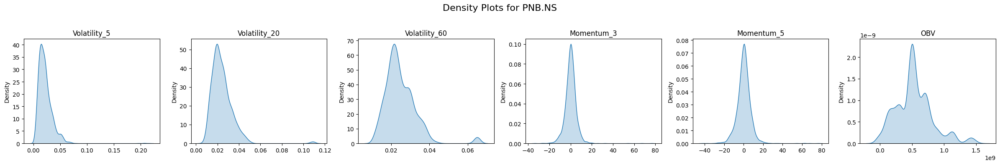

...

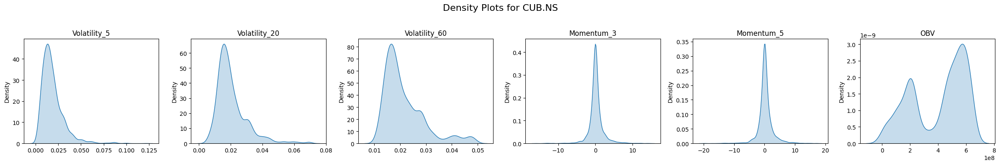

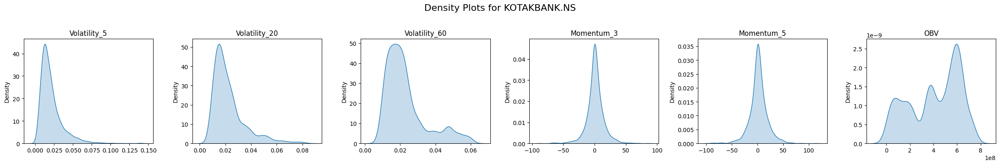

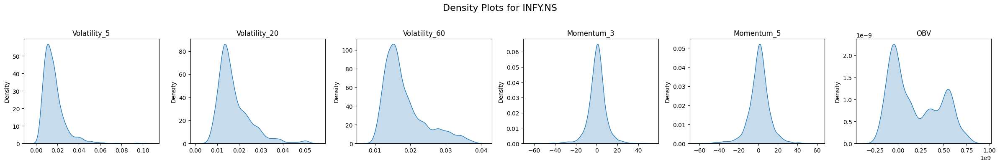

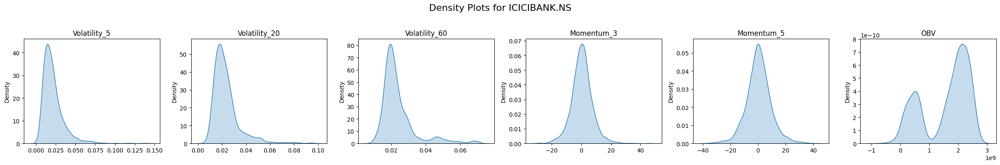

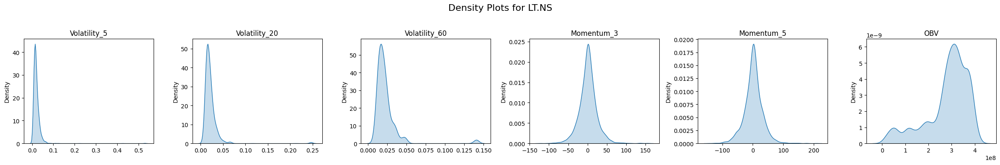

In [ ]:
features = ["Volatility_5", "Volatility_20", "Volatility_60",
            "Momentum_3", "Momentum_5", "OBV"]

tickers = df["Ticker"].unique()

for ticker in tickers:
    data_t = df[df["Ticker"] == ticker]

    fig, axes = plt.subplots(1, 6, figsize=(24, 4), sharey=False)
    fig.suptitle(f"Density Plots for {ticker}", fontsize=16)

    for i, feature in enumerate(features):
        sns.kdeplot(data_t[feature], ax=axes[i], fill=True)
        axes[i].set_title(feature)
        axes[i].set_xlabel("")
        axes[i].set_ylabel("Density")

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


#### *Correlation Check*

In [ ]:
numeric_df = df.select_dtypes(include=[np.number])

corr_matrix = numeric_df.corr().abs()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

threshold = 0.9

high_corr_pairs = [
    (col, row, upper.loc[row, col])
    for col in upper.columns
    for row in upper.index
    if not pd.isnull(upper.loc[row, col]) and upper.loc[row, col] > threshold
]

high_corr_pairs = sorted(high_corr_pairs, key=lambda x: -x[2])

print("Highly correlated feature pairs (|corr| >", threshold, "):")
for f1, f2, corr in high_corr_pairs:
    print(f"{f1} ↔ {f2} = {corr:.3f}")

Highly correlated feature pairs (|corr| > 0.9 ):
Close_t_-1 ↔ Open = 1.000
Close_t ↔ High = 1.000
Close_t ↔ Low = 1.000
High ↔ Open = 1.000
Low ↔ Open = 1.000
Close_t_-1 ↔ High = 1.000
Low ↔ High = 1.000
Close_t_-1 ↔ Low = 1.000
Close_t_-1 ↔ EMA_5 = 1.000
Close_t ↔ Open = 1.000
Close_t_-1 ↔ Close_t = 1.000
EMA_5 ↔ Open = 1.000
Target_Close_t+1 ↔ Close_t = 1.000
EMA_5 ↔ High = 1.000
Target_Close_t+1 ↔ Low = 1.000
Target_Close_t+1 ↔ High = 1.000
EMA_5 ↔ Low = 1.000
Close_t_-5 ↔ EMA_5 = 1.000
SMA_150 ↔ SMA_120 = 1.000
EMA_5 ↔ Close_t = 1.000
Target_Close_t+1 ↔ Open = 1.000
Close_t_-1 ↔ Target_Close_t+1 = 0.999
EMA_20 ↔ EMA_5 = 0.999
Close_t_-5 ↔ EMA_20 = 0.999
Target_Close_t+1 ↔ EMA_5 = 0.999
Close_t_-5 ↔ Close_t_-1 = 0.999
Close_t_-5 ↔ Open = 0.999
Close_t_-1 ↔ EMA_20 = 0.999
EMA_20 ↔ Open = 0.999
Close_t_-5 ↔ High = 0.999
EMA_20 ↔ High = 0.999
Close_t_-5 ↔ Low = 0.999
Close_t_-5 ↔ Close_t = 0.999
EMA_20 ↔ Low = 0.999
EMA_20 ↔ Close_t = 0.999
Close_t_-5 ↔ Target_Close_t+1 = 0.999
Target_

In [ ]:
target_col = "Target_Close_t+1"

numeric_df = df.select_dtypes(include=[np.number])


corr_with_target = numeric_df.corr()[target_col].drop(target_col).sort_values(key=abs, ascending=False)

print("Correlation with target:")
print(corr_with_target)

Correlation with target:
Price
Close_t                   0.999744
Low                       0.999641
High                      0.999639
Open                      0.999513
Close_t_-1                0.999482
EMA_5                     0.999301
Close_t_-5                0.998516
EMA_20                    0.998468
Close_t_-20               0.995093
SMA_60                    0.995038
SMA_120                   0.990461
Close_t_-40               0.990445
SMA_150                   0.988439
Close_t_-60               0.985791
RollingStd_40             0.780499
RollingStd_15             0.750926
year                      0.463973
MACD                      0.244906
High_Volatility_Flag     -0.233664
Bollinger_bandwidth      -0.214990
Rolling_MaxDrawdown_60    0.205644
Volume_SMA_20            -0.204872
Volume_SMA_5             -0.192442
Volatility_60            -0.186802
Rolling_MaxDrawdown_30    0.180426
Volume_t                 -0.169941
Volatility_20            -0.160244
Volatility_5            

#### *Outlier Check*

In [ ]:
outlier_counts = {}
rows_to_drop = []

for ticker in df["Ticker"].unique():

    data = df[df["Ticker"] == ticker]["Close_t"]

    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = (data < lower_bound) | (data > upper_bound)
    outlier_counts[ticker] = outliers.sum()

    rows_to_drop.extend(data[outliers].index)

df = df.drop(index=rows_to_drop)

print(f"Dropped {len(rows_to_drop)} rows due to outliers.")

Dropped 126 rows due to outliers.


# **2. Data prepration For ML Model**


#### *One-Hot-Encoding*

In [ ]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')

ticker_encoded = encoder.fit_transform(df[['Ticker']])

ticker_df = pd.DataFrame(ticker_encoded, columns=encoder.get_feature_names_out(['Ticker']), index=df.index)

df_encoded = pd.concat([df.drop(columns=['Ticker']), ticker_df], axis=1)

print(df_encoded.head())

                 Open       High        Low    Close_t  Volume_t      EMA_5  \
Date                                                                          
2005-04-01  21.382381  21.813163  21.186572  21.599730   3359660  21.132580   
2005-04-01  43.612424  45.797328  43.312533  45.026184    519228  43.754034   
2005-04-01  28.898003  29.745394  28.891330  29.605272   3241815  28.594172   
2005-04-01  24.852672  25.461686  24.508178  25.344803   5327434  24.417748   
2005-04-01  57.062670  57.069823  55.925561  56.769451   7544530  57.146926   

               EMA_20     RSI_10      MACD  Bollinger_bandwidth  ...  \
Date                                                             ...   
2005-04-01  21.894886  46.146567 -0.370275             0.227503  ...   
2005-04-01  45.640653  47.626510 -1.251515             0.187990  ...   
2005-04-01  29.227988  52.590490 -0.161878             0.232658  ...   
2005-04-01  25.594740  48.091573 -0.540920             0.273974  ...   
2005-04-01  61

#### *Data Spliting*

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
def clean_data(X):
    X = X.replace([np.inf, -np.inf], np.nan)

    # Forward/backward fill
    X = X.fillna(method="ffill").fillna(method="bfill")
    return X


X = df_encoded.drop(columns=["Target_Close_t+1"])
X = df_encoded.drop(columns=["Open", "Low", "High","Close_t_-1","EMA_5","EMA_20","SMA_60","SMA_120","SMA_150","Close_t_-1","Close_t_-5","Close_t_-20","Close_t_-40","Close_t_-60","day"])

y = df_encoded["Target_Close_t+1"]
X= clean_data(X)
mask = y.notna()
X, y = X[mask], y[mask]

split_index = int(len(df_encoded) * 0.8)
cutoff_date = df_encoded.index[split_index]
print("Cutoff date:", cutoff_date)
train_mask = df_encoded.index <= cutoff_date
test_mask  = df_encoded.index > cutoff_date

X_train, X_test = X[train_mask], X[test_mask]
y_train, y_test = y[train_mask], y[test_mask]

print("Train shape:", X_train.shape, y_train.shape)
print("Test shape:", X_test.shape, y_test.shape)

Cutoff date: 2015-12-21 00:00:00
Train shape: (41790, 40) (41790,)
Test shape: (10432, 40) (10432,)


In [ ]:
!pip install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 33.9 MB/s eta 0:00:00


In [ ]:
import optuna

In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error,mean_absolute_error, median_absolute_error, r2_score

# **3 .ML Models**

### **1. XGRegressor**




#### *Optuna for XGBRegressor*

In [ ]:
import xgboost as xgb

In [ ]:
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 100, 1500),
        "max_depth": trial.suggest_int("max_depth", 2, 15),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "gamma": trial.suggest_float("gamma", 0.0, 5.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 10.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 10.0, log=True),
        "objective": "reg:squarederror",
        "random_state": 42,
        "device": "cuda",
        "tree_method": "hist"
    }

    tscv = TimeSeriesSplit(n_splits=10)
    val_r2_scores = []

    for tr_idx, val_idx in tscv.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]

        model = xgb.XGBRegressor(**params)

        model.fit(
            X_tr, y_tr,
            eval_set=[(X_val, y_val)],
            eval_metric = 'rmse',
            early_stopping_rounds=50,
            verbose=False
        )

        preds = model.predict(X_val)
        r2 = r2_score(y_val, preds)
        val_r2_scores.append(r2)

    return np.mean(val_r2_scores)


In [ ]:
study = optuna.create_study(direction="maximize")

[I 2025-09-08 20:44:43,176] A new study created in memory with name: no-name-0fe09be7-d2fe-4745-b772-5a672094d404


In [ ]:
study.optimize(objective, n_trials=100, n_jobs=-1)

[20:44:46] WARNING: /workspace/src/common/error_msg.cc:58: Falling back to prediction using DMatrix due to mismatched devices. This might lead to higher memory usage and slower performance. XGBoost is running on: cuda:0, while the input data is on: cpu.
Potential solutions:
- Use a data structure that matches the device ordinal in the booster.
- Set the device for booster before call to inplace_predict.

This warning will only be shown once.

[I 2025-09-08 20:44:58,875] Trial 3 finished with value: 0.9638929518713362 and parameters: {'n_estimators': 994, 'max_depth': 2, 'learning_rate': 0.08013355375913046, 'subsample': 0.802869710984398, 'colsample_bytree': 0.8354998169574511, 'min_child_weight': 1, 'gamma': 2.4563782312869984, 'reg_alpha': 0.21258419094597564, 'reg_lambda': 6.71222990483477e-07}. Best is trial 3 with value: 0.9638929518713362.
[I 2025-09-08 20:45:11,058] Trial 4 finished with value: 0.962501572978689 and parameters: {'n_estimators': 477, 'max_depth': 4, 'learning_rat

In [ ]:
print("Best Trial:")
print("  RMSE:", study.best_trial.value)
print("  Params:", study.best_trial.params)

Best Trial:
  RMSE: 0.964363434241972
  Params: {'n_estimators': 940, 'max_depth': 3, 'learning_rate': 0.12387013858998969, 'subsample': 0.8356043208908182, 'colsample_bytree': 0.8340684338884847, 'min_child_weight': 3, 'gamma': 2.7407597821799787, 'reg_alpha': 0.2778655247168604, 'reg_lambda': 4.942648505023861e-08}


#### *Training Model*

In [ ]:
best_params = {'n_estimators': 940, 'max_depth': 3,
               'learning_rate': 0.12387013858998969, 'subsample': 0.8356043208908182,
               'colsample_bytree': 0.8340684338884847,'min_child_weight': 3,
               'gamma': 2.7407597821799787, 'reg_alpha': 0.2778655247168604,
               'reg_lambda': 4.942648505023861e-08}

tscv = TimeSeriesSplit(n_splits=10)

r2_scores = []
adj_r2_scores = []

for train_idx, val_idx in tscv.split(X_train):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    model = xgb.XGBRegressor(**best_params, random_state=42)
    model.fit(X_tr, y_tr, eval_set=[(X_val, y_val)], verbose=0)

    y_pred = model.predict(X_val)

    # R² Score
    r2 = r2_score(y_val, y_pred)

    # Adjusted R²
    n, p = len(y_val), X_val.shape[1]
    if n > p + 1:
        adj_r2 = 1 - (1-r2) * (n-1)/(n-p-1)
    else:
        adj_r2 = np.nan

    r2_scores.append(r2)
    adj_r2_scores.append(adj_r2)

print("R² per fold:", r2_scores)
print("Mean R²:", np.nanmean(r2_scores))
print("Adjusted R² per fold:", adj_r2_scores)
print("Mean Adjusted R²:", np.nanmean(adj_r2_scores))


R² per fold: [0.9835208808502488, 0.7005941930791957, 0.9923918432787648, 0.9955446289442739, 0.992888241567832, 0.9991554938301401, 0.9993050342856227, 0.9871720107150539, 0.9819625833502906, 0.9975721622736926]
Mean R²: 0.9630107072175115
Adjusted R² per fold: [0.9833499538165147, 0.6974886541244321, 0.9923129288872414, 0.9954984163189619, 0.9928144759883494, 0.9991467343246548, 0.9992978258646491, 0.9870389544432153, 0.9817754931244027, 0.9975469799142974]
Mean Adjusted R²: 0.9626270416806719


In [ ]:
XGB_model = xgb.XGBRegressor(**best_params,)
XGB_model.fit(X_train, y_train)
y_pred_xgb = XGB_model.predict(X_test)

In [ ]:
xgb_rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
xgb_mae  = mean_absolute_error(y_test, y_pred_xgb)
xgb_r2   = r2_score(y_test, y_pred_xgb)
xgb_mape = np.mean(np.abs((y_test - y_pred_xgb) / y_test)) * 100
xgb_medae = median_absolute_error(y_test, y_pred_xgb)
n = len(y_test)     # number of samples
p = X_test.shape[1] # number of features
xgb_adj_r2 = 1 - (1-xgb_r2) * (n-1)/(n-p-1)

print(f"\nFinal Test RMSE: {xgb_rmse:.4f}")
print(f"Final Test MAE : {xgb_mae:.4f}")
print(f"MAPE  : {xgb_mape:.2f}%")
print(f"Median Absolute Error : {xgb_medae:.4f}")
print(f"Final Test R^2 : {xgb_r2:.4f}")
print(f"Final Test Adjusted_R^2: {xgb_adj_r2}")


Final Test RMSE: 106.3398
Final Test MAE : 27.9037
MAPE  : 2.33%
Median Absolute Error : 1.2053
Final Test R^2 : 0.9368
Final Test Adjusted_R^2: 0.9366086268555827


#### *Saving model*

In [ ]:
import joblib

In [ ]:
joblib.dump(XGB_model, "xgb_model.pkl")

['xgb_model.pkl']

### *2. LGBMRegressor*

In [ ]:
!pip install lightgbm --install-option=--gpu


Usage:   
  pip3 install [options] <requirement specifier> [package-index-options] ...
  pip3 install [options] -r <requirements file> [package-index-options] ...
  pip3 install [options] [-e] <vcs project url> ...
  pip3 install [options] [-e] <local project path> ...
  pip3 install [options] <archive url/path> ...

no such option: --install-option


In [ ]:
import lightgbm as lgb
from lightgbm import LGBMRegressor,log_evaluation, early_stopping

#### *Optuna for LGBMRegressor*

In [ ]:
def objective(trial):
    boosting_type = trial.suggest_categorical("boosting_type", ["gbdt", "dart"])

    params = {
        "objective": "regression",
        "metric": "rmse",
        "boosting_type": boosting_type,
        "verbosity": -1,
        "lambda_l1": trial.suggest_float("lambda_l1", 1e-8, 10.0, log=True),
        "lambda_l2": trial.suggest_float("lambda_l2", 1e-8, 10.0, log=True),
        "num_leaves": trial.suggest_int("num_leaves", 2, 256),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.4, 1.0),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.4, 1.0),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 7),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 100),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "n_estimators": trial.suggest_int("n_estimators", 100, 1000),
        "device": "gpu",
        "gpu_platform_id": 0,
        "gpu_device_id": 0,
        "n_jobs": -1,
        "random_state": 42
    }

    tscv = TimeSeriesSplit(n_splits=10)
    val_r2_scores = []

    for tr_idx, val_idx in tscv.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]

        model = lgb.LGBMRegressor(**params)

        model.fit(
            X_tr, y_tr,
            eval_set=[(X_val, y_val)],
            eval_metric="rmse",
            callbacks=[lgb.early_stopping(stopping_rounds=50, verbose=False)]
        )

        preds = model.predict(X_val)
        r2 = r2_score(y_val, preds)
        val_r2_scores.append(r2)

    return np.mean(val_r2_scores)


In [ ]:
study1 = optuna.create_study(direction="maximize")
study1.optimize(objective, n_trials=50)

[I 2025-09-08 18:51:26,762] A new study created in memory with name: no-name-86b65f7b-9a86-4ad2-94f5-9e5b1138a32b
[I 2025-09-08 18:52:17,739] Trial 0 finished with value: -0.8228348606001564 and parameters: {'boosting_type': 'dart', 'lambda_l1': 5.541375191698921e-06, 'lambda_l2': 2.7441724392397306, 'num_leaves': 100, 'feature_fraction': 0.6906658604540086, 'bagging_fraction': 0.9855382456468292, 'bagging_freq': 4, 'min_child_samples': 47, 'learning_rate': 0.0015069613924097887, 'n_estimators': 283}. Best is trial 0 with value: -0.8228348606001564.
[I 2025-09-08 18:52:59,148] Trial 1 finished with value: 0.9516321205080892 and parameters: {'boosting_type': 'gbdt', 'lambda_l1': 4.17871121380186e-05, 'lambda_l2': 0.004874405378892276, 'num_leaves': 50, 'feature_fraction': 0.5349768471727946, 'bagging_fraction': 0.8072756811858275, 'bagging_freq': 1, 'min_child_samples': 42, 'learning_rate': 0.01553448694558205, 'n_estimators': 667}. Best is trial 1 with value: 0.9516321205080892.
[I 202

In [ ]:
print("Best Trial:")
print("  RMSE:", study1.best_trial.value)
print("  Params:", study1.best_trial.params)

Best Trial:
  RMSE: 0.9619939571020446
  Params: {'boosting_type': 'gbdt', 'lambda_l1': 1.0161975475603836e-08, 'lambda_l2': 1.441871275469215e-05, 'num_leaves': 135, 'feature_fraction': 0.9834909327572777, 'bagging_fraction': 0.8683298584669387, 'bagging_freq': 2, 'min_child_samples': 20, 'learning_rate': 0.08348595123509102, 'n_estimators': 577}


#### *Training Model*

In [ ]:
best_params1 = study1.best_trial.params

In [ ]:
best_params1 = {'boosting_type': 'gbdt', 'lambda_l1': 1.0161975475603836e-08,
                'lambda_l2': 1.441871275469215e-05, 'num_leaves': 135,
                'feature_fraction': 0.9834909327572777, 'bagging_fraction': 0.8683298584669387,
                'bagging_freq': 2, 'min_child_samples': 20,
                'learning_rate': 0.08348595123509102, 'n_estimators': 577}

tscv = TimeSeriesSplit(n_splits=10)
r2_scores, adj_r2_scores = [], []

for train_idx, val_idx in tscv.split(X_train):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    model = LGBMRegressor(**best_params1)
    model.fit(
        X_tr, y_tr,
        eval_set=[(X_val, y_val)],
        callbacks=[early_stopping(50), log_evaluation(-1)],
    )

    y_pred = model.predict(X_val)

    # R²
    r2 = r2_score(y_val, y_pred)

    # Adjusted R²
    n, p = len(y_val), X_val.shape[1]
    if n > p + 1:
        adj_r2 = 1 - (1-r2) * (n-1)/(n-p-1)
    else:
        adj_r2 = np.nan

    r2_scores.append(r2)
    adj_r2_scores.append(adj_r2)

[LightGBM] [Warning] feature_fraction is set=0.9834909327572777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9834909327572777
[LightGBM] [Warning] lambda_l2 is set=1.441871275469215e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.441871275469215e-05
[LightGBM] [Warning] lambda_l1 is set=1.0161975475603836e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0161975475603836e-08
[LightGBM] [Warning] bagging_fraction is set=0.8683298584669387, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8683298584669387
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9834909327572777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9834909327572777
[LightGBM] [Warning] lambda_l2 is set=1.441871275469215e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.441871275469215e-05
[LightGBM] [Warn

In [ ]:
print("R² per fold:", r2_scores)
print("Mean R²:", np.mean(r2_scores))
print("Adjusted R² per fold:", adj_r2_scores)
print("Mean Adjusted R²:", np.mean(adj_r2_scores))

R² per fold: [0.9763987512410212, 0.6996609701493681, 0.9948863933941577, 0.996392502099712, 0.9948811762791294, 0.9991306894933575, 0.9992304219000506, 0.9877403054936231, 0.9770379918066855, 0.9963533326024169]
Mean R²: 0.9621712534459522
Adjusted R² per fold: [0.9761539510544254, 0.6965457514886835, 0.9948333533256397, 0.9963550839034058, 0.9948280820969183, 0.9991216727088471, 0.9992224395740139, 0.9876131437686899, 0.9767998220408506, 0.9963155081267504]
Mean Adjusted R²: 0.9617788808088225


In [ ]:
LGB_model = lgb.LGBMRegressor(**best_params1)
LGB_model.fit(X_train, y_train,callbacks=[log_evaluation(-1)])
y_pred_lgb = LGB_model.predict(X_test)

[LightGBM] [Warning] feature_fraction is set=0.9834909327572777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9834909327572777
[LightGBM] [Warning] lambda_l2 is set=1.441871275469215e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.441871275469215e-05
[LightGBM] [Warning] lambda_l1 is set=1.0161975475603836e-08, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0161975475603836e-08
[LightGBM] [Warning] bagging_fraction is set=0.8683298584669387, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8683298584669387
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9834909327572777, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9834909327572777
[LightGBM] [Warning] lambda_l2 is set=1.441871275469215e-05, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.441871275469215e-05
[LightGBM] [Warn

In [ ]:
lgb_rmse = np.sqrt(mean_squared_error(y_test, y_pred_lgb))
lgb_mae  = mean_absolute_error(y_test, y_pred_lgb)
lgb_r2   = r2_score(y_test, y_pred_lgb)
lgb_mape = np.mean(np.abs((y_test - y_pred_lgb) / y_test)) * 100
lgb_medae = median_absolute_error(y_test, y_pred_lgb)
n = len(y_test)     # number of samples
p = X_test.shape[1] # number of features
lgb_adj_r2 = 1 - (1-lgb_r2) * (n-1)/(n-p-1)

print(f"\nFinal Test RMSE: {lgb_rmse:.4f}")
print(f"Final Test MAE : {lgb_mae:.4f}")
print(f"MAPE  : {lgb_mape:.2f}%")
print(f"Median Absolute Error : {lgb_medae:.4f}")
print(f"Final Test R^2 : {lgb_r2:.4f}")
print(f"Final Test Adjusted_R^2: {lgb_adj_r2}")


Final Test RMSE: 105.5314
Final Test MAE : 27.3065
MAPE  : 2.09%
Median Absolute Error : 0.6290
Final Test R^2 : 0.9378
Final Test Adjusted_R^2: 0.9375687739608753


#### *Saving Model*

In [ ]:
joblib.dump(LGB_model, "lgb_model.pkl")

['lgb_model.pkl']

### *3. CatBoostRegressor*

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 9.4 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostRegressor

#### *Optuna for CatBoostRegressor*

In [ ]:
def objective(trial):
    params = {
        "iterations": trial.suggest_int("iterations", 200, 1000),
        "depth": trial.suggest_int("depth", 4, 10),
        "learning_rate": trial.suggest_float("learning_rate", 1e-3, 0.3, log=True),
        "l2_leaf_reg": trial.suggest_float("l2_leaf_reg", 1.0, 10.0),
        "random_strength": trial.suggest_float("random_strength", 1e-2, 10.0, log=True),
        "bagging_temperature": trial.suggest_float("bagging_temperature", 0.0, 10.0),
        "border_count": trial.suggest_int("border_count", 32, 255),
        "loss_function": "RMSE",
        "verbose": False,
        "random_seed": 42,
        "task_type": "GPU",   # GPU training
        "devices": "0"
    }

    tscv = TimeSeriesSplit(n_splits=10)
    val_r2_scores = []

    for tr_idx, val_idx in tscv.split(X_train):
        X_tr, X_val = X_train.iloc[tr_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[tr_idx], y_train.iloc[val_idx]

        model = CatBoostRegressor(**params)

        model.fit(
            X_tr, y_tr,
            eval_set=[(X_val, y_val)],
            early_stopping_rounds=50,
            use_best_model=True
        )

        preds = model.predict(X_val)
        r2 = r2_score(y_val, preds)
        val_r2_scores.append(r2)

    return np.mean(val_r2_scores)


In [ ]:
study2 = optuna.create_study(direction="maximize")
study2.optimize(objective, n_trials=100)

[I 2025-09-08 21:01:55,998] A new study created in memory with name: no-name-db19f605-e678-4b99-9a0a-f0f7974f9152
[I 2025-09-08 21:02:43,776] Trial 0 finished with value: 0.9340409391175781 and parameters: {'iterations': 678, 'depth': 8, 'learning_rate': 0.09941124599878959, 'l2_leaf_reg': 5.2391525910582715, 'random_strength': 6.7014848673791345, 'bagging_temperature': 2.662443893900319, 'border_count': 82}. Best is trial 0 with value: 0.9340409391175781.
[I 2025-09-08 21:03:38,523] Trial 1 finished with value: 0.9485628379976596 and parameters: {'iterations': 860, 'depth': 4, 'learning_rate': 0.01325179806097267, 'l2_leaf_reg': 3.43361669770006, 'random_strength': 0.15163187608959663, 'bagging_temperature': 9.726701246576543, 'border_count': 135}. Best is trial 1 with value: 0.9485628379976596.
[I 2025-09-08 21:03:58,305] Trial 2 finished with value: 0.960596469878644 and parameters: {'iterations': 789, 'depth': 4, 'learning_rate': 0.11860259892273954, 'l2_leaf_reg': 1.03689582568329

In [ ]:
print("Best trial:", study2.best_trial.params)
print("Best RMSE:", study2.best_trial.value)

Best trial: {'iterations': 882, 'depth': 4, 'learning_rate': 0.1235889919169347, 'l2_leaf_reg': 6.205008346206254, 'random_strength': 0.034482996880664696, 'bagging_temperature': 0.06793034220722483, 'border_count': 226}
Best RMSE: 0.9638201603635205


#### *Training Model*

In [ ]:
best_params2 = study2.best_trial.params

In [ ]:
best_params2 = {'iterations': 882, 'depth': 4,
                'learning_rate': 0.1235889919169347, 'l2_leaf_reg': 6.205008346206254,
                'random_strength': 0.034482996880664696, 'bagging_temperature': 0.06793034220722483,
                'border_count': 226}

tscv = TimeSeriesSplit(n_splits=10)

results = []

for fold, (train_idx, val_idx) in enumerate(tscv.split(X_train), 1):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    model = CatBoostRegressor(**best_params2)
    model.fit(X_tr, y_tr, eval_set=(X_val, y_val),verbose = False, use_best_model=True)

    y_pred = model.predict(X_val)

    # R²
    r2 = r2_score(y_val, y_pred)

    # Adjusted R²
    n, p = len(y_val), X_val.shape[1]
    adj_r2 = 1 - (1-r2) * (n-1)/(n-p-1)

    best_iter = model.get_best_iteration()

    results.append((fold, r2, adj_r2, best_iter))

cv_results = pd.DataFrame(results, columns=["Fold", "R²", "Adj_R²", "Best_Iter"])
print("CatBoost CV Results:\n", cv_results)
print("Mean R²:", cv_results["R²"].mean())
print("Mean Adj R²:", cv_results["Adj_R²"].mean())
print("Mean Best Iteration:", cv_results["Best_Iter"].mean())


CatBoost CV Results:
    Fold        R²    Adj_R²  Best_Iter
0     1  0.980772  0.980573        125
1     2  0.701123  0.698023        742
2     3  0.997231  0.997202         40
3     4  0.994750  0.994695         21
4     5  0.994663  0.994607         89
5     6  0.999047  0.999037        861
6     7  0.999305  0.999298        224
7     8  0.988789  0.988673        134
8     9  0.979289  0.979074        124
9    10  0.997455  0.997429         59
Mean R²: 0.9632424763171112
Mean Adj R²: 0.9628612147682727
Mean Best Iteration: 241.9


In [ ]:
Cat_model = CatBoostRegressor(**best_params2)
Cat_model.fit(X_train, y_train,verbose = False)
y_pred_CatB = Cat_model.predict(X_test)

In [ ]:
CatB_rmse = np.sqrt(mean_squared_error(y_test, y_pred_CatB))
CatB_mae  = mean_absolute_error(y_test, y_pred_CatB)
CatB_r2   = r2_score(y_test, y_pred_CatB)
CatB_mape = np.mean(np.abs((y_test - y_pred_CatB) / y_test)) * 100
CatB_medae = median_absolute_error(y_test, y_pred_CatB)
n = len(y_test)     # number of samples
p = X_test.shape[1] # number of features
CatB_adj_r2 = 1 - (1-CatB_r2) * (n-1)/(n-p-1)

print(f"\nFinal Test RMSE: {CatB_rmse:.4f}")
print(f"Final Test MAE : {CatB_mae:.4f}")
print(f"MAPE  : {CatB_mape:.2f}%")
print(f"Median Absolute Error : {CatB_medae:.4f}")
print(f"Final Test R^2 : {CatB_r2:.4f}")
print(f"Final Test Adjusted_R^2: {CatB_adj_r2}")


Final Test RMSE: 106.2067
Final Test MAE : 27.9871
MAPE  : 2.37%
Median Absolute Error : 1.2903
Final Test R^2 : 0.9370
Final Test Adjusted_R^2: 0.936767275103449


#### *Saving Model*

In [ ]:
joblib.dump(Cat_model, "catboost_model.pkl")

['catboost_model.pkl']

# *4. Data prepration for DL models*

In [ ]:
!pip install optuna optuna-integration[tfkeras]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 400.9/400.9 kB 28.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 8.7 MB/s eta 0:00:00


In [ ]:
from optuna_integration.tfkeras import TFKerasPruningCallback

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential,Model,load_model
from tensorflow.keras.layers import Input, LSTM, GRU,Dense, Dropout, Embedding, Concatenate,Lambda,RepeatVector,Flatten
from tensorflow.keras.initializers import GlorotUniform, Orthogonal, Zeros
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping

In [ ]:
def create_sequences_with_ticker(X, y, ticker, lookback=10):

    Xs, ys, tickers_out = [], [], []
    for i in range(len(X) - lookback):
        Xs.append(X[i:i+lookback])
        ys.append(y[i+lookback])
        tickers_out.append(ticker[i+lookback])
    return np.array(Xs), np.array(ys), np.array(tickers_out)


#### *LabelEncoding*

In [ ]:
from sklearn.preprocessing import LabelEncoder

ticker_encoder = LabelEncoder()

df['Ticker_encoded'] = ticker_encoder.fit_transform(df['Ticker'])

print(df[['Ticker', 'Ticker_encoded']].head())

num_tickers = df['Ticker_encoded'].nunique()
print("Number of unique tickers:", num_tickers)

                   Ticker  Ticker_encoded
Date                                     
2005-04-01    HDFCBANK.NS               5
2005-04-01  INDUSINDBK.NS               7
2005-04-01  BANKBARODA.NS               1
2005-04-01       CANBK.NS               3
2005-04-01         PNB.NS              12
Number of unique tickers: 16


#### *Scaling: MinMaxScaling*

In [ ]:
from sklearn.preprocessing import MinMaxScaler ,RobustScaler, QuantileTransformer
def clean_data(X):
    # Replace inf/-inf with NaN
    X = X.replace([np.inf, -np.inf], np.nan)

    # Forward/backward fill
    X = X.fillna(method="ffill").fillna(method="bfill")
    return X

df = clean_data(df)
df1 = df.copy()

scalers_x, scalers_y = {}, {}
scaled_dfs = []
volume_features = ["Volume_t", "Volume_SMA_5", "Volume_SMA_20"]
other_features = [col for col in df1.columns
                  if col not in volume_features + ["Target_Close_t+1", "Ticker", "Ticker_encoded"]]


for ticker, group in df1.groupby("Ticker_encoded"):

    X_t = group.drop(columns=["Target_Close_t+1", "Ticker"])
    y_t = group["Target_Close_t+1"]

    mask = y_t.notna()
    X_t, y_t = X_t[mask], y_t[mask]
    X_scaled_df = pd.DataFrame(index=X_t.index)

    for col in volume_features:
        tmp = np.log1p(X_t[col].values.reshape(-1,1))
        scaler_vol = MinMaxScaler()
        X_scaled_df[col] = scaler_vol.fit_transform(tmp)

    scaler_rest = MinMaxScaler()
    X_scaled_df[other_features] = scaler_rest.fit_transform(X_t[other_features])

    scaler_y = MinMaxScaler()
    y_scaled = scaler_y.fit_transform(y_t.values.reshape(-1, 1))

    scalers_x[ticker] = {
        "volume": {col: MinMaxScaler().fit(np.log1p(X_t[col].values.reshape(-1, 1))) for col in volume_features},
        "others": scaler_rest
    }
    scalers_y[ticker] = scaler_y

    X_scaled_df["Target_Close_t+1"] = y_scaled
    X_scaled_df["Ticker_encoded"] = ticker
    scaled_dfs.append(X_scaled_df)

final_scaled_df = pd.concat(scaled_dfs)

final_scaled_df = final_scaled_df.sort_index()

print(" Scaled per ticker and globally sorted by Date:", final_scaled_df.shape)
print(final_scaled_df.head())


 Scaled per ticker and globally sorted by Date: (52222, 38)
            Volume_t  Volume_SMA_5  Volume_SMA_20      Open      High  \
Date                                                                    
2005-04-01  0.071193      0.265491       0.246638  0.004376  0.004611   
2005-04-01  0.672925      0.698762       0.647198  0.066332  0.068561   
2005-04-01  0.610445      0.540036       0.617196  0.023126  0.022608   
2005-04-01  0.641959      0.731919       0.867436  0.018266  0.020414   
2005-04-01  0.534303      0.623644       0.620473  0.066991  0.063673   

                 Low   Close_t     EMA_5    EMA_20    RSI_10  ...   SMA_150  \
Date                                                          ...             
2005-04-01  0.005689  0.005306  0.002975  0.002523  0.491162  ...  0.102030   
2005-04-01  0.053639  0.072844  0.055611  0.057405  0.491719  ...  0.142764   
2005-04-01  0.027075  0.025175  0.020956  0.020170  0.637699  ...  0.000000   
2005-04-01  0.020486  0.022736  0

In [ ]:
lookback = 10
X = final_scaled_df.drop(columns=["Target_Close_t+1"])
y = final_scaled_df["Target_Close_t+1"].values
ticker_array = final_scaled_df["Ticker_encoded"].values

X_seq, y_seq, ticker_seq = create_sequences_with_ticker(X, y, ticker_array, lookback)

print("📦 Sequence shapes:")
print("X_seq:", X_seq.shape)   # (samples, lookback, features)
print("y_seq:", y_seq.shape)   # (samples,)
print("ticker_seq:", ticker_seq.shape)  # (samples,)

📦 Sequence shapes:
X_seq: (52212, 10, 37)
y_seq: (52212,)
ticker_seq: (52212,)


In [ ]:
lookback = 10
dates = df.index[lookback:]

split_index = int(len(dates) * 0.8)

cutoff_date = dates[split_index]
print("80% cutoff date:", cutoff_date)

train_mask = dates <= cutoff_date
test_mask  = dates > cutoff_date

X_train_seq = X_seq[train_mask]
y_train_seq = y_seq[train_mask]
ticker_train_seq = ticker_seq[train_mask]

X_test_seq = X_seq[test_mask]
y_test_seq = y_seq[test_mask]
ticker_test_seq = ticker_seq[test_mask]
ticker_test_seq  = ticker_test_seq.reshape(-1, 1)


val_size = int(0.2 * len(X_train_seq))

X_val_seq = X_train_seq[-val_size:]
y_val_seq = y_train_seq[-val_size:]
ticker_val_seq = ticker_train_seq[-val_size:]
ticker_val_seq   = ticker_val_seq.reshape(-1, 1)

X_train_seq = X_train_seq[:-val_size]
y_train_seq = y_train_seq[:-val_size]
ticker_train_seq = ticker_train_seq[:-val_size]
ticker_train_seq = ticker_train_seq.reshape(-1, 1)

print("Train shapes:", X_train_seq.shape, y_train_seq.shape, ticker_train_seq.shape)
print("Val shapes:", X_val_seq.shape, y_val_seq.shape, ticker_val_seq.shape)
print("Test shapes:", X_test_seq.shape, y_test_seq.shape, ticker_test_seq.shape)

80% cutoff date: 2015-12-21 00:00:00
Train shapes: (33424, 10, 37) (33424,) (33424, 1)
Val shapes: (8356, 10, 37) (8356,) (8356, 1)
Test shapes: (10432, 10, 37) (10432,) (10432, 1)


# **5. DL Models**

In [ ]:
def root_mean_squared_error(y_true, y_pred):
    return tf.keras.backend.sqrt(
        tf.keras.backend.mean(tf.keras.backend.square(y_pred - y_true))
    )

In [ ]:
n_tickers = df['Ticker_encoded'].nunique()

### *4. LSTM*

#### *Optuna for LSTM*

In [ ]:
def objective(trial):
    lookback = trial.suggest_categorical("lookback", [10, 30, 40, 60, 80, 90])
    n_layers = trial.suggest_int("n_layers", 1, 4)
    units_l = [trial.suggest_int(f"units_l{i}", 64, 256, step=32) for i in range(n_layers)]
    dropout_l = [trial.suggest_float(f"dropout_l{i}", 0.1, 0.3) for i in range(n_layers)]
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)
    embedding_dim = trial.suggest_categorical("embedding_dim", [16, 32])
    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "rmsprop"])
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128, 256])

    print(f"\nTrial {trial.number} Parameters:")
    print({
        "lookback": lookback,
        "n_layers": n_layers,
        "units_l": units_l,
        "dropout_l": dropout_l,
        "learning_rate": learning_rate,
        "embedding_dim": embedding_dim,
        "optimizer": optimizer_name,
        "batch_size": batch_size
    })

    input_shape = (X_train_seq.shape[1], X_train_seq.shape[2])
    X_input = Input(shape=input_shape, name="X_input")
    ticker_input = Input(shape=(1,), dtype="int32", name="ticker_input")

    # Embedding for tickers
    ticker_emb = Embedding(input_dim=n_tickers, output_dim=embedding_dim)(ticker_input)
    ticker_emb_repeated = Lambda(lambda x: tf.tile(x, [1, input_shape[0], 1]))(ticker_emb)

    # Concatenate features + embedding
    x = Concatenate(axis=-1)([X_input, ticker_emb_repeated])

    #  Stacked LSTM layers
    for i in range(n_layers):
        return_seq = i < n_layers - 1
        x = LSTM(
            units_l[i],
            return_sequences=return_seq,
            kernel_initializer=GlorotUniform(),
            recurrent_initializer=Orthogonal(),
            bias_initializer=Zeros()
        )(x)
        x = Dropout(dropout_l[i])(x)

    # Output layer
    output = Dense(1, activation="linear")(x)
    model = Model(inputs=[X_input, ticker_input], outputs=output)

    # 3. Compile model
    if optimizer_name == "adam":
        optimizer = Adam(learning_rate=learning_rate)
    else:
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss=root_mean_squared_error)

    # 4. Train
    early_stop = EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=True)
    checkpoint = ModelCheckpoint(
        f"trial_{trial.number}_best_lstm_model.keras",
        monitor="val_loss",
        save_best_only=True,
        verbose=0
    )

    history = model.fit(
        [X_train_seq, ticker_train_seq], y_train_seq,
        validation_data=([X_val_seq, ticker_val_seq], y_val_seq),
        epochs=50,
        batch_size=batch_size,
        verbose=0,
        callbacks=[early_stop, checkpoint]
    )

    # 5. Evaluate
    val_loss = min(history.history["val_loss"])
    print(f"Trial {trial.number} finished with val_loss={val_loss:.5f}")
    return val_loss

In [ ]:
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=50)

[I 2025-09-08 09:33:32,811] A new study created in memory with name: no-name-b21c23bc-963e-4990-af02-0082a453b623



Trial 0 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [96], 'dropout_l': [0.10371961228857607], 'learning_rate': 0.0004471302332771647, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 09:34:03,143] Trial 0 finished with value: 0.1252317726612091 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 96, 'dropout_l0': 0.10371961228857607, 'learning_rate': 0.0004471302332771647, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 0 with value: 0.1252317726612091.


Trial 0 finished with val_loss=0.12523

Trial 1 Parameters:
{'lookback': 90, 'n_layers': 2, 'units_l': [192, 64], 'dropout_l': [0.15016351398548194, 0.21206469057162303], 'learning_rate': 0.00010725433340651146, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}


[I 2025-09-08 09:36:16,268] Trial 1 finished with value: 0.10799907147884369 and parameters: {'lookback': 90, 'n_layers': 2, 'units_l0': 192, 'units_l1': 64, 'dropout_l0': 0.15016351398548194, 'dropout_l1': 0.21206469057162303, 'learning_rate': 0.00010725433340651146, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 1 finished with val_loss=0.10800

Trial 2 Parameters:
{'lookback': 90, 'n_layers': 1, 'units_l': [64], 'dropout_l': [0.29802778716479617], 'learning_rate': 0.0010246600094156442, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 32}


[I 2025-09-08 09:39:41,503] Trial 2 finished with value: 0.15255388617515564 and parameters: {'lookback': 90, 'n_layers': 1, 'units_l0': 64, 'dropout_l0': 0.29802778716479617, 'learning_rate': 0.0010246600094156442, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 32}. Best is trial 1 with value: 0.10799907147884369.


Trial 2 finished with val_loss=0.15255

Trial 3 Parameters:
{'lookback': 80, 'n_layers': 4, 'units_l': [224, 256, 160, 224], 'dropout_l': [0.24154899192921414, 0.21281655463476468, 0.24556414498360324, 0.2443738834905509], 'learning_rate': 0.00030812778266139874, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 32}


[I 2025-09-08 09:48:14,758] Trial 3 finished with value: 0.14434710144996643 and parameters: {'lookback': 80, 'n_layers': 4, 'units_l0': 224, 'units_l1': 256, 'units_l2': 160, 'units_l3': 224, 'dropout_l0': 0.24154899192921414, 'dropout_l1': 0.21281655463476468, 'dropout_l2': 0.24556414498360324, 'dropout_l3': 0.2443738834905509, 'learning_rate': 0.00030812778266139874, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 32}. Best is trial 1 with value: 0.10799907147884369.


Trial 3 finished with val_loss=0.14435

Trial 4 Parameters:
{'lookback': 90, 'n_layers': 2, 'units_l': [160, 160], 'dropout_l': [0.22868742909681086, 0.19951121030977467], 'learning_rate': 0.00819916420759238, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 64}


[I 2025-09-08 09:50:26,463] Trial 4 finished with value: 0.15158967673778534 and parameters: {'lookback': 90, 'n_layers': 2, 'units_l0': 160, 'units_l1': 160, 'dropout_l0': 0.22868742909681086, 'dropout_l1': 0.19951121030977467, 'learning_rate': 0.00819916420759238, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 64}. Best is trial 1 with value: 0.10799907147884369.


Trial 4 finished with val_loss=0.15159

Trial 5 Parameters:
{'lookback': 40, 'n_layers': 1, 'units_l': [128], 'dropout_l': [0.12299620637190652], 'learning_rate': 0.0096916829723831, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 64}


[I 2025-09-08 09:51:52,870] Trial 5 finished with value: 0.1640918105840683 and parameters: {'lookback': 40, 'n_layers': 1, 'units_l0': 128, 'dropout_l0': 0.12299620637190652, 'learning_rate': 0.0096916829723831, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 64}. Best is trial 1 with value: 0.10799907147884369.


Trial 5 finished with val_loss=0.16409

Trial 6 Parameters:
{'lookback': 40, 'n_layers': 1, 'units_l': [224], 'dropout_l': [0.26481050401885076], 'learning_rate': 0.00022671494282388256, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 09:52:47,614] Trial 6 finished with value: 0.11431706696748734 and parameters: {'lookback': 40, 'n_layers': 1, 'units_l0': 224, 'dropout_l0': 0.26481050401885076, 'learning_rate': 0.00022671494282388256, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 6 finished with val_loss=0.11432

Trial 7 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [96, 64, 224], 'dropout_l': [0.15808577637305, 0.20648874472933243, 0.17435953358852044], 'learning_rate': 0.00423347836466549, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}


[I 2025-09-08 09:54:59,085] Trial 7 finished with value: 0.1643228977918625 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 96, 'units_l1': 64, 'units_l2': 224, 'dropout_l0': 0.15808577637305, 'dropout_l1': 0.20648874472933243, 'dropout_l2': 0.17435953358852044, 'learning_rate': 0.00423347836466549, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 7 finished with val_loss=0.16432

Trial 8 Parameters:
{'lookback': 80, 'n_layers': 4, 'units_l': [224, 256, 96, 160], 'dropout_l': [0.2723933247439285, 0.14625697088663409, 0.20836128814432625, 0.10301108161193298], 'learning_rate': 0.009608299295836455, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}


[I 2025-09-08 10:05:35,463] Trial 8 finished with value: 0.16913928091526031 and parameters: {'lookback': 80, 'n_layers': 4, 'units_l0': 224, 'units_l1': 256, 'units_l2': 96, 'units_l3': 160, 'dropout_l0': 0.2723933247439285, 'dropout_l1': 0.14625697088663409, 'dropout_l2': 0.20836128814432625, 'dropout_l3': 0.10301108161193298, 'learning_rate': 0.009608299295836455, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}. Best is trial 1 with value: 0.10799907147884369.


Trial 8 finished with val_loss=0.16914

Trial 9 Parameters:
{'lookback': 80, 'n_layers': 1, 'units_l': [128], 'dropout_l': [0.21399330044439507], 'learning_rate': 0.001771244052119676, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 64}


[I 2025-09-08 10:07:40,289] Trial 9 finished with value: 0.16242745518684387 and parameters: {'lookback': 80, 'n_layers': 1, 'units_l0': 128, 'dropout_l0': 0.21399330044439507, 'learning_rate': 0.001771244052119676, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 64}. Best is trial 1 with value: 0.10799907147884369.


Trial 9 finished with val_loss=0.16243

Trial 10 Parameters:
{'lookback': 60, 'n_layers': 3, 'units_l': [192, 64, 64], 'dropout_l': [0.17475127770742557, 0.29480596193799913, 0.12892466340069084], 'learning_rate': 0.00010576346220171088, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 10:10:21,214] Trial 10 finished with value: 0.14189578592777252 and parameters: {'lookback': 60, 'n_layers': 3, 'units_l0': 192, 'units_l1': 64, 'units_l2': 64, 'dropout_l0': 0.17475127770742557, 'dropout_l1': 0.29480596193799913, 'dropout_l2': 0.12892466340069084, 'learning_rate': 0.00010576346220171088, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 10 finished with val_loss=0.14190

Trial 11 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [256, 128], 'dropout_l': [0.17060619233260663, 0.28044312877560595], 'learning_rate': 0.00010021560158734872, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 10:12:11,851] Trial 11 finished with value: 0.12381334602832794 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 256, 'units_l1': 128, 'dropout_l0': 0.17060619233260663, 'dropout_l1': 0.28044312877560595, 'learning_rate': 0.00010021560158734872, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 11 finished with val_loss=0.12381

Trial 12 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [192, 128], 'dropout_l': [0.14163905862377457, 0.10490205765823686], 'learning_rate': 0.00027219134585603486, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 10:13:40,118] Trial 12 finished with value: 0.12286312878131866 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 192, 'units_l1': 128, 'dropout_l0': 0.14163905862377457, 'dropout_l1': 0.10490205765823686, 'learning_rate': 0.00027219134585603486, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 12 finished with val_loss=0.12286

Trial 13 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [256, 192], 'dropout_l': [0.19501957682516302, 0.243889636234027], 'learning_rate': 0.00018749612751720596, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:15:45,085] Trial 13 finished with value: 0.1166185587644577 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 256, 'units_l1': 192, 'dropout_l0': 0.19501957682516302, 'dropout_l1': 0.243889636234027, 'learning_rate': 0.00018749612751720596, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 13 finished with val_loss=0.11662

Trial 14 Parameters:
{'lookback': 90, 'n_layers': 3, 'units_l': [192, 96, 256], 'dropout_l': [0.2594826171566825, 0.15613731614900628, 0.298462623770981], 'learning_rate': 0.0005844962239751233, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}


[I 2025-09-08 10:18:34,169] Trial 14 finished with value: 0.1365147829055786 and parameters: {'lookback': 90, 'n_layers': 3, 'units_l0': 192, 'units_l1': 96, 'units_l2': 256, 'dropout_l0': 0.2594826171566825, 'dropout_l1': 0.15613731614900628, 'dropout_l2': 0.298462623770981, 'learning_rate': 0.0005844962239751233, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 14 finished with val_loss=0.13651

Trial 15 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [224], 'dropout_l': [0.19675878827416127], 'learning_rate': 0.0001988699566796551, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 10:19:50,232] Trial 15 finished with value: 0.11718923598527908 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 224, 'dropout_l0': 0.19675878827416127, 'learning_rate': 0.0001988699566796551, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 15 finished with val_loss=0.11719

Trial 16 Parameters:
{'lookback': 60, 'n_layers': 2, 'units_l': [160, 192], 'dropout_l': [0.2838313937211608, 0.24864711623625876], 'learning_rate': 0.00015422969161379158, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:21:32,065] Trial 16 finished with value: 0.12022877484560013 and parameters: {'lookback': 60, 'n_layers': 2, 'units_l0': 160, 'units_l1': 192, 'dropout_l0': 0.2838313937211608, 'dropout_l1': 0.24864711623625876, 'learning_rate': 0.00015422969161379158, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 16 finished with val_loss=0.12023

Trial 17 Parameters:
{'lookback': 30, 'n_layers': 1, 'units_l': [160], 'dropout_l': [0.2440823230338238], 'learning_rate': 0.0006890475037626791, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}


[I 2025-09-08 10:23:00,561] Trial 17 finished with value: 0.15263500809669495 and parameters: {'lookback': 30, 'n_layers': 1, 'units_l0': 160, 'dropout_l0': 0.2440823230338238, 'learning_rate': 0.0006890475037626791, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 17 finished with val_loss=0.15264

Trial 18 Parameters:
{'lookback': 90, 'n_layers': 2, 'units_l': [224, 96], 'dropout_l': [0.13921375429536342, 0.1706144932376761], 'learning_rate': 0.0015802881403723047, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:24:19,860] Trial 18 finished with value: 0.14264899492263794 and parameters: {'lookback': 90, 'n_layers': 2, 'units_l0': 224, 'units_l1': 96, 'dropout_l0': 0.13921375429536342, 'dropout_l1': 0.1706144932376761, 'learning_rate': 0.0015802881403723047, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 18 finished with val_loss=0.14265

Trial 19 Parameters:
{'lookback': 40, 'n_layers': 3, 'units_l': [256, 192, 160], 'dropout_l': [0.18257389829954343, 0.11250479073035709, 0.10344794501755368], 'learning_rate': 0.00031428196325462577, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}


[I 2025-09-08 10:28:06,033] Trial 19 finished with value: 0.13512369990348816 and parameters: {'lookback': 40, 'n_layers': 3, 'units_l0': 256, 'units_l1': 192, 'units_l2': 160, 'dropout_l0': 0.18257389829954343, 'dropout_l1': 0.11250479073035709, 'dropout_l2': 0.10344794501755368, 'learning_rate': 0.00031428196325462577, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 19 finished with val_loss=0.13512

Trial 20 Parameters:
{'lookback': 40, 'n_layers': 1, 'units_l': [192], 'dropout_l': [0.21786478046178182], 'learning_rate': 0.00019294256487567682, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 10:29:17,250] Trial 20 finished with value: 0.13826370239257812 and parameters: {'lookback': 40, 'n_layers': 1, 'units_l0': 192, 'dropout_l0': 0.21786478046178182, 'learning_rate': 0.00019294256487567682, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 20 finished with val_loss=0.13826

Trial 21 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [256, 192], 'dropout_l': [0.19073945371678067, 0.2500867781648995], 'learning_rate': 0.0001426310407182351, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:31:38,103] Trial 21 finished with value: 0.12075776606798172 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 256, 'units_l1': 192, 'dropout_l0': 0.19073945371678067, 'dropout_l1': 0.2500867781648995, 'learning_rate': 0.0001426310407182351, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 21 finished with val_loss=0.12076

Trial 22 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [256, 224], 'dropout_l': [0.1579672901028828, 0.2414882555751041], 'learning_rate': 0.0002772151278003966, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:34:35,828] Trial 22 finished with value: 0.13344791531562805 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 256, 'units_l1': 224, 'dropout_l0': 0.1579672901028828, 'dropout_l1': 0.2414882555751041, 'learning_rate': 0.0002772151278003966, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 22 finished with val_loss=0.13345

Trial 23 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [224, 160], 'dropout_l': [0.20546885986258542, 0.22694577192036958], 'learning_rate': 0.00015085045738126763, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:36:10,937] Trial 23 finished with value: 0.1261748969554901 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 224, 'units_l1': 160, 'dropout_l0': 0.20546885986258542, 'dropout_l1': 0.22694577192036958, 'learning_rate': 0.00015085045738126763, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 23 finished with val_loss=0.12617

Trial 24 Parameters:
{'lookback': 90, 'n_layers': 3, 'units_l': [192, 224, 128], 'dropout_l': [0.13035116898078375, 0.26792115426893476, 0.29780555344832366], 'learning_rate': 0.00040345307141279583, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:38:08,154] Trial 24 finished with value: 0.12412362545728683 and parameters: {'lookback': 90, 'n_layers': 3, 'units_l0': 192, 'units_l1': 224, 'units_l2': 128, 'dropout_l0': 0.13035116898078375, 'dropout_l1': 0.26792115426893476, 'dropout_l2': 0.29780555344832366, 'learning_rate': 0.00040345307141279583, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 24 finished with val_loss=0.12412

Trial 25 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [256, 128], 'dropout_l': [0.106002206857265, 0.18595868821826464], 'learning_rate': 0.00021148788270023723, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:39:43,318] Trial 25 finished with value: 0.11622614413499832 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 256, 'units_l1': 128, 'dropout_l0': 0.106002206857265, 'dropout_l1': 0.18595868821826464, 'learning_rate': 0.00021148788270023723, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 25 finished with val_loss=0.11623

Trial 26 Parameters:
{'lookback': 30, 'n_layers': 1, 'units_l': [224], 'dropout_l': [0.10011785393124564], 'learning_rate': 0.000703299144503357, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 32}


[I 2025-09-08 10:43:04,451] Trial 26 finished with value: 0.15112927556037903 and parameters: {'lookback': 30, 'n_layers': 1, 'units_l0': 224, 'dropout_l0': 0.10011785393124564, 'learning_rate': 0.000703299144503357, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 32}. Best is trial 1 with value: 0.10799907147884369.


Trial 26 finished with val_loss=0.15113

Trial 27 Parameters:
{'lookback': 60, 'n_layers': 2, 'units_l': [224, 96], 'dropout_l': [0.11439701708430232, 0.18354228706045306], 'learning_rate': 0.00010001130353626883, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}


[I 2025-09-08 10:45:25,573] Trial 27 finished with value: 0.12543030083179474 and parameters: {'lookback': 60, 'n_layers': 2, 'units_l0': 224, 'units_l1': 96, 'dropout_l0': 0.11439701708430232, 'dropout_l1': 0.18354228706045306, 'learning_rate': 0.00010001130353626883, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}. Best is trial 1 with value: 0.10799907147884369.


Trial 27 finished with val_loss=0.12543

Trial 28 Parameters:
{'lookback': 10, 'n_layers': 3, 'units_l': [256, 64, 192], 'dropout_l': [0.16183409852403036, 0.12923127299042214, 0.16395639361744227], 'learning_rate': 0.00023891563025865134, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}


[I 2025-09-08 10:46:40,128] Trial 28 finished with value: 0.153532475233078 and parameters: {'lookback': 10, 'n_layers': 3, 'units_l0': 256, 'units_l1': 64, 'units_l2': 192, 'dropout_l0': 0.16183409852403036, 'dropout_l1': 0.12923127299042214, 'dropout_l2': 0.16395639361744227, 'learning_rate': 0.00023891563025865134, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 28 finished with val_loss=0.15353

Trial 29 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [128], 'dropout_l': [0.11138135687164068], 'learning_rate': 0.0004421892008894788, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:47:11,744] Trial 29 finished with value: 0.12829729914665222 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 128, 'dropout_l0': 0.11138135687164068, 'learning_rate': 0.0004421892008894788, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 29 finished with val_loss=0.12830

Trial 30 Parameters:
{'lookback': 90, 'n_layers': 1, 'units_l': [160], 'dropout_l': [0.14423143440857675], 'learning_rate': 0.00013827768519217006, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 10:48:36,001] Trial 30 finished with value: 0.12210831046104431 and parameters: {'lookback': 90, 'n_layers': 1, 'units_l0': 160, 'dropout_l0': 0.14423143440857675, 'learning_rate': 0.00013827768519217006, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 30 finished with val_loss=0.12211

Trial 31 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [256, 128], 'dropout_l': [0.23022820994667015, 0.18540046624276307], 'learning_rate': 0.0002046892634370588, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:50:27,370] Trial 31 finished with value: 0.13402993977069855 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 256, 'units_l1': 128, 'dropout_l0': 0.23022820994667015, 'dropout_l1': 0.18540046624276307, 'learning_rate': 0.0002046892634370588, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 31 finished with val_loss=0.13403

Trial 32 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [256, 160], 'dropout_l': [0.2954139711658381, 0.22300850825630925], 'learning_rate': 0.0003777919149607731, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:52:08,193] Trial 32 finished with value: 0.13647963106632233 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 256, 'units_l1': 160, 'dropout_l0': 0.2954139711658381, 'dropout_l1': 0.22300850825630925, 'learning_rate': 0.0003777919149607731, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 32 finished with val_loss=0.13648

Trial 33 Parameters:
{'lookback': 40, 'n_layers': 2, 'units_l': [224, 128], 'dropout_l': [0.26052073410339416, 0.19131960562615588], 'learning_rate': 0.00015906127581529937, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 10:53:36,428] Trial 33 finished with value: 0.12456034123897552 and parameters: {'lookback': 40, 'n_layers': 2, 'units_l0': 224, 'units_l1': 128, 'dropout_l0': 0.26052073410339416, 'dropout_l1': 0.19131960562615588, 'learning_rate': 0.00015906127581529937, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 33 finished with val_loss=0.12456

Trial 34 Parameters:
{'lookback': 40, 'n_layers': 4, 'units_l': [256, 224, 256, 64], 'dropout_l': [0.12160844358082934, 0.2263955356832325, 0.24202259528069217, 0.2972957128248497], 'learning_rate': 0.0002299385000836547, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 32}


[I 2025-09-08 11:00:39,550] Trial 34 finished with value: 0.13939297199249268 and parameters: {'lookback': 40, 'n_layers': 4, 'units_l0': 256, 'units_l1': 224, 'units_l2': 256, 'units_l3': 64, 'dropout_l0': 0.12160844358082934, 'dropout_l1': 0.2263955356832325, 'dropout_l2': 0.24202259528069217, 'dropout_l3': 0.2972957128248497, 'learning_rate': 0.0002299385000836547, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 32}. Best is trial 1 with value: 0.10799907147884369.


Trial 34 finished with val_loss=0.13939

Trial 35 Parameters:
{'lookback': 90, 'n_layers': 2, 'units_l': [64, 96], 'dropout_l': [0.18809861578207102, 0.25945345926576713], 'learning_rate': 0.000995521980084633, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}


[I 2025-09-08 11:01:45,683] Trial 35 finished with value: 0.1418895274400711 and parameters: {'lookback': 90, 'n_layers': 2, 'units_l0': 64, 'units_l1': 96, 'dropout_l0': 0.18809861578207102, 'dropout_l1': 0.25945345926576713, 'learning_rate': 0.000995521980084633, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 35 finished with val_loss=0.14189

Trial 36 Parameters:
{'lookback': 40, 'n_layers': 1, 'units_l': [192], 'dropout_l': [0.14882589585022188], 'learning_rate': 0.00011889925917452443, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 64}


[I 2025-09-08 11:03:43,872] Trial 36 finished with value: 0.12445156276226044 and parameters: {'lookback': 40, 'n_layers': 1, 'units_l0': 192, 'dropout_l0': 0.14882589585022188, 'learning_rate': 0.00011889925917452443, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 64}. Best is trial 1 with value: 0.10799907147884369.


Trial 36 finished with val_loss=0.12445

Trial 37 Parameters:
{'lookback': 40, 'n_layers': 3, 'units_l': [224, 192, 64], 'dropout_l': [0.12896204194837999, 0.16588426042581678, 0.2532592320430185], 'learning_rate': 0.0046748932837930015, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}


[I 2025-09-08 11:06:40,811] Trial 37 finished with value: 0.1624671071767807 and parameters: {'lookback': 40, 'n_layers': 3, 'units_l0': 224, 'units_l1': 192, 'units_l2': 64, 'dropout_l0': 0.12896204194837999, 'dropout_l1': 0.16588426042581678, 'dropout_l2': 0.2532592320430185, 'learning_rate': 0.0046748932837930015, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 37 finished with val_loss=0.16247

Trial 38 Parameters:
{'lookback': 90, 'n_layers': 2, 'units_l': [224, 64], 'dropout_l': [0.2429665432088658, 0.2352022469398422], 'learning_rate': 0.0005542682804858648, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 256}


[I 2025-09-08 11:08:33,648] Trial 38 finished with value: 0.14311349391937256 and parameters: {'lookback': 90, 'n_layers': 2, 'units_l0': 224, 'units_l1': 64, 'dropout_l0': 0.2429665432088658, 'dropout_l1': 0.2352022469398422, 'learning_rate': 0.0005542682804858648, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 256}. Best is trial 1 with value: 0.10799907147884369.


Trial 38 finished with val_loss=0.14311

Trial 39 Parameters:
{'lookback': 80, 'n_layers': 1, 'units_l': [256], 'dropout_l': [0.2044168709843036], 'learning_rate': 0.00031700515131965454, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}


[I 2025-09-08 11:10:52,479] Trial 39 finished with value: 0.14520157873630524 and parameters: {'lookback': 80, 'n_layers': 1, 'units_l0': 256, 'dropout_l0': 0.2044168709843036, 'learning_rate': 0.00031700515131965454, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}. Best is trial 1 with value: 0.10799907147884369.


Trial 39 finished with val_loss=0.14520

Trial 40 Parameters:
{'lookback': 40, 'n_layers': 3, 'units_l': [192, 160, 192], 'dropout_l': [0.17465531096649128, 0.21387909138444633, 0.20785799593278365], 'learning_rate': 0.00017502353049050028, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 64}


[I 2025-09-08 11:16:17,507] Trial 40 finished with value: 0.12850433588027954 and parameters: {'lookback': 40, 'n_layers': 3, 'units_l0': 192, 'units_l1': 160, 'units_l2': 192, 'dropout_l0': 0.17465531096649128, 'dropout_l1': 0.21387909138444633, 'dropout_l2': 0.20785799593278365, 'learning_rate': 0.00017502353049050028, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 64}. Best is trial 1 with value: 0.10799907147884369.


Trial 40 finished with val_loss=0.12850

Trial 41 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [224], 'dropout_l': [0.19430993368242774], 'learning_rate': 0.0002048283407030443, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 11:17:46,300] Trial 41 finished with value: 0.11495368182659149 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 224, 'dropout_l0': 0.19430993368242774, 'learning_rate': 0.0002048283407030443, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 41 finished with val_loss=0.11495

Trial 42 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [224], 'dropout_l': [0.21619326566810002], 'learning_rate': 0.00012696245067756953, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 11:19:00,841] Trial 42 finished with value: 0.11548253893852234 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 224, 'dropout_l0': 0.21619326566810002, 'learning_rate': 0.00012696245067756953, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 1 with value: 0.10799907147884369.


Trial 42 finished with val_loss=0.11548

Trial 43 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [224], 'dropout_l': [0.229291862326839], 'learning_rate': 0.00012779492534787363, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 11:20:45,603] Trial 43 finished with value: 0.10288849472999573 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 224, 'dropout_l0': 0.229291862326839, 'learning_rate': 0.00012779492534787363, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 43 with value: 0.10288849472999573.


Trial 43 finished with val_loss=0.10289

Trial 44 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [192], 'dropout_l': [0.2240754424800983], 'learning_rate': 0.00012209819409455167, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 11:22:00,561] Trial 44 finished with value: 0.11537423729896545 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 192, 'dropout_l0': 0.2240754424800983, 'learning_rate': 0.00012209819409455167, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 43 with value: 0.10288849472999573.


Trial 44 finished with val_loss=0.11537

Trial 45 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [192], 'dropout_l': [0.2306365981473812], 'learning_rate': 0.00011666094537942638, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 11:23:08,511] Trial 45 finished with value: 0.11707966774702072 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 192, 'dropout_l0': 0.2306365981473812, 'learning_rate': 0.00011666094537942638, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 43 with value: 0.10288849472999573.


Trial 45 finished with val_loss=0.11708

Trial 46 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [192], 'dropout_l': [0.254661009757786], 'learning_rate': 0.00012661108083929045, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 11:24:14,897] Trial 46 finished with value: 0.11566708236932755 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 192, 'dropout_l0': 0.254661009757786, 'learning_rate': 0.00012661108083929045, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 43 with value: 0.10288849472999573.


Trial 46 finished with val_loss=0.11567

Trial 47 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [160], 'dropout_l': [0.26942398381663707], 'learning_rate': 0.00024551804758848476, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 11:25:41,159] Trial 47 finished with value: 0.14065849781036377 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 160, 'dropout_l0': 0.26942398381663707, 'learning_rate': 0.00024551804758848476, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 43 with value: 0.10288849472999573.


Trial 47 finished with val_loss=0.14066

Trial 48 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [160], 'dropout_l': [0.22326497564335662], 'learning_rate': 0.0001015138581487218, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}


[I 2025-09-08 11:27:05,119] Trial 48 finished with value: 0.12337289750576019 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 160, 'dropout_l0': 0.22326497564335662, 'learning_rate': 0.0001015138581487218, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 43 with value: 0.10288849472999573.


Trial 48 finished with val_loss=0.12337

Trial 49 Parameters:
{'lookback': 10, 'n_layers': 1, 'units_l': [224], 'dropout_l': [0.23602439567702105], 'learning_rate': 0.0032434074710846203, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 128}


[I 2025-09-08 11:28:07,055] Trial 49 finished with value: 0.15192240476608276 and parameters: {'lookback': 10, 'n_layers': 1, 'units_l0': 224, 'dropout_l0': 0.23602439567702105, 'learning_rate': 0.0032434074710846203, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 43 with value: 0.10288849472999573.


Trial 49 finished with val_loss=0.15192


In [ ]:
print("Best trial:")
trial = study.best_trial
print(trial.params)

Best trial:
{'lookback': 10, 'n_layers': 1, 'units_l0': 224, 'dropout_l0': 0.229291862326839, 'learning_rate': 0.00012779492534787363, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


#### *Training Model*

In [ ]:
def build_final_lstm_with_embedding(best_params, input_shape, n_tickers):

    # Inputs
    X_input = Input(shape=input_shape, name="X_input")
    ticker_input = Input(shape=(1,), dtype="int32", name="ticker_input")

    # Embedding for tickers
    embedding_dim = best_params.get("embedding_dim", 16)
    ticker_emb = Embedding(input_dim=n_tickers, output_dim=embedding_dim)(ticker_input)

    # Repeat embedding for sequence length
    # ticker_emb_repeated = Lambda(lambda x: tf.tile(x, [1, input_shape[0], 1]))(ticker_emb)
    ticker_emb_repeated = RepeatVector(input_shape[0])(Flatten()(ticker_emb))

    # Concatenate features + ticker embedding
    x = Concatenate(axis=-1)([X_input, ticker_emb_repeated])

    # Stacked LSTM layers
    n_layers = best_params.get("n_layers", 1)
    for i in range(n_layers):
        units = best_params.get(f"units_l{i}", 64)
        dropout = best_params.get(f"dropout_l{i}", 0.2)
        return_seq = (i < n_layers - 1)

        x = LSTM(
            units,
            return_sequences=return_seq,
            kernel_initializer=GlorotUniform(),
            recurrent_initializer=Orthogonal(),
            bias_initializer=Zeros()
        )(x)
        x = Dropout(dropout)(x)

    # Output
    output = Dense(1, activation="linear")(x)

    # Model definition
    model = Model(inputs=[X_input, ticker_input], outputs=output)

    # Optimizer
    optimizer_name = best_params.get("optimizer", "adam").lower()
    lr = best_params.get("learning_rate", 0.001)
    if optimizer_name == "adam":
        optimizer = Adam(learning_rate=lr)
    else:
        optimizer = RMSprop(learning_rate=lr)

    # Compile
    model.compile(
        optimizer=optimizer,
        loss=root_mean_squared_error,
        metrics=[root_mean_squared_error, "mae"]
    )

    return model


In [ ]:
best_params3 = {'lookback': 10, 'n_layers': 1,
                'units_l0': 224, 'dropout_l0': 0.229291862326839,
                'learning_rate': 0.00012779492534787363, 'embedding_dim': 16,
                'optimizer': 'adam', 'batch_size': 128}

input_shape = (X_train_seq.shape[1], X_train_seq.shape[2])
model = build_final_lstm_with_embedding(best_params3 ,input_shape, n_tickers)

early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint("best_lstm_model.keras", monitor='val_loss', save_best_only=True, verbose=1)

history = model.fit(
    [X_train_seq, ticker_train_seq], y_train_seq,
    validation_data=([X_val_seq, ticker_val_seq], y_val_seq),
    epochs=200,
    batch_size=best_params3['batch_size'],
    verbose=1,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/200
259/262 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.2401 - mae: 0.1918 - root_mean_squared_error: 0.2989
Epoch 1: val_loss improved from inf to 0.16903, saving model to best_lstm_model.keras
262/262 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.2392 - mae: 0.1911 - root_mean_squared_error: 0.2986 - val_loss: 0.1690 - val_mae: 0.1384 - val_root_mean_squared_error: 0.2002
Epoch 2/200
260/262 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1199 - mae: 0.0935 - root_mean_squared_error: 0.2618
Epoch 2: val_loss did not improve from 0.16903
262/262 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.1198 - mae: 0.0935 - root_mean_squared_error: 0.2618 - val_loss: 0.1791 - val_mae: 0.1478 - val_root_mean_squared_error: 0.2165
Epoch 3/200
260/262 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 0.1027 - mae: 0.0787 - root_mean_squared_error: 0.2615
Epoch 3: val_loss did not improve from 0.16903
262/262 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.1027 - mae: 0.0787 - root_mean_squared_error: 0.2614 - val_loss

In [ ]:
y_pred_scaled = model.predict([X_test_seq, ticker_test_seq])

# Convert both y_true and y_pred back per ticker
y_true_all, y_pred_all = [], []

for i, t in enumerate(ticker_test_seq.ravel()):
    scaler = scalers_y[t]  # scaler for that ticker

    # Inverse transform single value
    true_val = scaler.inverse_transform(y_test_seq[i].reshape(-1, 1))[0, 0]
    pred_val = scaler.inverse_transform(y_pred_scaled[i].reshape(-1, 1))[0, 0]

    y_true_all.append(true_val)
    y_pred_all.append(pred_val)

y_true_lstm = np.array(y_true_all)
y_pred_lstm = np.array(y_pred_all)

326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [ ]:
lstm_rmse   = np.sqrt(mean_squared_error(y_true_lstm, y_pred_lstm))
lstm_mae    = mean_absolute_error(y_true_lstm, y_pred_lstm)
lstm_r2     = r2_score(y_true_lstm, y_pred_lstm)
lstm_mape   = np.mean(np.abs((y_true_lstm - y_pred_lstm) / y_true_lstm)) * 100
lstm_medae  = median_absolute_error(y_true_lstm, y_pred_lstm)

n = y_true_lstm.shape[0]        # number of samples
p = X_test_seq.shape[2]    # number of features
lstm_adj_r2 = 1 - (1 - lstm_r2) * (n - 1) / (n - p - 1)

print(f"\nFinal Test RMSE: {lstm_rmse:.4f}")
print(f"Final Test MAE : {lstm_mae:.4f}")
print(f"MAPE  : {lstm_mape:.2f}%")
print(f"Median Absolute Error : {lstm_medae:.4f}")
print(f"Final Test R² : {lstm_r2:.4f}")
print(f"Final Test Adjusted R²: {lstm_adj_r2:.4f}")



Final Test RMSE: 117.7043
Final Test MAE : 81.5770
MAPE  : 40.17%
Median Absolute Error : 49.3291
Final Test R² : 0.9223
Final Test Adjusted R²: 0.9220


#### *Saving Model*

In [ ]:
model.save("final_lstm_model.keras")

pd.DataFrame(history.history).to_csv("LSTM_training_history.csv", index=False)

### *5. GRU*

#### *Optuna for GRU*

In [ ]:
def objective2(trial):
    lookback = trial.suggest_categorical("lookback", [10, 30, 40, 60, 80, 90])
    n_layers = trial.suggest_int("n_layers", 1, 4)
    units_l = [trial.suggest_int(f"units_l{i}", 64, 256, step=32) for i in range(n_layers)]
    dropout_l = [trial.suggest_float(f"dropout_l{i}", 0.1, 0.3) for i in range(n_layers)]
    learning_rate = trial.suggest_loguniform("learning_rate", 1e-4, 1e-2)
    embedding_dim = trial.suggest_categorical("embedding_dim", [16, 32])
    optimizer_name = trial.suggest_categorical("optimizer", ["adam", "rmsprop"])
    batch_size = trial.suggest_categorical("batch_size", [32, 64, 128, 256])

    print(f"\n Trial {trial.number} Parameters:")
    print({
        "lookback": lookback,
        "n_layers": n_layers,
        "units_l": units_l,
        "dropout_l": dropout_l,
        "learning_rate": learning_rate,
        "embedding_dim": embedding_dim,
        "optimizer": optimizer_name,
        "batch_size": batch_size
    })

    input_shape = (X_train_seq.shape[1], X_train_seq.shape[2])
    X_input = Input(shape=input_shape, name="X_input")
    ticker_input = Input(shape=(1,), dtype="int32", name="ticker_input")

    # Embedding for tickers
    ticker_emb = Embedding(input_dim=n_tickers, output_dim=embedding_dim)(ticker_input)
    ticker_emb_repeated = Lambda(lambda x: tf.tile(x, [1, input_shape[0], 1]))(ticker_emb)

    # Concatenate features + embedding
    x = Concatenate(axis=-1)([X_input, ticker_emb_repeated])

    # Stacked GRU layers
    for i in range(n_layers):
        return_seq = i < n_layers - 1
        x = GRU(
            units_l[i],
            return_sequences=return_seq,
            kernel_initializer=GlorotUniform(),
            recurrent_initializer=Orthogonal(),
            bias_initializer=Zeros()
        )(x)
        x = Dropout(dropout_l[i])(x)

    # Output layer
    output = Dense(1, activation="linear")(x)
    model = Model(inputs=[X_input, ticker_input], outputs=output)

    # 3. Compile model
    if optimizer_name == "adam":
        optimizer = Adam(learning_rate=learning_rate)
    else :
        optimizer = RMSprop(learning_rate=learning_rate)

    model.compile(optimizer=optimizer, loss=root_mean_squared_error)

    # 4. Train
    early_stop = EarlyStopping(monitor="val_loss", patience=20, restore_best_weights=True)
    checkpoint = ModelCheckpoint(
        f"trial_{trial.number}_best_model.keras",
        monitor="val_loss",
        save_best_only=True,
        verbose=-1
    )

    history = model.fit(
        [X_train_seq, ticker_train_seq], y_train_seq,
        validation_data=([X_val_seq, ticker_val_seq], y_val_seq),
        epochs=50,
        batch_size=batch_size,
        verbose=-1,
        callbacks=[early_stop, checkpoint]
    )
    # 5. Evaluate
    val_loss = min(history.history["val_loss"])
    print(f" Trial {trial.number} finished with val_loss={val_loss:.5f}")
    return val_loss


In [ ]:
study2 = optuna.create_study(direction="minimize")
study2.optimize(objective2, n_trials=50)

[I 2025-09-08 07:41:40,694] A new study created in memory with name: no-name-7406907f-4c0c-4191-a096-f19ae68e5b9e



 Trial 0 Parameters:
{'lookback': 30, 'n_layers': 1, 'units_l': [192], 'dropout_l': [0.19361757935738955], 'learning_rate': 0.006626072498321166, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 32}


I0000 00:00:1757317302.163533      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1757317302.164193      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Epoch 1/50


I0000 00:00:1757317306.571490     160 cuda_dnn.cc:529] Loaded cuDNN version 90300


Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50


[I 2025-09-08 07:44:07,476] Trial 0 finished with value: 0.15662917494773865 and parameters: {'lookback': 30, 'n_layers': 1, 'units_l0': 192, 'dropout_l0': 0.19361757935738955, 'learning_rate': 0.006626072498321166, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 32}. Best is trial 0 with value: 0.15662917494773865.


 Trial 0 finished with val_loss=0.15663

 Trial 1 Parameters:
{'lookback': 30, 'n_layers': 1, 'units_l': [64], 'dropout_l': [0.28157473726434334], 'learning_rate': 0.0027058212835789066, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 07:45:25,166] Trial 1 finished with value: 0.1466483324766159 and parameters: {'lookback': 30, 'n_layers': 1, 'units_l0': 64, 'dropout_l0': 0.28157473726434334, 'learning_rate': 0.0027058212835789066, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 1 with value: 0.1466483324766159.


 Trial 1 finished with val_loss=0.14665

 Trial 2 Parameters:
{'lookback': 40, 'n_layers': 3, 'units_l': [96, 128, 160], 'dropout_l': [0.2982594201490416, 0.2798212875001398, 0.15971662059481334], 'learning_rate': 0.0022921449007514893, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50


[I 2025-09-08 07:46:32,310] Trial 2 finished with value: 0.12496906518936157 and parameters: {'lookback': 40, 'n_layers': 3, 'units_l0': 96, 'units_l1': 128, 'units_l2': 160, 'dropout_l0': 0.2982594201490416, 'dropout_l1': 0.2798212875001398, 'dropout_l2': 0.15971662059481334, 'learning_rate': 0.0022921449007514893, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 2 with value: 0.12496906518936157.


 Trial 2 finished with val_loss=0.12497

 Trial 3 Parameters:
{'lookback': 60, 'n_layers': 1, 'units_l': [64], 'dropout_l': [0.23134618031507234], 'learning_rate': 0.0017201193632182645, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50


[I 2025-09-08 07:47:42,289] Trial 3 finished with value: 0.1348039209842682 and parameters: {'lookback': 60, 'n_layers': 1, 'units_l0': 64, 'dropout_l0': 0.23134618031507234, 'learning_rate': 0.0017201193632182645, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 2 with value: 0.12496906518936157.


 Trial 3 finished with val_loss=0.13480

 Trial 4 Parameters:
{'lookback': 10, 'n_layers': 3, 'units_l': [64, 192, 192], 'dropout_l': [0.2412804800426857, 0.1343880987694033, 0.14475844141198702], 'learning_rate': 0.001370349685827463, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50


[I 2025-09-08 07:49:21,879] Trial 4 finished with value: 0.14271366596221924 and parameters: {'lookback': 10, 'n_layers': 3, 'units_l0': 64, 'units_l1': 192, 'units_l2': 192, 'dropout_l0': 0.2412804800426857, 'dropout_l1': 0.1343880987694033, 'dropout_l2': 0.14475844141198702, 'learning_rate': 0.001370349685827463, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}. Best is trial 2 with value: 0.12496906518936157.


 Trial 4 finished with val_loss=0.14271

 Trial 5 Parameters:
{'lookback': 40, 'n_layers': 1, 'units_l': [256], 'dropout_l': [0.10614872796996391], 'learning_rate': 0.003283953503216791, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50


[I 2025-09-08 07:50:13,759] Trial 5 finished with value: 0.14871306717395782 and parameters: {'lookback': 40, 'n_layers': 1, 'units_l0': 256, 'dropout_l0': 0.10614872796996391, 'learning_rate': 0.003283953503216791, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 2 with value: 0.12496906518936157.


 Trial 5 finished with val_loss=0.14871

 Trial 6 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [256, 256], 'dropout_l': [0.2750811761605985, 0.25712149718483657], 'learning_rate': 0.0015654329196577905, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 32}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50


[I 2025-09-08 07:53:22,655] Trial 6 finished with value: 0.1406749188899994 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 256, 'units_l1': 256, 'dropout_l0': 0.2750811761605985, 'dropout_l1': 0.25712149718483657, 'learning_rate': 0.0015654329196577905, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 32}. Best is trial 2 with value: 0.12496906518936157.


 Trial 6 finished with val_loss=0.14067

 Trial 7 Parameters:
{'lookback': 60, 'n_layers': 1, 'units_l': [256], 'dropout_l': [0.2636784621676789], 'learning_rate': 0.00018367294688176664, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50


[I 2025-09-08 07:54:20,285] Trial 7 finished with value: 0.1626841276884079 and parameters: {'lookback': 60, 'n_layers': 1, 'units_l0': 256, 'dropout_l0': 0.2636784621676789, 'learning_rate': 0.00018367294688176664, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 2 with value: 0.12496906518936157.


 Trial 7 finished with val_loss=0.16268

 Trial 8 Parameters:
{'lookback': 40, 'n_layers': 1, 'units_l': [256], 'dropout_l': [0.1873451277763218], 'learning_rate': 0.0004679123901196284, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 07:56:08,959] Trial 8 finished with value: 0.12153938412666321 and parameters: {'lookback': 40, 'n_layers': 1, 'units_l0': 256, 'dropout_l0': 0.1873451277763218, 'learning_rate': 0.0004679123901196284, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 8 with value: 0.12153938412666321.


 Trial 8 finished with val_loss=0.12154

 Trial 9 Parameters:
{'lookback': 10, 'n_layers': 2, 'units_l': [224, 256], 'dropout_l': [0.19228776566167766, 0.2864816508127943], 'learning_rate': 0.0006390284360830769, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50


[I 2025-09-08 07:58:37,102] Trial 9 finished with value: 0.14088700711727142 and parameters: {'lookback': 10, 'n_layers': 2, 'units_l0': 224, 'units_l1': 256, 'dropout_l0': 0.19228776566167766, 'dropout_l1': 0.2864816508127943, 'learning_rate': 0.0006390284360830769, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 64}. Best is trial 8 with value: 0.12153938412666321.


 Trial 9 finished with val_loss=0.14089

 Trial 10 Parameters:
{'lookback': 80, 'n_layers': 4, 'units_l': [160, 64, 96, 224], 'dropout_l': [0.13864565298066028, 0.10537864213712289, 0.29797876184320726, 0.20865221821818952], 'learning_rate': 0.00032820047575091176, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50


[I 2025-09-08 08:01:55,768] Trial 10 finished with value: 0.1383734792470932 and parameters: {'lookback': 80, 'n_layers': 4, 'units_l0': 160, 'units_l1': 64, 'units_l2': 96, 'units_l3': 224, 'dropout_l0': 0.13864565298066028, 'dropout_l1': 0.10537864213712289, 'dropout_l2': 0.29797876184320726, 'dropout_l3': 0.20865221821818952, 'learning_rate': 0.00032820047575091176, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 64}. Best is trial 8 with value: 0.12153938412666321.


 Trial 10 finished with val_loss=0.13837

 Trial 11 Parameters:
{'lookback': 40, 'n_layers': 3, 'units_l': [128, 96, 256], 'dropout_l': [0.15716495729285754, 0.20772781548803537, 0.1096630148632849], 'learning_rate': 0.000627695889448271, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50


[I 2025-09-08 08:03:19,968] Trial 11 finished with value: 0.12143465131521225 and parameters: {'lookback': 40, 'n_layers': 3, 'units_l0': 128, 'units_l1': 96, 'units_l2': 256, 'dropout_l0': 0.15716495729285754, 'dropout_l1': 0.20772781548803537, 'dropout_l2': 0.1096630148632849, 'learning_rate': 0.000627695889448271, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 11 with value: 0.12143465131521225.


 Trial 11 finished with val_loss=0.12143

 Trial 12 Parameters:
{'lookback': 40, 'n_layers': 4, 'units_l': [128, 64, 256, 64], 'dropout_l': [0.15875130436335935, 0.18914090922418988, 0.10081526498017562, 0.10884492910258196], 'learning_rate': 0.0005724894112560966, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50


[I 2025-09-08 08:05:11,912] Trial 12 finished with value: 0.11627951264381409 and parameters: {'lookback': 40, 'n_layers': 4, 'units_l0': 128, 'units_l1': 64, 'units_l2': 256, 'units_l3': 64, 'dropout_l0': 0.15875130436335935, 'dropout_l1': 0.18914090922418988, 'dropout_l2': 0.10081526498017562, 'dropout_l3': 0.10884492910258196, 'learning_rate': 0.0005724894112560966, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 12 with value: 0.11627951264381409.


 Trial 12 finished with val_loss=0.11628

 Trial 13 Parameters:
{'lookback': 90, 'n_layers': 4, 'units_l': [128, 64, 256, 64], 'dropout_l': [0.15332355364177333, 0.19240640709454027, 0.10189135863265855, 0.10703468742324751], 'learning_rate': 0.00017106926366031584, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 08:07:47,839] Trial 13 finished with value: 0.11943137645721436 and parameters: {'lookback': 90, 'n_layers': 4, 'units_l0': 128, 'units_l1': 64, 'units_l2': 256, 'units_l3': 64, 'dropout_l0': 0.15332355364177333, 'dropout_l1': 0.19240640709454027, 'dropout_l2': 0.10189135863265855, 'dropout_l3': 0.10703468742324751, 'learning_rate': 0.00017106926366031584, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 12 with value: 0.11627951264381409.


 Trial 13 finished with val_loss=0.11943

 Trial 14 Parameters:
{'lookback': 90, 'n_layers': 4, 'units_l': [128, 64, 256, 64], 'dropout_l': [0.1546101159253402, 0.18417775704398162, 0.10337631597543097, 0.10157306080657218], 'learning_rate': 0.00011197273231514336, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 08:10:22,447] Trial 14 finished with value: 0.11497896164655685 and parameters: {'lookback': 90, 'n_layers': 4, 'units_l0': 128, 'units_l1': 64, 'units_l2': 256, 'units_l3': 64, 'dropout_l0': 0.1546101159253402, 'dropout_l1': 0.18417775704398162, 'dropout_l2': 0.10337631597543097, 'dropout_l3': 0.10157306080657218, 'learning_rate': 0.00011197273231514336, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 14 with value: 0.11497896164655685.


 Trial 14 finished with val_loss=0.11498

 Trial 15 Parameters:
{'lookback': 90, 'n_layers': 4, 'units_l': [128, 160, 256, 64], 'dropout_l': [0.11512836942184318, 0.18237688451019654, 0.22392243112463006, 0.10005977206979177], 'learning_rate': 0.0001365157941267483, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 08:13:35,205] Trial 15 finished with value: 0.11924490332603455 and parameters: {'lookback': 90, 'n_layers': 4, 'units_l0': 128, 'units_l1': 160, 'units_l2': 256, 'units_l3': 64, 'dropout_l0': 0.11512836942184318, 'dropout_l1': 0.18237688451019654, 'dropout_l2': 0.22392243112463006, 'dropout_l3': 0.10005977206979177, 'learning_rate': 0.0001365157941267483, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 14 with value: 0.11497896164655685.


 Trial 15 finished with val_loss=0.11924

 Trial 16 Parameters:
{'lookback': 90, 'n_layers': 4, 'units_l': [160, 96, 192, 96], 'dropout_l': [0.16619881793221414, 0.16611957476623143, 0.1680107932173657, 0.14170386488977965], 'learning_rate': 0.00010225075118179562, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 08:16:18,187] Trial 16 finished with value: 0.11994873732328415 and parameters: {'lookback': 90, 'n_layers': 4, 'units_l0': 160, 'units_l1': 96, 'units_l2': 192, 'units_l3': 96, 'dropout_l0': 0.16619881793221414, 'dropout_l1': 0.16611957476623143, 'dropout_l2': 0.1680107932173657, 'dropout_l3': 0.14170386488977965, 'learning_rate': 0.00010225075118179562, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 14 with value: 0.11497896164655685.


 Trial 16 finished with val_loss=0.11995

 Trial 17 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [96, 64, 192], 'dropout_l': [0.1347314969698184, 0.22860047735345768, 0.2255703851921717], 'learning_rate': 0.00028041106680832243, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 08:18:04,991] Trial 17 finished with value: 0.11287882179021835 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 96, 'units_l1': 64, 'units_l2': 192, 'dropout_l0': 0.1347314969698184, 'dropout_l1': 0.22860047735345768, 'dropout_l2': 0.2255703851921717, 'learning_rate': 0.00028041106680832243, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 17 with value: 0.11287882179021835.


 Trial 17 finished with val_loss=0.11288

 Trial 18 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [96, 128, 192], 'dropout_l': [0.1314658077185803, 0.22871060967202536, 0.22959739386615385], 'learning_rate': 0.0002827543873149745, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 08:20:09,304] Trial 18 finished with value: 0.10961935669183731 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 96, 'units_l1': 128, 'units_l2': 192, 'dropout_l0': 0.1314658077185803, 'dropout_l1': 0.22871060967202536, 'dropout_l2': 0.22959739386615385, 'learning_rate': 0.0002827543873149745, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 18 finished with val_loss=0.10962

 Trial 19 Parameters:
{'lookback': 80, 'n_layers': 2, 'units_l': [96, 160], 'dropout_l': [0.1273497795192689, 0.23427640419120463], 'learning_rate': 0.00029157847367811216, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50


[I 2025-09-08 08:23:55,560] Trial 19 finished with value: 0.11851557344198227 and parameters: {'lookback': 80, 'n_layers': 2, 'units_l0': 96, 'units_l1': 160, 'dropout_l0': 0.1273497795192689, 'dropout_l1': 0.23427640419120463, 'learning_rate': 0.00029157847367811216, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}. Best is trial 18 with value: 0.10961935669183731.


 Trial 19 finished with val_loss=0.11852

 Trial 20 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [96, 128, 160], 'dropout_l': [0.2250331997279993, 0.23188110267340525, 0.2372036822645842], 'learning_rate': 0.0002597197408395729, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50


[I 2025-09-08 08:26:58,703] Trial 20 finished with value: 0.11412917077541351 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 96, 'units_l1': 128, 'units_l2': 160, 'dropout_l0': 0.2250331997279993, 'dropout_l1': 0.23188110267340525, 'dropout_l2': 0.2372036822645842, 'learning_rate': 0.0002597197408395729, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}. Best is trial 18 with value: 0.10961935669183731.


 Trial 20 finished with val_loss=0.11413

 Trial 21 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [96, 128, 160], 'dropout_l': [0.2102323505265371, 0.23184414205404547, 0.23522930038470208], 'learning_rate': 0.00026353855858468725, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50


[I 2025-09-08 08:29:54,862] Trial 21 finished with value: 0.11139914393424988 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 96, 'units_l1': 128, 'units_l2': 160, 'dropout_l0': 0.2102323505265371, 'dropout_l1': 0.23184414205404547, 'dropout_l2': 0.23522930038470208, 'learning_rate': 0.00026353855858468725, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}. Best is trial 18 with value: 0.10961935669183731.


 Trial 21 finished with val_loss=0.11140

 Trial 22 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [96, 128, 192], 'dropout_l': [0.2130220882748756, 0.2294097175697131, 0.2530549412946375], 'learning_rate': 0.00037531837743834623, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50


[I 2025-09-08 08:32:29,963] Trial 22 finished with value: 0.11683212220668793 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 96, 'units_l1': 128, 'units_l2': 192, 'dropout_l0': 0.2130220882748756, 'dropout_l1': 0.2294097175697131, 'dropout_l2': 0.2530549412946375, 'learning_rate': 0.00037531837743834623, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}. Best is trial 18 with value: 0.10961935669183731.


 Trial 22 finished with val_loss=0.11683

 Trial 23 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [96, 192, 128], 'dropout_l': [0.17696038402403147, 0.2516896868597633, 0.20462744856226645], 'learning_rate': 0.0009381076986695166, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50


[I 2025-09-08 08:34:36,526] Trial 23 finished with value: 0.12109042704105377 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 96, 'units_l1': 192, 'units_l2': 128, 'dropout_l0': 0.17696038402403147, 'dropout_l1': 0.2516896868597633, 'dropout_l2': 0.20462744856226645, 'learning_rate': 0.0009381076986695166, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}. Best is trial 18 with value: 0.10961935669183731.


 Trial 23 finished with val_loss=0.12109

 Trial 24 Parameters:
{'lookback': 80, 'n_layers': 2, 'units_l': [160, 96], 'dropout_l': [0.13417584204967112, 0.21582636459374105], 'learning_rate': 0.00019981682522451512, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50


[I 2025-09-08 08:37:25,344] Trial 24 finished with value: 0.11472049355506897 and parameters: {'lookback': 80, 'n_layers': 2, 'units_l0': 160, 'units_l1': 96, 'dropout_l0': 0.13417584204967112, 'dropout_l1': 0.21582636459374105, 'learning_rate': 0.00019981682522451512, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}. Best is trial 18 with value: 0.10961935669183731.


 Trial 24 finished with val_loss=0.11472

 Trial 25 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [64, 192, 192], 'dropout_l': [0.10450632993494614, 0.2565156252022383, 0.26815590254627686], 'learning_rate': 0.0008708496736613255, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50


[I 2025-09-08 08:38:53,598] Trial 25 finished with value: 0.11639609932899475 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 64, 'units_l1': 192, 'units_l2': 192, 'dropout_l0': 0.10450632993494614, 'dropout_l1': 0.2565156252022383, 'dropout_l2': 0.26815590254627686, 'learning_rate': 0.0008708496736613255, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 25 finished with val_loss=0.11640

 Trial 26 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [192, 128, 224], 'dropout_l': [0.20520884129286954, 0.2191041104082101, 0.20144284916978697], 'learning_rate': 0.00026216026059373246, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 08:41:36,902] Trial 26 finished with value: 0.1128760501742363 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 192, 'units_l1': 128, 'units_l2': 224, 'dropout_l0': 0.20520884129286954, 'dropout_l1': 0.2191041104082101, 'dropout_l2': 0.20144284916978697, 'learning_rate': 0.00026216026059373246, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 26 finished with val_loss=0.11288

 Trial 27 Parameters:
{'lookback': 80, 'n_layers': 2, 'units_l': [192, 160], 'dropout_l': [0.20952345089784216, 0.15369773360982103], 'learning_rate': 0.00042660332849694786, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50


[I 2025-09-08 08:43:57,555] Trial 27 finished with value: 0.1242857500910759 and parameters: {'lookback': 80, 'n_layers': 2, 'units_l0': 192, 'units_l1': 160, 'dropout_l0': 0.20952345089784216, 'dropout_l1': 0.15369773360982103, 'learning_rate': 0.00042660332849694786, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}. Best is trial 18 with value: 0.10961935669183731.


 Trial 27 finished with val_loss=0.12429

 Trial 28 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [192, 128, 224], 'dropout_l': [0.2473623613346353, 0.2674114807707671, 0.1957034465432916], 'learning_rate': 0.00023058282299252893, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50


[I 2025-09-08 08:48:49,545] Trial 28 finished with value: 0.11316125094890594 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 192, 'units_l1': 128, 'units_l2': 224, 'dropout_l0': 0.2473623613346353, 'dropout_l1': 0.2674114807707671, 'dropout_l2': 0.1957034465432916, 'learning_rate': 0.00023058282299252893, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}. Best is trial 18 with value: 0.10961935669183731.


 Trial 28 finished with val_loss=0.11316

 Trial 29 Parameters:
{'lookback': 80, 'n_layers': 2, 'units_l': [224, 128], 'dropout_l': [0.2018890369560864, 0.20976611788444147], 'learning_rate': 0.0001394685384041732, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50


[I 2025-09-08 08:53:53,640] Trial 29 finished with value: 0.11620683968067169 and parameters: {'lookback': 80, 'n_layers': 2, 'units_l0': 224, 'units_l1': 128, 'dropout_l0': 0.2018890369560864, 'dropout_l1': 0.20976611788444147, 'learning_rate': 0.0001394685384041732, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 32}. Best is trial 18 with value: 0.10961935669183731.


 Trial 29 finished with val_loss=0.11621

 Trial 30 Parameters:
{'lookback': 60, 'n_layers': 3, 'units_l': [224, 96, 128], 'dropout_l': [0.18052453169617744, 0.23945626088285588, 0.19447090493926666], 'learning_rate': 0.0007695301487707518, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50


[I 2025-09-08 08:55:17,228] Trial 30 finished with value: 0.12318891286849976 and parameters: {'lookback': 60, 'n_layers': 3, 'units_l0': 224, 'units_l1': 96, 'units_l2': 128, 'dropout_l0': 0.18052453169617744, 'dropout_l1': 0.23945626088285588, 'dropout_l2': 0.19447090493926666, 'learning_rate': 0.0007695301487707518, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 30 finished with val_loss=0.12319

 Trial 31 Parameters:
{'lookback': 80, 'n_layers': 3, 'units_l': [96, 96, 224], 'dropout_l': [0.1208784511335414, 0.2177444733588856, 0.22080175899568966], 'learning_rate': 0.00521102347705678, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50


[I 2025-09-08 08:56:24,075] Trial 31 finished with value: 0.14028160274028778 and parameters: {'lookback': 80, 'n_layers': 3, 'units_l0': 96, 'units_l1': 96, 'units_l2': 224, 'dropout_l0': 0.1208784511335414, 'dropout_l1': 0.2177444733588856, 'dropout_l2': 0.22080175899568966, 'learning_rate': 0.00521102347705678, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 31 finished with val_loss=0.14028

 Trial 32 Parameters:
{'lookback': 30, 'n_layers': 3, 'units_l': [160, 160, 224], 'dropout_l': [0.14160934568353933, 0.2401050670631617, 0.2518610226503875], 'learning_rate': 0.00028655134727293384, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50


[I 2025-09-08 08:59:10,720] Trial 32 finished with value: 0.11067761480808258 and parameters: {'lookback': 30, 'n_layers': 3, 'units_l0': 160, 'units_l1': 160, 'units_l2': 224, 'dropout_l0': 0.14160934568353933, 'dropout_l1': 0.2401050670631617, 'dropout_l2': 0.2518610226503875, 'learning_rate': 0.00028655134727293384, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 32 finished with val_loss=0.11068

 Trial 33 Parameters:
{'lookback': 30, 'n_layers': 3, 'units_l': [192, 160, 224], 'dropout_l': [0.2207411117731997, 0.24507267398329147, 0.2625429371235456], 'learning_rate': 0.000464068335253438, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50


[I 2025-09-08 09:01:23,710] Trial 33 finished with value: 0.11331544816493988 and parameters: {'lookback': 30, 'n_layers': 3, 'units_l0': 192, 'units_l1': 160, 'units_l2': 224, 'dropout_l0': 0.2207411117731997, 'dropout_l1': 0.24507267398329147, 'dropout_l2': 0.2625429371235456, 'learning_rate': 0.000464068335253438, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 33 finished with val_loss=0.11332

 Trial 34 Parameters:
{'lookback': 30, 'n_layers': 3, 'units_l': [160, 128, 224], 'dropout_l': [0.17394122084191208, 0.2696044559862366, 0.24486790053420027], 'learning_rate': 0.0001572527487552938, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 09:03:58,949] Trial 34 finished with value: 0.11163339763879776 and parameters: {'lookback': 30, 'n_layers': 3, 'units_l0': 160, 'units_l1': 128, 'units_l2': 224, 'dropout_l0': 0.17394122084191208, 'dropout_l1': 0.2696044559862366, 'dropout_l2': 0.24486790053420027, 'learning_rate': 0.0001572527487552938, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 34 finished with val_loss=0.11163

 Trial 35 Parameters:
{'lookback': 30, 'n_layers': 3, 'units_l': [160, 160, 224], 'dropout_l': [0.14659432779619574, 0.2964003422322477, 0.2823568444273089], 'learning_rate': 0.00903032454576825, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50


[I 2025-09-08 09:06:16,379] Trial 35 finished with value: 0.20436769723892212 and parameters: {'lookback': 30, 'n_layers': 3, 'units_l0': 160, 'units_l1': 160, 'units_l2': 224, 'dropout_l0': 0.14659432779619574, 'dropout_l1': 0.2964003422322477, 'dropout_l2': 0.2823568444273089, 'learning_rate': 0.00903032454576825, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 35 finished with val_loss=0.20437

 Trial 36 Parameters:
{'lookback': 30, 'n_layers': 3, 'units_l': [64, 192, 160], 'dropout_l': [0.1717661274406594, 0.2676531953274728, 0.2484061714793384], 'learning_rate': 0.0001482882181367367, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 09:08:25,633] Trial 36 finished with value: 0.11291424930095673 and parameters: {'lookback': 30, 'n_layers': 3, 'units_l0': 64, 'units_l1': 192, 'units_l2': 160, 'dropout_l0': 0.1717661274406594, 'dropout_l1': 0.2676531953274728, 'dropout_l2': 0.2484061714793384, 'learning_rate': 0.0001482882181367367, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 36 finished with val_loss=0.11291

 Trial 37 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [160, 128], 'dropout_l': [0.16722874138746588, 0.2741027138870059], 'learning_rate': 0.0011777993760282448, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50


[I 2025-09-08 09:09:32,680] Trial 37 finished with value: 0.13497786223888397 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 160, 'units_l1': 128, 'dropout_l0': 0.16722874138746588, 'dropout_l1': 0.2741027138870059, 'learning_rate': 0.0011777993760282448, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 18 with value: 0.10961935669183731.


 Trial 37 finished with val_loss=0.13498

 Trial 38 Parameters:
{'lookback': 30, 'n_layers': 4, 'units_l': [64, 128, 160, 256], 'dropout_l': [0.14411494814051015, 0.2842340595594734, 0.24225947244413878, 0.2941409495265942], 'learning_rate': 0.00022003510870182208, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50


[I 2025-09-08 09:13:22,449] Trial 38 finished with value: 0.12000665068626404 and parameters: {'lookback': 30, 'n_layers': 4, 'units_l0': 64, 'units_l1': 128, 'units_l2': 160, 'units_l3': 256, 'dropout_l0': 0.14411494814051015, 'dropout_l1': 0.2842340595594734, 'dropout_l2': 0.24225947244413878, 'dropout_l3': 0.2941409495265942, 'learning_rate': 0.00022003510870182208, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 64}. Best is trial 18 with value: 0.10961935669183731.


 Trial 38 finished with val_loss=0.12001

 Trial 39 Parameters:
{'lookback': 10, 'n_layers': 3, 'units_l': [128, 160, 64], 'dropout_l': [0.2985262454771803, 0.2605556081476436, 0.2757872341731815], 'learning_rate': 0.000339028391599659, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 256}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50


[I 2025-09-08 09:14:12,026] Trial 39 finished with value: 0.16165854036808014 and parameters: {'lookback': 10, 'n_layers': 3, 'units_l0': 128, 'units_l1': 160, 'units_l2': 64, 'dropout_l0': 0.2985262454771803, 'dropout_l1': 0.2605556081476436, 'dropout_l2': 0.2757872341731815, 'learning_rate': 0.000339028391599659, 'embedding_dim': 32, 'optimizer': 'rmsprop', 'batch_size': 256}. Best is trial 18 with value: 0.10961935669183731.


 Trial 39 finished with val_loss=0.16166

 Trial 40 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [128, 192], 'dropout_l': [0.18793178557108037, 0.2477369137814008], 'learning_rate': 0.00016228081154113355, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50


[I 2025-09-08 09:16:14,231] Trial 40 finished with value: 0.1115068718791008 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 128, 'units_l1': 192, 'dropout_l0': 0.18793178557108037, 'dropout_l1': 0.2477369137814008, 'learning_rate': 0.00016228081154113355, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 18 with value: 0.10961935669183731.


 Trial 40 finished with val_loss=0.11151

 Trial 41 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [128, 224], 'dropout_l': [0.1869150670356281, 0.23967372635697798], 'learning_rate': 0.00015435667781249504, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 09:18:38,609] Trial 41 finished with value: 0.1061922013759613 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 128, 'units_l1': 224, 'dropout_l0': 0.1869150670356281, 'dropout_l1': 0.23967372635697798, 'learning_rate': 0.00015435667781249504, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 41 finished with val_loss=0.10619

 Trial 42 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [128, 224], 'dropout_l': [0.19329666712428067, 0.24604389579042074], 'learning_rate': 0.00012293705410079008, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 09:21:03,851] Trial 42 finished with value: 0.1069473847746849 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 128, 'units_l1': 224, 'dropout_l0': 0.19329666712428067, 'dropout_l1': 0.24604389579042074, 'learning_rate': 0.00012293705410079008, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 42 finished with val_loss=0.10695

 Trial 43 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [96, 224], 'dropout_l': [0.2502670419427845, 0.20159397211689423], 'learning_rate': 0.00012617220328015708, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 09:23:19,448] Trial 43 finished with value: 0.10738280415534973 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 96, 'units_l1': 224, 'dropout_l0': 0.2502670419427845, 'dropout_l1': 0.20159397211689423, 'learning_rate': 0.00012617220328015708, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 43 finished with val_loss=0.10738

 Trial 44 Parameters:
{'lookback': 30, 'n_layers': 1, 'units_l': [128], 'dropout_l': [0.23796301012418616], 'learning_rate': 0.00012312378390387204, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50


[I 2025-09-08 09:24:04,843] Trial 44 finished with value: 0.1623368263244629 and parameters: {'lookback': 30, 'n_layers': 1, 'units_l0': 128, 'dropout_l0': 0.23796301012418616, 'learning_rate': 0.00012312378390387204, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 44 finished with val_loss=0.16234

 Trial 45 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [128, 224], 'dropout_l': [0.25693202072831994, 0.1997204475100026], 'learning_rate': 0.00010253599767048418, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 09:26:30,706] Trial 45 finished with value: 0.10648754239082336 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 128, 'units_l1': 224, 'dropout_l0': 0.25693202072831994, 'dropout_l1': 0.1997204475100026, 'learning_rate': 0.00010253599767048418, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 45 finished with val_loss=0.10649

 Trial 46 Parameters:
{'lookback': 30, 'n_layers': 2, 'units_l': [128, 224], 'dropout_l': [0.25605309122426834, 0.199449705350068], 'learning_rate': 0.00011182260691625384, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50


[I 2025-09-08 09:28:40,366] Trial 46 finished with value: 0.11049596965312958 and parameters: {'lookback': 30, 'n_layers': 2, 'units_l0': 128, 'units_l1': 224, 'dropout_l0': 0.25605309122426834, 'dropout_l1': 0.199449705350068, 'learning_rate': 0.00011182260691625384, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 46 finished with val_loss=0.11050

 Trial 47 Parameters:
{'lookback': 30, 'n_layers': 1, 'units_l': [64], 'dropout_l': [0.28237261597404617], 'learning_rate': 0.00010183970924917503, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50


[I 2025-09-08 09:29:21,276] Trial 47 finished with value: 0.1634710431098938 and parameters: {'lookback': 30, 'n_layers': 1, 'units_l0': 64, 'dropout_l0': 0.28237261597404617, 'learning_rate': 0.00010183970924917503, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 47 finished with val_loss=0.16347

 Trial 48 Parameters:
{'lookback': 60, 'n_layers': 2, 'units_l': [96, 224], 'dropout_l': [0.27351956956981116, 0.17724172789810766], 'learning_rate': 0.00018777953325094474, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50
Epoch 41/50
Epoch 42/50
Epoch 43/50
Epoch 44/50
Epoch 45/50
Epoch 46/50
Epoch 47/50
Epoch 48/50
Epoch 49/50
Epoch 50/50


[I 2025-09-08 09:31:36,076] Trial 48 finished with value: 0.11921937763690948 and parameters: {'lookback': 60, 'n_layers': 2, 'units_l0': 96, 'units_l1': 224, 'dropout_l0': 0.27351956956981116, 'dropout_l1': 0.17724172789810766, 'learning_rate': 0.00018777953325094474, 'embedding_dim': 16, 'optimizer': 'rmsprop', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 48 finished with val_loss=0.11922

 Trial 49 Parameters:
{'lookback': 10, 'n_layers': 2, 'units_l': [128, 224], 'dropout_l': [0.2564337895840785, 0.2062076327841432], 'learning_rate': 0.00013080876197371147, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 128}
Epoch 1/50
Epoch 2/50
Epoch 3/50
Epoch 4/50
Epoch 5/50
Epoch 6/50
Epoch 7/50
Epoch 8/50
Epoch 9/50
Epoch 10/50
Epoch 11/50
Epoch 12/50
Epoch 13/50
Epoch 14/50
Epoch 15/50
Epoch 16/50
Epoch 17/50
Epoch 18/50
Epoch 19/50
Epoch 20/50
Epoch 21/50
Epoch 22/50
Epoch 23/50
Epoch 24/50
Epoch 25/50
Epoch 26/50
Epoch 27/50
Epoch 28/50
Epoch 29/50
Epoch 30/50
Epoch 31/50
Epoch 32/50
Epoch 33/50
Epoch 34/50
Epoch 35/50
Epoch 36/50
Epoch 37/50
Epoch 38/50
Epoch 39/50
Epoch 40/50


[I 2025-09-08 09:33:32,729] Trial 49 finished with value: 0.1105661392211914 and parameters: {'lookback': 10, 'n_layers': 2, 'units_l0': 128, 'units_l1': 224, 'dropout_l0': 0.2564337895840785, 'dropout_l1': 0.2062076327841432, 'learning_rate': 0.00013080876197371147, 'embedding_dim': 32, 'optimizer': 'adam', 'batch_size': 128}. Best is trial 41 with value: 0.1061922013759613.


 Trial 49 finished with val_loss=0.11057


In [ ]:
print("Best trial:")
trial = study2.best_trial
print(trial.params)

Best trial:
{'lookback': 30, 'n_layers': 2, 'units_l0': 128, 'units_l1': 224, 'dropout_l0': 0.1869150670356281, 'dropout_l1': 0.23967372635697798, 'learning_rate': 0.00015435667781249504, 'embedding_dim': 16, 'optimizer': 'adam', 'batch_size': 128}


#### *Training Model*

In [ ]:
best_params4 = study2.best_trial.params

In [ ]:
def build_final_gru(best_params, input_shape, n_tickers):
    # Inputs
    X_input = Input(shape=input_shape, name="X_input")
    ticker_input = Input(shape=(1,), dtype="int32", name="ticker_input")

    # Embedding + repeat to match sequence length
    embedding_dim = best_params.get("embedding_dim", 16)
    ticker_emb = Embedding(input_dim=n_tickers, output_dim=embedding_dim)(ticker_input)
    # ticker_emb_repeated = Lambda(lambda x: tf.tile(x, [1, input_shape[0], 1]))(ticker_emb)
    ticker_emb_repeated = RepeatVector(input_shape[0])(Flatten()(ticker_emb))


    # Concatenate features + ticker embedding
    x = Concatenate(axis=-1)([X_input, ticker_emb_repeated])

    # Stacked GRU layers
    n_layers = best_params.get("n_layers", 1)
    for i in range(n_layers):
        units = best_params.get(f"units_l{i}", 64)
        dropout = best_params.get(f"dropout_l{i}", 0.2)
        return_seq = (i < n_layers - 1)

        x = GRU(
            units,
            return_sequences=return_seq,
            kernel_initializer=GlorotUniform(),
            recurrent_initializer=Orthogonal(),
            bias_initializer=Zeros()
        )(x)
        x = Dropout(dropout)(x)

    # Output
    output = Dense(1, activation="linear")(x)

    # Model definition
    model = Model(inputs=[X_input, ticker_input], outputs=output)

    # Optimizer
    optimizer_name = best_params.get("optimizer", "adam").lower()
    lr = best_params.get("learning_rate", 0.001)
    if optimizer_name == "adam":
        optimizer = Adam(learning_rate=lr)
    else :
        optimizer = RMSprop(learning_rate=lr)

    # Compile
    model.compile(
        optimizer=optimizer,
        loss=root_mean_squared_error,
        metrics=[root_mean_squared_error, "mae"]
    )

    return model


In [ ]:
best_params3 = {'lookback': 10, 'n_layers': 2,
                'units_l0': 128, 'units_l1': 224,
                'dropout_l0': 0.1869150670356281, 'dropout_l1': 0.23967372635697798,
                'learning_rate': 0.00015435667781249504, 'embedding_dim': 16,
                'optimizer': 'adam', 'batch_size': 128}
input_shape = (X_train_seq.shape[1], X_train_seq.shape[2])

model = build_final_gru(best_params3, input_shape, n_tickers)

early_stop = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
checkpoint = ModelCheckpoint("best_gru_model.keras", monitor='val_loss', save_best_only=True, verbose=1)

history = model.fit(
    [X_train_seq, ticker_train_seq], y_train_seq,
    validation_data=([X_val_seq, ticker_val_seq], y_val_seq),
    epochs=200,
    batch_size=best_params3['batch_size'],
    verbose=1,
    callbacks=[early_stop, checkpoint]
)

Epoch 1/200
256/262 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step - loss: 0.2151 - mae: 0.1693 - root_mean_squared_error: 0.2776
Epoch 1: val_loss improved from inf to 0.16456, saving model to best_gru_model.keras
262/262 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - loss: 0.2138 - mae: 0.1682 - root_mean_squared_error: 0.2773 - val_loss: 0.1646 - val_mae: 0.1310 - val_root_mean_squared_error: 0.1967
Epoch 2/200
255/262 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1171 - mae: 0.0915 - root_mean_squared_error: 0.2585
Epoch 2: val_loss did not improve from 0.16456
262/262 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.1170 - mae: 0.0914 - root_mean_squared_error: 0.2585 - val_loss: 0.1673 - val_mae: 0.1332 - val_root_mean_squared_error: 0.2010
Epoch 3/200
256/262 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.1073 - mae: 0.0831 - root_mean_squared_error: 0.2581
Epoch 3: val_loss did not improve from 0.16456
262/262 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - loss: 0.1072 - mae: 0.0830 - root_mean_squared_error: 0.2581 - val_los

In [ ]:
y_pred_scaled2 = model.predict([X_test_seq, ticker_test_seq])

y_true_all, y_pred_all = [], []

for i, t in enumerate(ticker_test_seq.ravel()):
    scaler = scalers_y[t]

    true_val = scaler.inverse_transform(y_test_seq[i].reshape(-1, 1))[0, 0]
    pred_val = scaler.inverse_transform(y_pred_scaled2[i].reshape(-1, 1))[0, 0]

    y_true_all.append(true_val)
    y_pred_all.append(pred_val)

y_true_gru = np.array(y_true_all)
y_pred_gru = np.array(y_pred_all)

326/326 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step


In [ ]:
gru_rmse  = np.sqrt(mean_squared_error(y_true_gru, y_pred_gru))
gru_mae   = mean_absolute_error(y_true_gru, y_pred_gru)
gru_r2    = r2_score(y_true_gru, y_pred_gru)
gru_mape  = np.mean(np.abs((y_true_gru - y_pred_gru) / y_true_gru)) * 100
gru_medae = median_absolute_error(y_true_gru, y_pred_gru)

# Adjusted R²
n = len(y_true_gru)           # number of samples
p = X_test_seq.shape[2]    # number of features
gru_adj_r2 = 1 - (1 - gru_r2) * (n - 1) / (n - p - 1)

print(f"\nFinal Test RMSE         : {gru_rmse:.4f}")
print(f"Final Test MAE          : {gru_mae:.4f}")
print(f"MAPE (%)                : {gru_mape:.2f}%")
print(f"Median Absolute Error   : {gru_medae:.4f}")
print(f"Final Test R²           : {gru_r2:.4f}")
print(f"Final Test Adjusted R²  : {gru_adj_r2:.4f}")


Final Test RMSE         : 129.8740
Final Test MAE          : 84.2694
MAPE (%)                : 33.75%
Median Absolute Error   : 45.4279
Final Test R²           : 0.9054
Final Test Adjusted R²  : 0.9051


#### *Saving Model*

In [ ]:
model.save("final_gru_model.keras")

pd.DataFrame(history.history).to_csv("gru_training_history.csv", index=False)

# **6. Output Visualization**

### *1. ML Models*

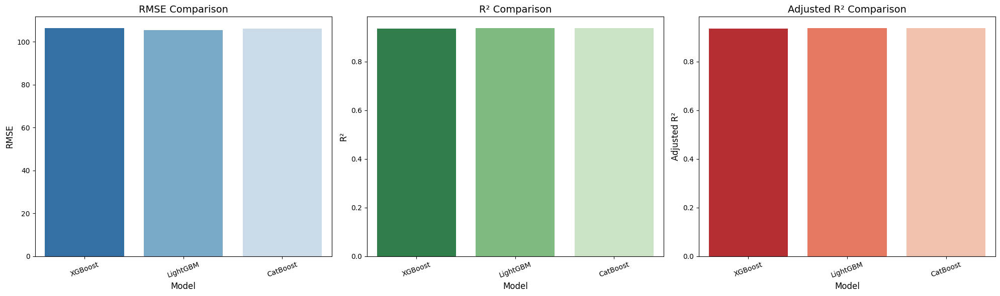

In [ ]:
models = ["XGBoost", "LightGBM", "CatBoost"]


rmse_values = [xgb_rmse, lgb_rmse, CatB_rmse]
r2_values   = [xgb_r2,   lgb_r2,   CatB_r2]
adj_r2_values  = [xgb_adj_r2, lgb_adj_r2, CatB_adj_r2]


fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# RMSE comparison
sns.barplot(x=models, y=rmse_values, palette="Blues_r", ax=axes[0])
axes[0].set_title("RMSE Comparison", fontsize=14)
axes[0].set_ylabel("RMSE", fontsize=12)
axes[0].set_xlabel("Model", fontsize=12)
axes[0].tick_params(axis='x', rotation=20)

# R² comparison
sns.barplot(x=models, y=r2_values, palette="Greens_r", ax=axes[1])
axes[1].set_title("R² Comparison", fontsize=14)
axes[1].set_ylabel("R²", fontsize=12)
axes[1].set_xlabel("Model", fontsize=12)
axes[1].tick_params(axis='x', rotation=20)

#Adjusted R² comparison
sns.barplot(x=models, y=adj_r2_values, palette="Reds_r", ax=axes[2])
axes[2].set_title("Adjusted R² Comparison", fontsize=14)
axes[2].set_ylabel("Adjusted R²", fontsize=12)
axes[2].set_xlabel("Model", fontsize=12)
axes[2].tick_params(axis='x', rotation=20)

plt.tight_layout()
plt.show()


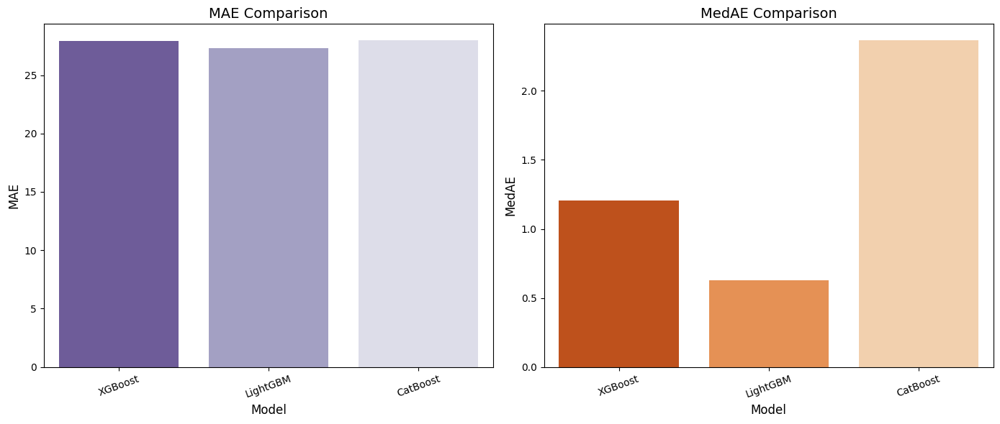

In [ ]:
models = ["XGBoost", "LightGBM", "CatBoost"]

mae_values   = [xgb_mae, lgb_mae, CatB_mae]
medae_values = [xgb_medae, lgb_medae, CatB_mape]

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# MAE comparison
sns.barplot(x=models, y=mae_values, palette="Purples_r", ax=axes[0])
axes[0].set_title("MAE Comparison", fontsize=14)
axes[0].set_ylabel("MAE", fontsize=12)
axes[0].set_xlabel("Model", fontsize=12)
axes[0].tick_params(axis='x', rotation=20)

# MedAE comparison
sns.barplot(x=models, y=medae_values, palette="Oranges_r", ax=axes[1])
axes[1].set_title("MedAE Comparison", fontsize=14)
axes[1].set_ylabel("MedAE", fontsize=12)
axes[1].set_xlabel("Model", fontsize=12)
axes[1].tick_params(axis='x', rotation=20)

plt.tight_layout()
plt.show()


### *2. DL Modles*

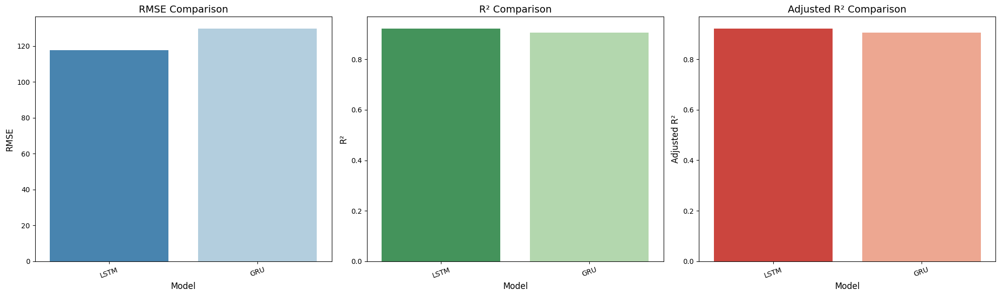

In [ ]:
models = ["LSTM", "GRU"]

rmse_values = [lstm_rmse, gru_rmse]
r2_values   = [lstm_r2,   gru_r2]
adj_r2_values  = [lstm_adj_r2, gru_adj_r2]

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# RMSE comparison
sns.barplot(x=models, y=rmse_values, palette="Blues_r", ax=axes[0])
axes[0].set_title("RMSE Comparison", fontsize=14)
axes[0].set_ylabel("RMSE", fontsize=12)
axes[0].set_xlabel("Model", fontsize=12)
axes[0].tick_params(axis='x', rotation=20)

# R² comparison
sns.barplot(x=models, y=r2_values, palette="Greens_r", ax=axes[1])
axes[1].set_title("R² Comparison", fontsize=14)
axes[1].set_ylabel("R²", fontsize=12)
axes[1].set_xlabel("Model", fontsize=12)
axes[1].tick_params(axis='x', rotation=20)

# Adjusted R² comparison
sns.barplot(x=models, y=adj_r2_values, palette="Reds_r", ax=axes[2])
axes[2].set_title("Adjusted R² Comparison", fontsize=14)
axes[2].set_ylabel("Adjusted R²", fontsize=12)
axes[2].set_xlabel("Model", fontsize=12)
axes[2].tick_params(axis='x', rotation=20)

plt.tight_layout()
plt.show()


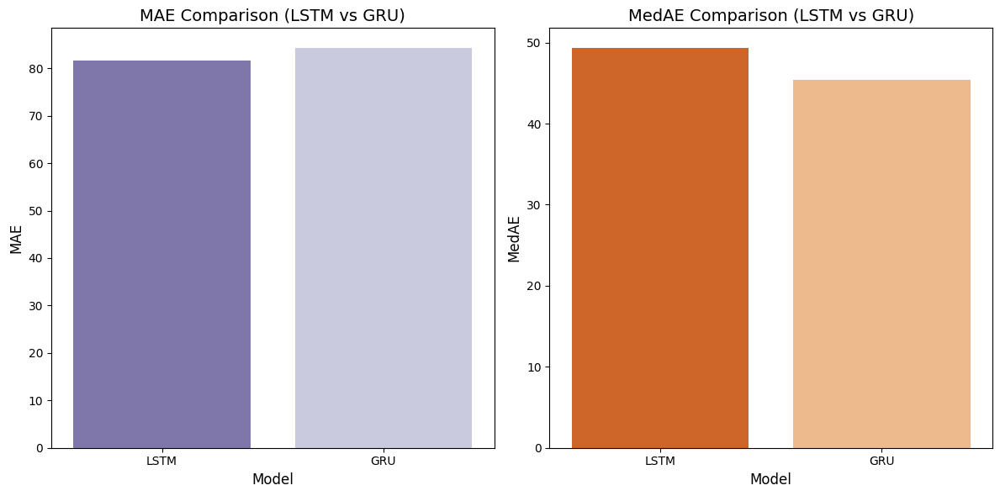

In [ ]:
models = ["LSTM", "GRU"]

mae_values   = [lstm_mae, gru_mae]
medae_values = [lstm_medae, gru_medae]

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# MAE comparison
sns.barplot(x=models, y=mae_values, palette="Purples_r", ax=axes[0])
axes[0].set_title("MAE Comparison (LSTM vs GRU)", fontsize=14)
axes[0].set_ylabel("MAE", fontsize=12)
axes[0].set_xlabel("Model", fontsize=12)

# MedAE comparison
sns.barplot(x=models, y=medae_values, palette="Oranges_r", ax=axes[1])
axes[1].set_title("MedAE Comparison (LSTM vs GRU)", fontsize=14)
axes[1].set_ylabel("MedAE", fontsize=12)
axes[1].set_xlabel("Model", fontsize=12)

plt.tight_layout()
plt.show()


### *3. Prediction Grpah*

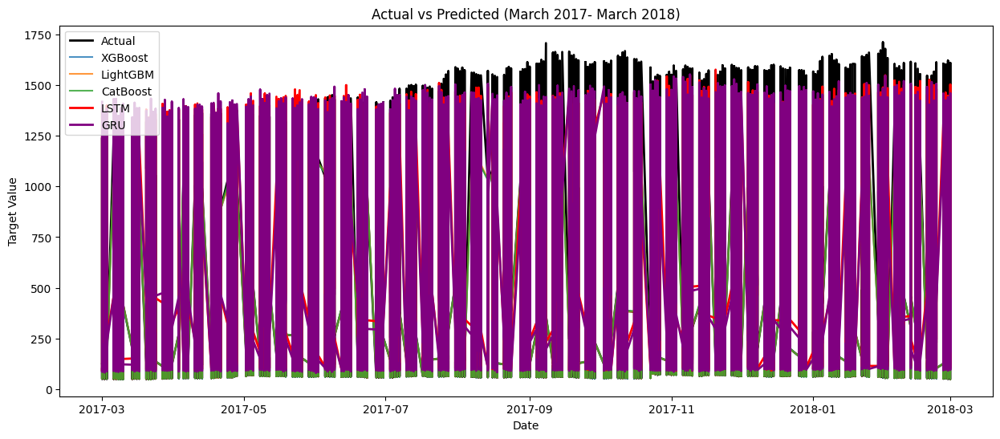

In [ ]:
start_date = "2017-03-01"
end_date   = "2018-03-01"


mask_ml = (y_test.index >= start_date) & (y_test.index <= end_date)

lstm_index = y_test.index[-len(y_pred_lstm):]
gru_index  = y_test.index[-len(y_pred_gru):]

mask_lstm = (lstm_index >= start_date) & (lstm_index <= end_date)
mask_gru  = (gru_index >= start_date) & (gru_index <= end_date)

plt.figure(figsize=(15,6))

plt.plot(y_test.loc[mask_ml].index, y_test.loc[mask_ml],
         label="Actual", color="black", linewidth=2)

# ML Models
plt.plot(y_test.loc[mask_ml].index, y_pred_xgb[mask_ml],
         label="XGBoost", alpha=0.8)
plt.plot(y_test.loc[mask_ml].index, y_pred_lgb[mask_ml],
         label="LightGBM", alpha=0.8)
plt.plot(y_test.loc[mask_ml].index, y_pred_CatB[mask_ml],
         label="CatBoost", alpha=0.8)

# DL Models
plt.plot(lstm_index[mask_lstm], y_pred_lstm.ravel()[mask_lstm],
         label="LSTM", color="red", linewidth=2)
plt.plot(gru_index[mask_gru], y_pred_gru.ravel()[mask_gru],
         label="GRU", color="purple", linewidth=2)

# Formatting
plt.title("Actual vs Predicted (March 2017- March 2018)")
plt.xlabel("Date")
plt.ylabel("Target Value")
plt.legend()
plt.show()
